In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json

In [2]:
from time import time as time
t0 = time()
nfiles = 50
ns_per_sample = 25
window_min = 100
window_max = 500
dwindow = 5

In [3]:
runno = '7479'
Ecut = (2000, 15000)
nwindow = int((window_min - window_max) / dwindow)

In [4]:
def gauss(x, A, m, s):
    return A*np.exp(-(x-m)**2 / (2*s**2))

from scipy.optimize import curve_fit

def exp_dt(sig):
    """
    expected drift distance  as a function of sigma of the S2 signal (Zrms from kdst 2018 version)
    parameters from the ad-hoc fit
    """
    p = [-10.00667732,  52.1855012,   12.68195726,  58.66322846, -20.11819297]
    dt = p[0] * sig**4 + p[1] * sig**3 + p[2]*sig**2 + p[3]*sig + p[4]
    return dt

In [5]:
# indir = '/Volumes/NEXT_data/IC_Data/krThesis/sliding_window_events/variable_window_'+runno+'_all/'
# all_files = [indir+file for file in os.listdir(indir)][:nfiles]

In [6]:
jsondir = '/Volumes/NEXT_data/IC_Data/krThesis/sliding_window_events/variable_window_'+runno+'_json_updated_20201123/'

if nfiles > 0:
    all_jsons = [jsondir+file for file in os.listdir(jsondir)][:nfiles]
else:
    all_jsons = [jsondir+file for file in os.listdir(jsondir)]

In [10]:
all_data = {
    'events_window_maxX' : [],
    'events_window_maxY' : [],
    'events_window_rms' : [],
    'events_window_width' : [],
    'events_window_energy' : [],
    'events_window_charge' : [],
    'events_window_Zrms' : [],
    'events_window_Zgauss' : [],
    'events_window_Wrms' : [],
    'events_window_Wgauss' : [],
    'events_window_GaussOffset' : [],
    'events_prewindow_sums' : [],
    'events_sumwf' : [],
    'events_times' : [],
    'event_numbers' : []
}

n = 0
for filename in all_jsons:
    if n % 10 == 0:
        remaining = (len(all_jsons) - n)*(time() - t0) / (n + 1)
        print(n, '...', round(time() - t0, 1), '; Remaining ~=', round(remaining,1))
    n += 1
    f = open(filename)
    new_dict = json.load(f)
    f.close()
    for k in new_dict.keys():
        all_data[k].extend(new_dict[k])
print('DONE')

0 ... 224.3 ; Remaining ~= 224.3
DONE


In [11]:
events_window_maxX = all_data['events_window_maxX']
events_window_maxY = all_data['events_window_maxY']
events_window_rms = all_data['events_window_rms']
events_window_width = all_data['events_window_maxX']
events_window_energy = all_data['events_window_energy']
events_window_charge = all_data['events_window_charge']
events_window_Zrms = all_data['events_window_Zrms']
events_window_Zgauss = all_data['events_window_Zgauss']
events_sumwf = all_data['events_sumwf']
events_times = all_data['events_times']
events_window_Wrms = all_data['events_window_Wrms']
events_window_Wgauss = all_data['events_window_Wgauss']
events_window_GaussOffset = all_data['events_window_GaussOffset']
events_prewindow_sums = all_data['events_prewindow_sums']

In [10]:
# n_total = len(all_files)
# n = 0
# for filename in all_files:

#     print('Time =', round(time() - t0, 1))
#     t0 = time()
    
#     n += 1
#     print(n, '/', n_total)

#     infile = open(filename, 'r')
    
#     data = infile.read()
#     infile.close()
    
#     events_window_maxX.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got maxX. Next item:', data[:25])
    
#     events_window_maxY.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got maxY. Next item:', data[:25])
    
#     events_window_rms.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got rms. Next item:', data[:25])

#     events_window_width.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got width. Next item:', data[:25])

#     events_window_energy.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got energy. Next item:', data[:25])

#     events_window_charge.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got charge. Next item:', data[:25])

#     events_window_Zrms.extend(eval(data[data.find('=')+1:data.find(']]')+2]))
#     data = data[data.find(']]')+3:]
#     print('Got Zrms. Next item:', data[:25])

#     sum_wf_all = eval(data[data.find('=')+1:data.find(']]')+2].replace('array', 'np.array'))
#     sumwf_last = [ sum_wfs[-1] for sum_wfs in sum_wf_all ]
    
#     events_sumwf.extend(sumwf_last)
#     data = data[data.find(']]')+3:]
#     print('Got sumwf. Next item:', data[:25])

#     times_all = eval(data[data.find('=')+1:data.find(']]')+2].replace('array', 'np.array'))
#     times_last = [ times[-1] for times in times_all ]
    
#     events_times.extend(times_last)
#     data = data[data.find(']]')+3:]
#     print('Got times. Next item:', data[:25])

In [11]:
# events_window_Zrms_single = np.array([ max(z) for z in np.array(events_window_Zrms) ])
# events_window_Zgauss_single = np.array([ max(z) for z in np.array(events_window_Zgauss) ])

# events_Zgauss = []
# maxshow = 100
# shown = 0

# for ievt in range(len(events_window_Zrms)):
#     E = events_window_energy[ievt][-1]
    
#     if E > 100:
        
#         Zrms = 
#         try:
#             mean0 = np.mean(events_times[ievt])
#             amp0 = np.max(events_sumwf[ievt])
#             stdev0 = 5000

#             xdata = events_times[ievt]
#             ydata = events_sumwf[ievt]
#             popt, pcov = curve_fit(gauss, xdata, ydata, p0 = (amp0, mean0, stdev0))
#             amp, mean, stdev = popt

#             Z = exp_dt(stdev/1000)
#             Zrms = events_window_Zrms_single[ievt]

#             if abs(Z - Zrms) > 100:
#                 print('Z, Zrms =', Z, ',', Zrms)
#                 fitdata = gauss(xdata, *popt)
#                 plt.plot(xdata, ydata)
#                 plt.plot(xdata, fitdata, '--', color='r')
#                 plt.show()
#                 shown += 1
#         #except:
#         #    Z = -1
        
#     else:
        
#         Z = -1
        
#     events_Zgauss.append(Z)
    
# events_Zgauss = np.array(events_Zgauss)


In [12]:
print(len(events_window_maxX))
print(len(events_window_maxY))
print(len(events_window_rms))
print(len(events_window_width))
print(len(events_window_energy))
print(len(events_window_charge))
print(len(events_window_Zrms))
print(len(events_sumwf))
print(len(events_times))
print('-------------')
print(len(events_window_maxX[0]))
print(len(events_window_maxY[0]))
print(len(events_window_rms[0]))
print(len(events_window_width[0]))
print(len(events_window_energy[0]))
print(len(events_window_charge[0]))
print(len(events_window_Zrms[0]))
print(len(events_sumwf[0]))
print(len(events_times[0]))

16934
16934
16934
16934
16934
16934
16934
16934
16934
-------------
80
80
80
80
80
80
80
25
25


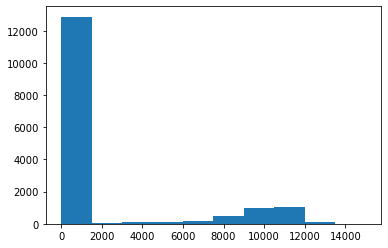

In [13]:
events_energy = [ events_window_energy[e][-1] for e in range(len(events_window_energy)) ]

emax = Ecut[1]
plt.hist(events_energy, bins = 10, range = (0, emax))
plt.show()

In [14]:
events_window_cut_samples = np.arange(window_min, window_max, dwindow)
print(events_window_cut_samples)
events_window_cut = events_window_cut_samples * ns_per_sample * 2
print(events_window_cut)

[100 105 110 115 120 125 130 135 140 145 150 155 160 165 170 175 180 185
 190 195 200 205 210 215 220 225 230 235 240 245 250 255 260 265 270 275
 280 285 290 295 300 305 310 315 320 325 330 335 340 345 350 355 360 365
 370 375 380 385 390 395 400 405 410 415 420 425 430 435 440 445 450 455
 460 465 470 475 480 485 490 495]
[ 5000  5250  5500  5750  6000  6250  6500  6750  7000  7250  7500  7750
  8000  8250  8500  8750  9000  9250  9500  9750 10000 10250 10500 10750
 11000 11250 11500 11750 12000 12250 12500 12750 13000 13250 13500 13750
 14000 14250 14500 14750 15000 15250 15500 15750 16000 16250 16500 16750
 17000 17250 17500 17750 18000 18250 18500 18750 19000 19250 19500 19750
 20000 20250 20500 20750 21000 21250 21500 21750 22000 22250 22500 22750
 23000 23250 23500 23750 24000 24250 24500 24750]


In [15]:
events_window_energy_norm = [ [ peak / max(max(window_energy), 0.1) for peak in window_energy ] for window_energy in events_window_energy ]

In [16]:
# If you are at nth window, then adding 50 ns is (n+1)st window, so adding 5 us is 5,000 ns which is 5,000/50 = 100 bins

##############
EVENT NUMBER 409
##############
Window size at which energy is 0.999: 20750
Zrms = 149.72279766956768


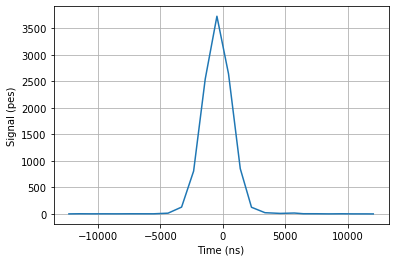

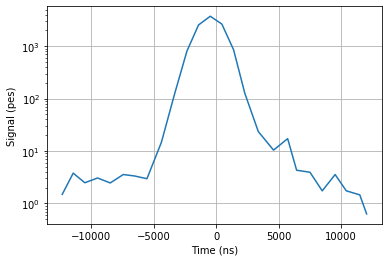

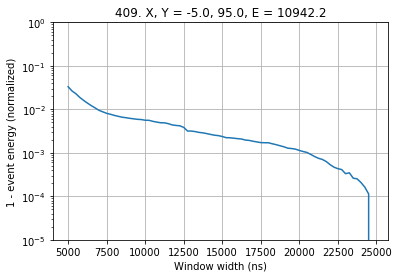

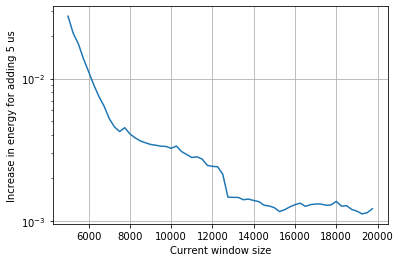

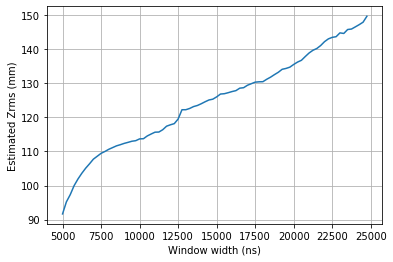

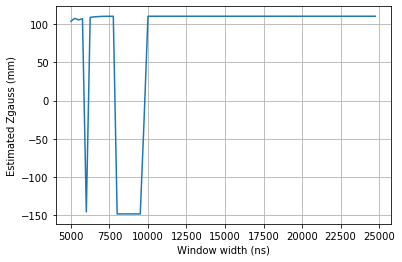

##############
EVENT NUMBER 432
##############
Window size at which energy is 0.999: 23750
Zrms = 86.81779785530733


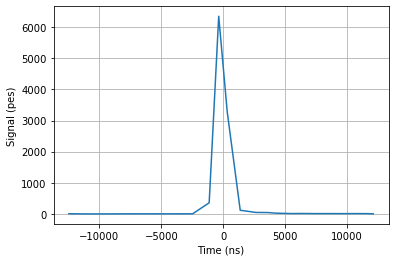

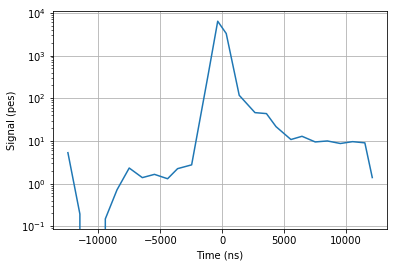

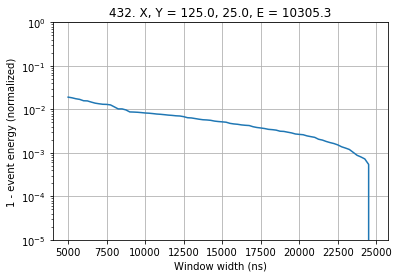

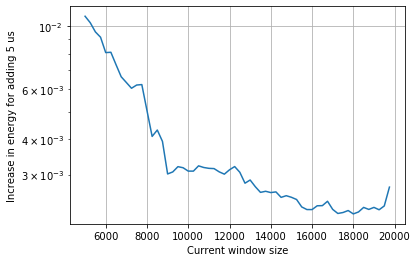

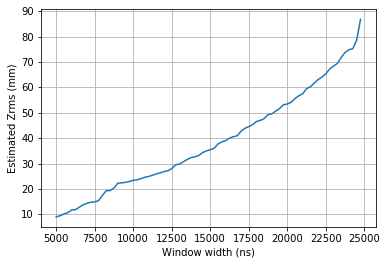

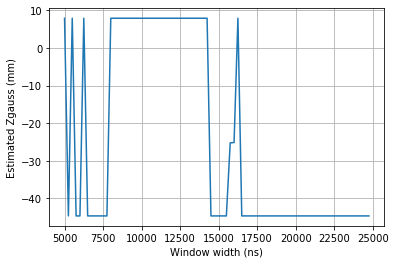

##############
EVENT NUMBER 597
##############
Window size at which energy is 0.999: 21500
Zrms = 116.35995630647929


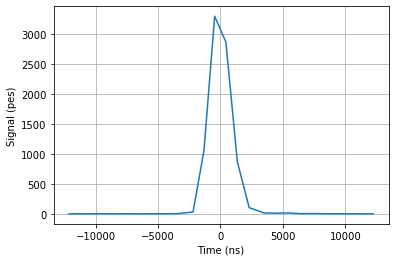

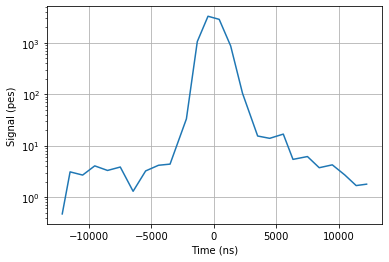

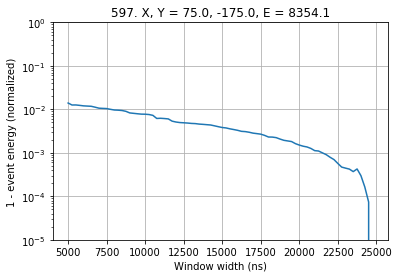

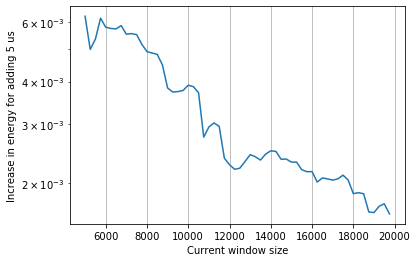

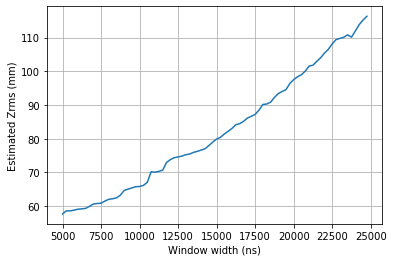

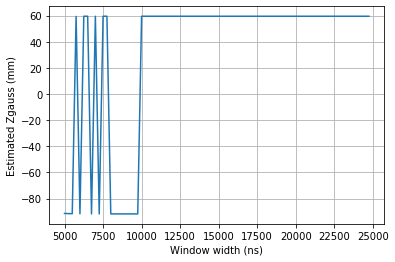

##############
EVENT NUMBER 638
##############
Window size at which energy is 0.999: 20250
Zrms = 208.78873757879433


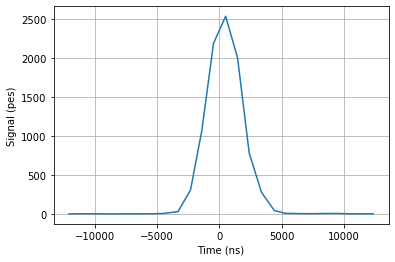

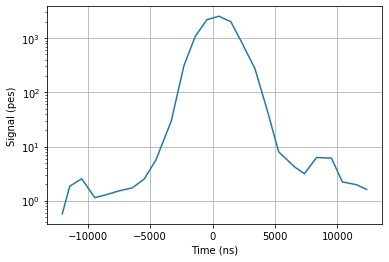

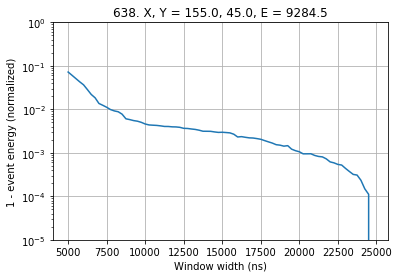

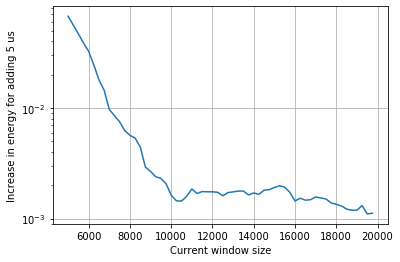

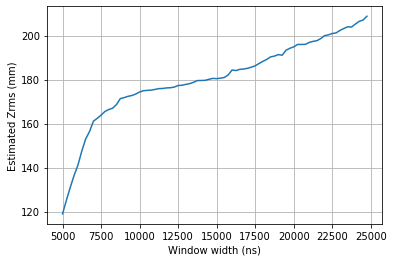

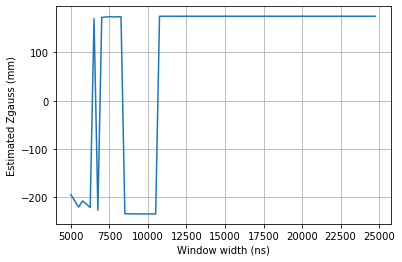

##############
EVENT NUMBER 651
##############
Window size at which energy is 0.999: 21250
Zrms = 126.16024160356972


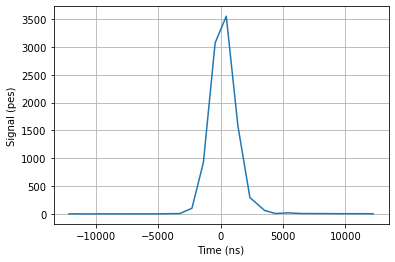

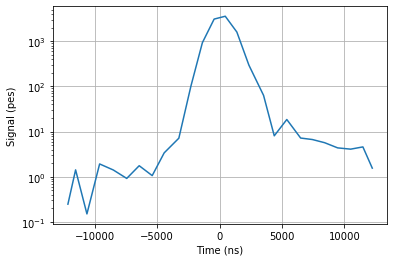

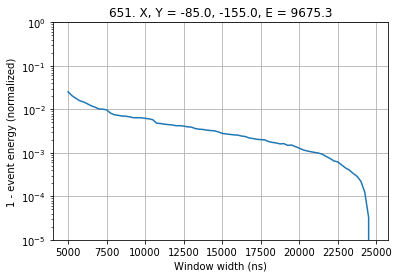

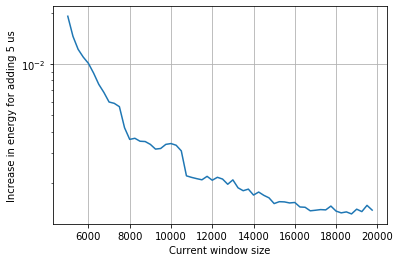

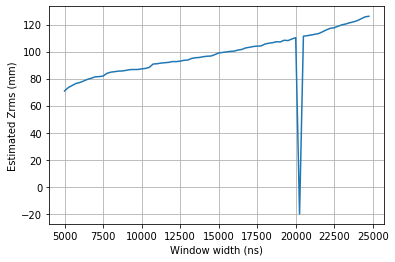

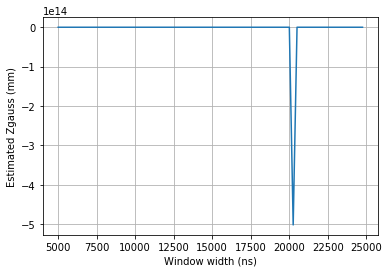

##############
EVENT NUMBER 697
##############
Window size at which energy is 0.999: 23500
Zrms = 127.96847478906804


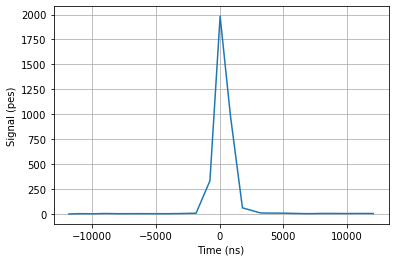

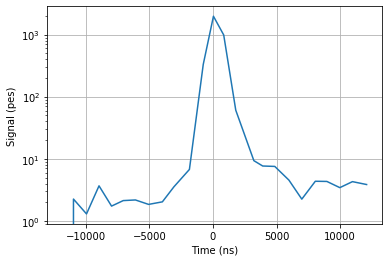

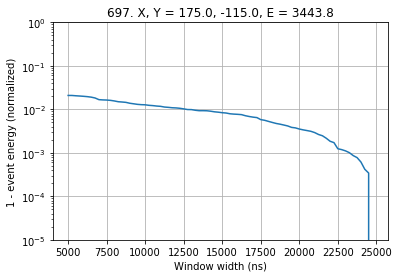

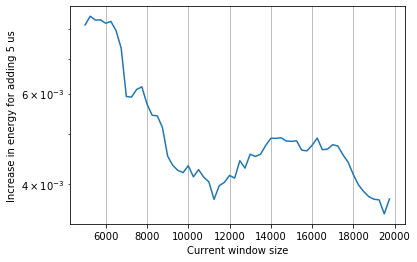

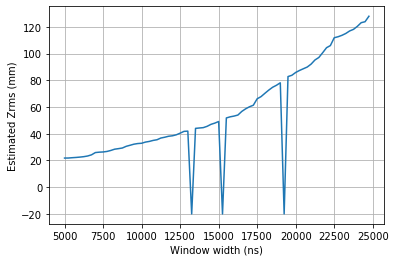

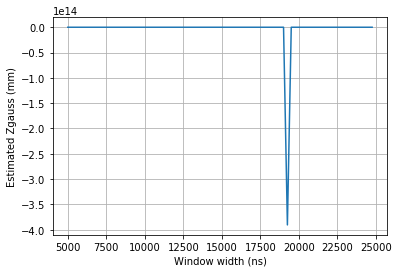

##############
EVENT NUMBER 799
##############
Window size at which energy is 0.999: 20750
Zrms = 113.73949491788346


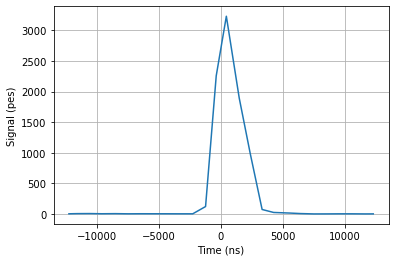

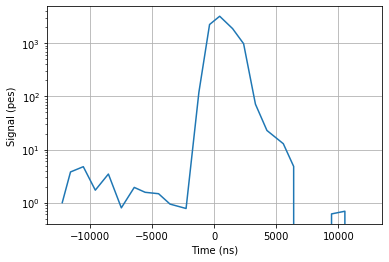

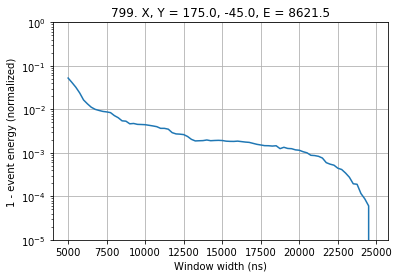

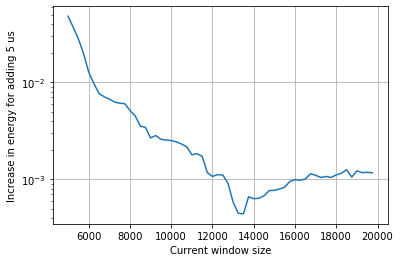

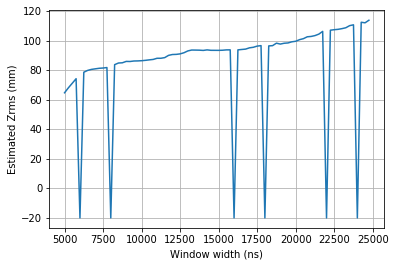

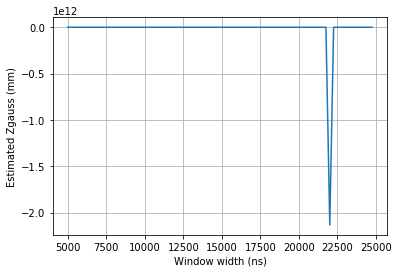

##############
EVENT NUMBER 842
##############
Window size at which energy is 0.999: 21500
Zrms = 41.36019767582515


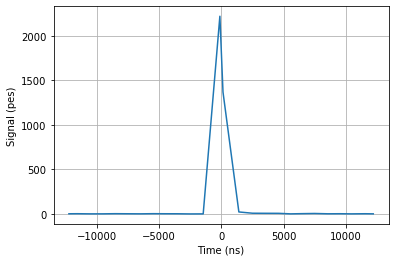

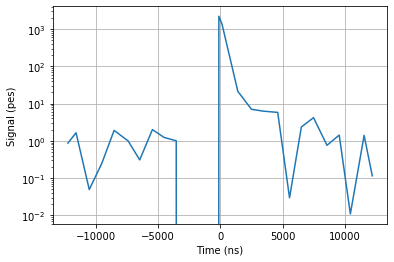

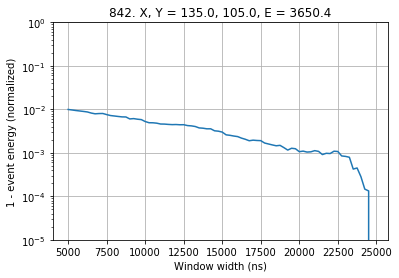

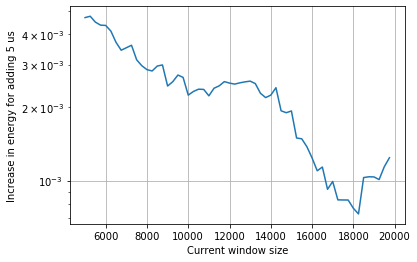

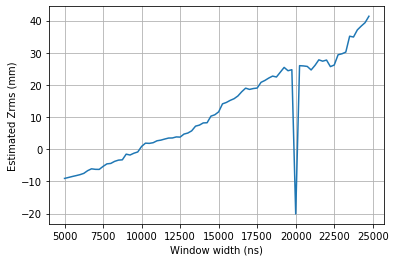

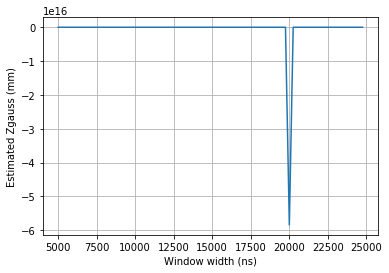

##############
EVENT NUMBER 1145
##############
Window size at which energy is 0.999: 20500
Zrms = 288.38252855956154


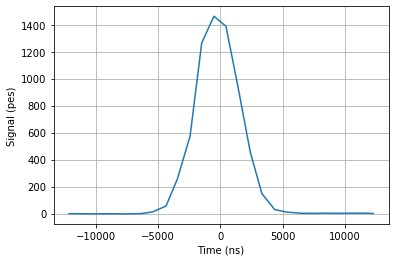

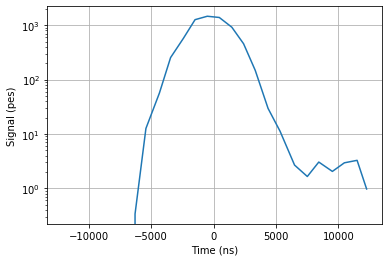

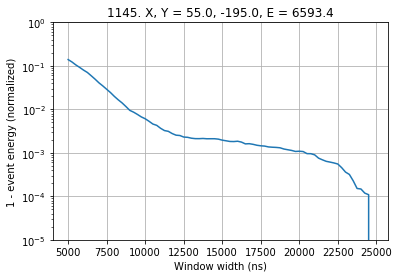

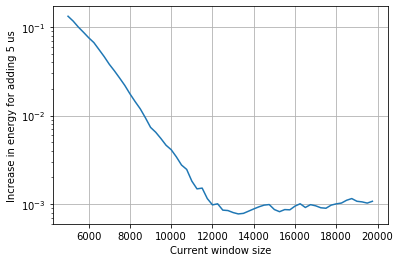

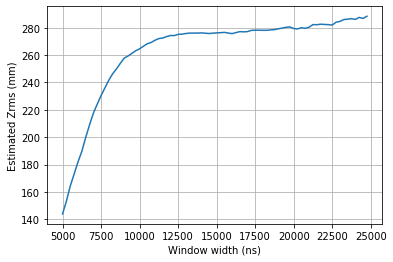

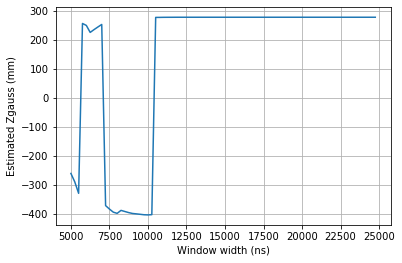

##############
EVENT NUMBER 1281
##############
Window size at which energy is 0.999: 21000
Zrms = 293.6572010281004


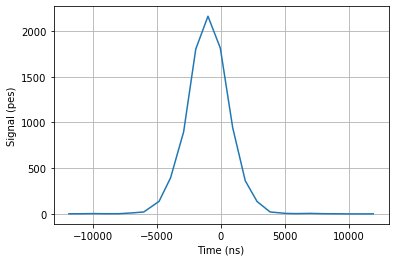

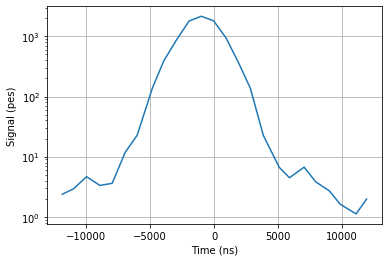

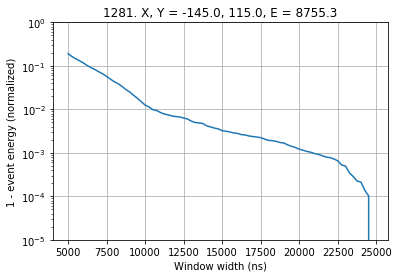

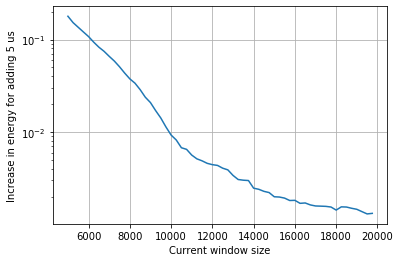

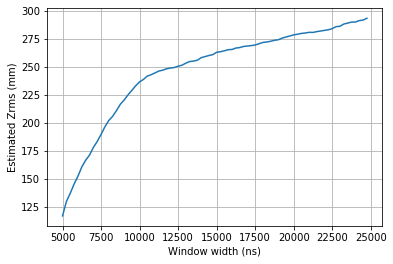

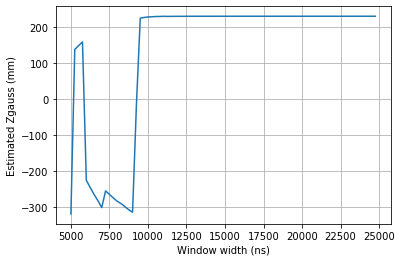

##############
EVENT NUMBER 1351
##############
Window size at which energy is 0.999: 21500
Zrms = 67.45701778935513


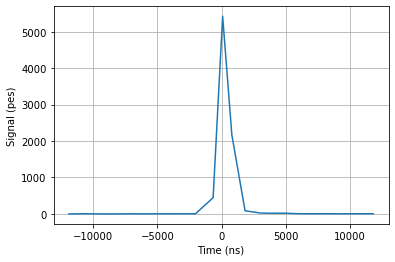

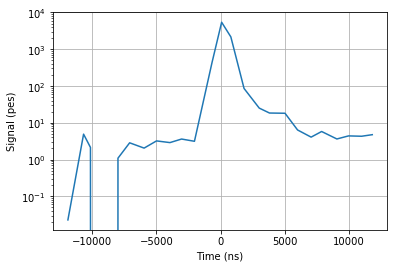

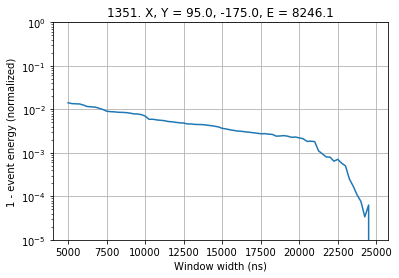

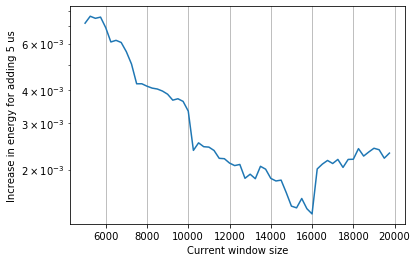

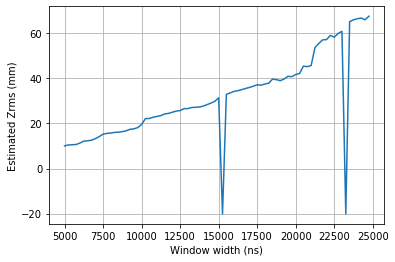

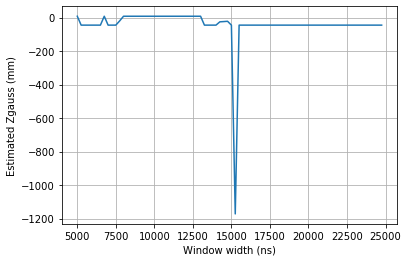

##############
EVENT NUMBER 1396
##############
Window size at which energy is 0.999: 22000
Zrms = 78.37635291695648


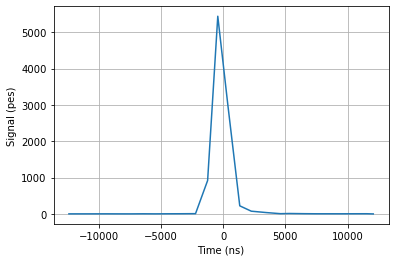

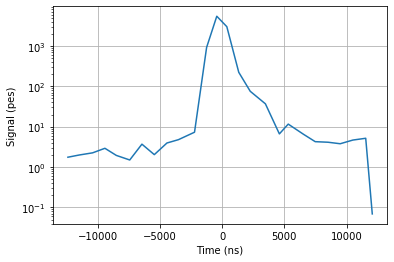

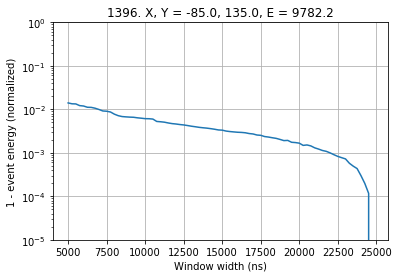

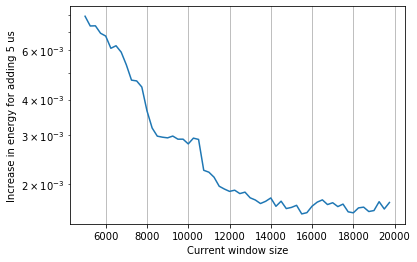

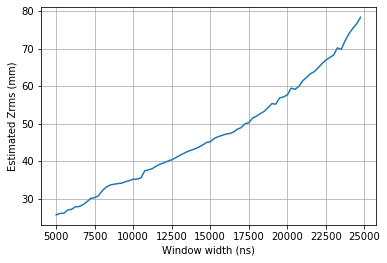

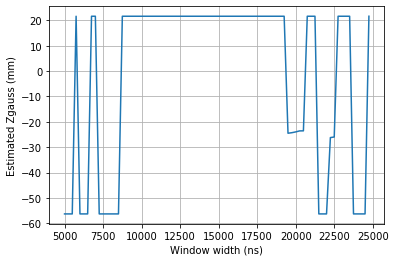

##############
EVENT NUMBER 1406
##############
Window size at which energy is 0.999: 21750
Zrms = 55.75628090362136


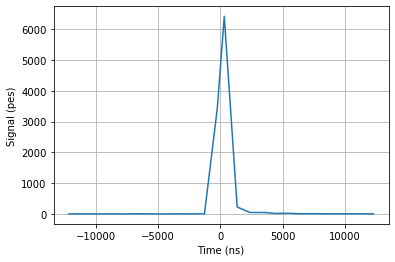

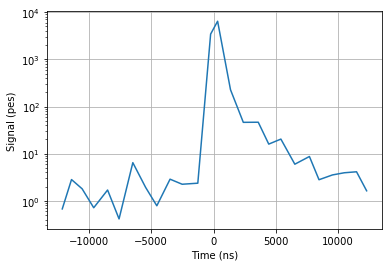

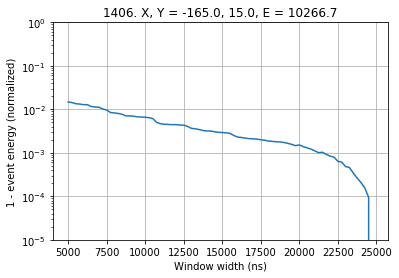

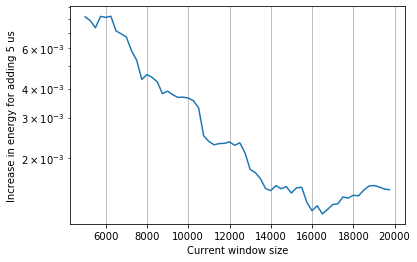

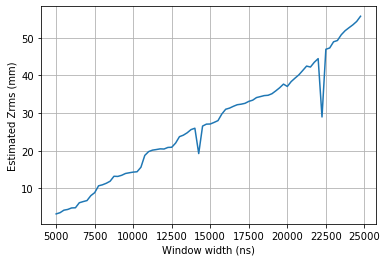

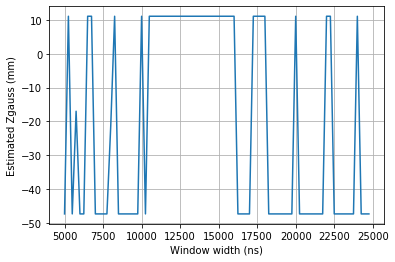

##############
EVENT NUMBER 1422
##############
Window size at which energy is 0.999: 21250
Zrms = 193.26138899029584


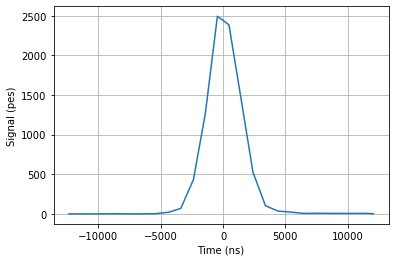

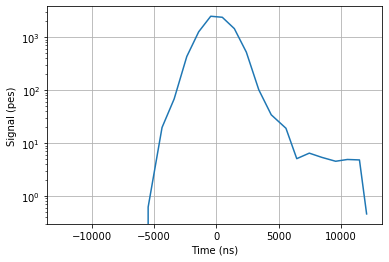

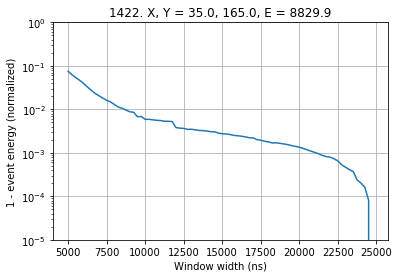

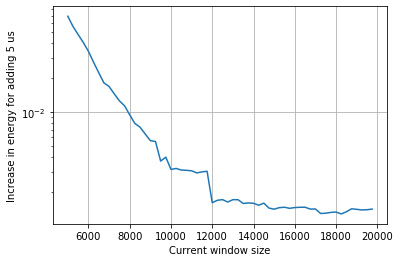

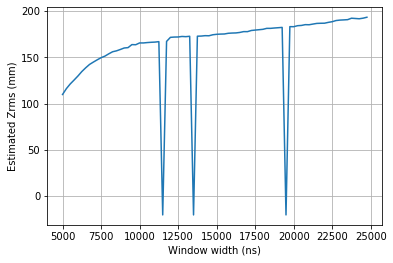

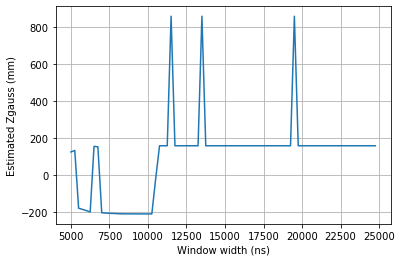

##############
EVENT NUMBER 1440
##############
Window size at which energy is 0.999: 22750
Zrms = 294.9098532859073


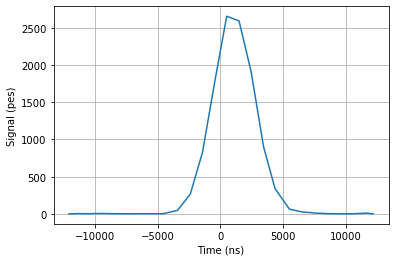

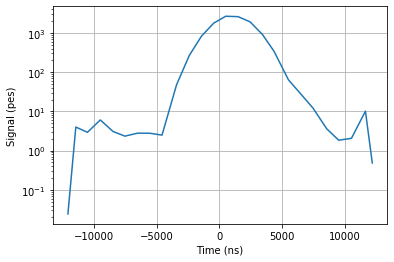

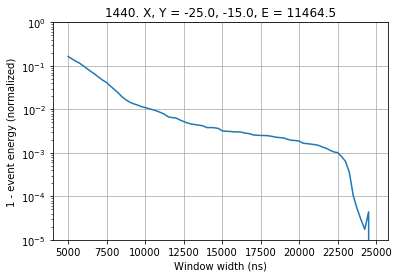

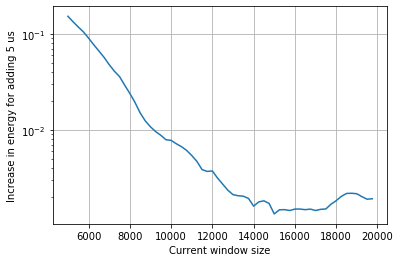

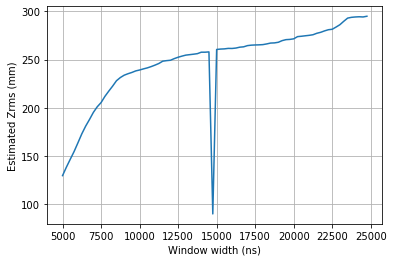

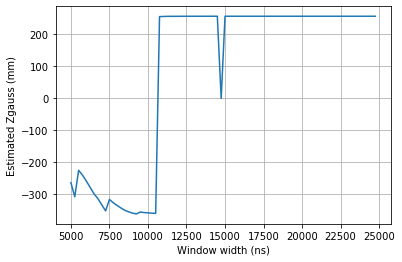

##############
EVENT NUMBER 1445
##############
Window size at which energy is 0.999: 21500
Zrms = 102.02912091455953


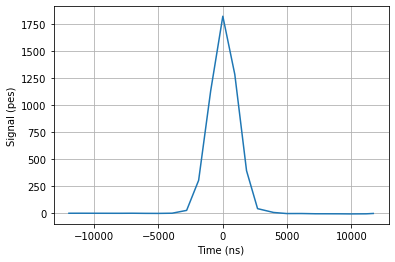

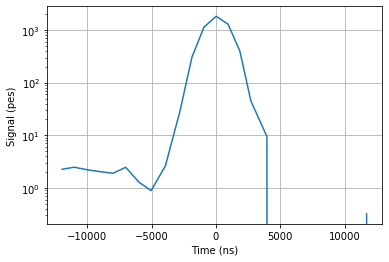

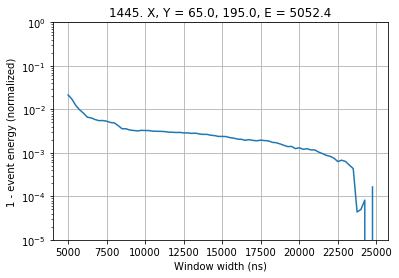

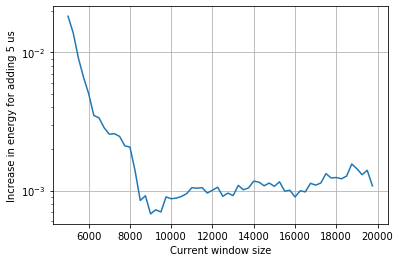

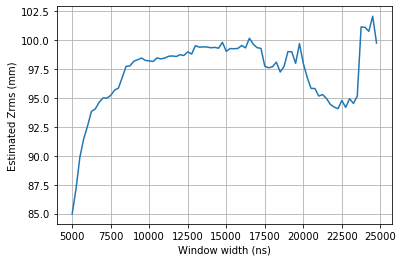

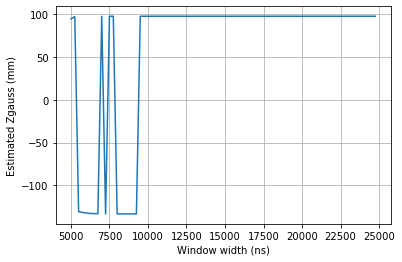

##############
EVENT NUMBER 1481
##############
Window size at which energy is 0.999: 20750
Zrms = 163.50396716183727


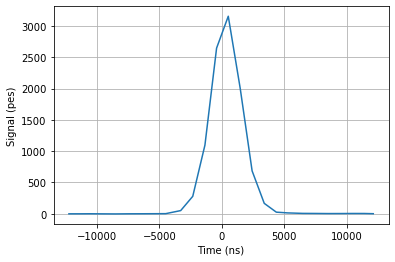

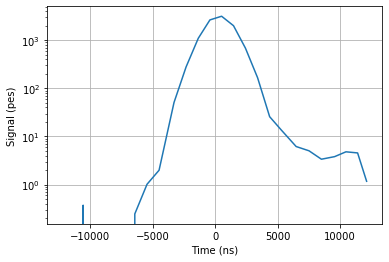

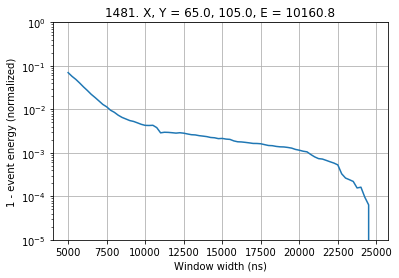

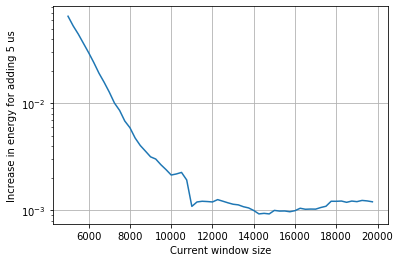

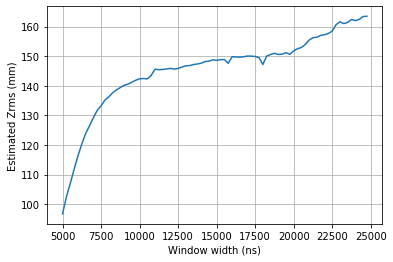

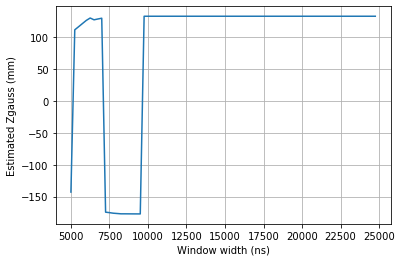

##############
EVENT NUMBER 1514
##############
Window size at which energy is 0.999: 21250
Zrms = 78.97245873095186


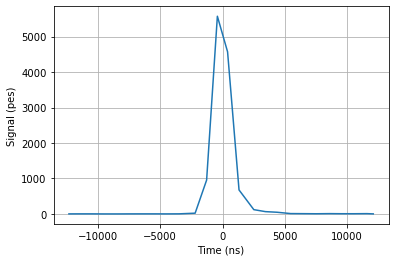

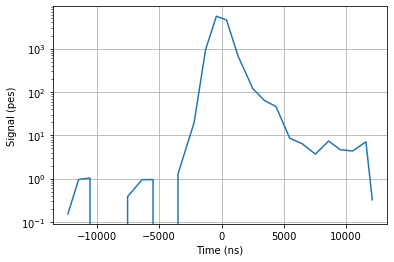

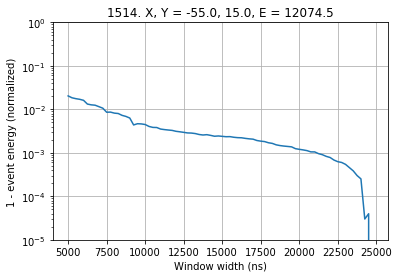

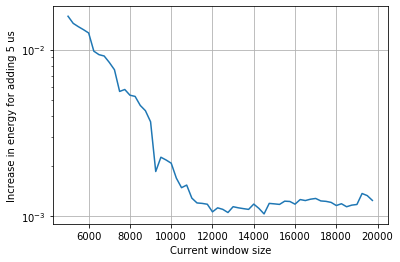

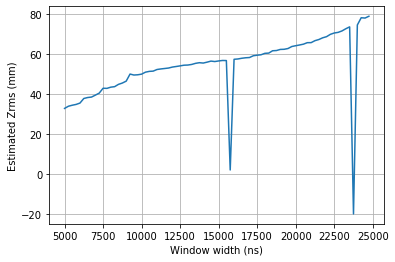

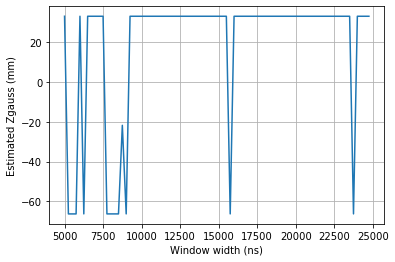

##############
EVENT NUMBER 1615
##############
Window size at which energy is 0.999: 21000
Zrms = 51.66940510799688


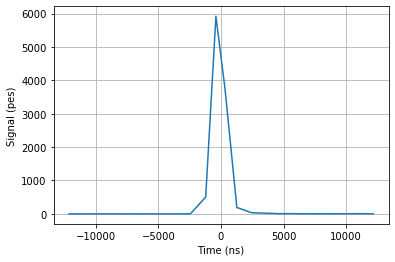

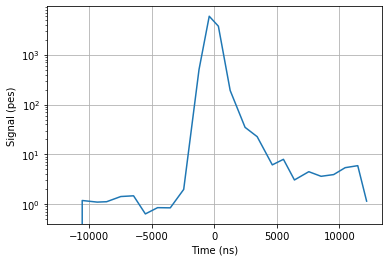

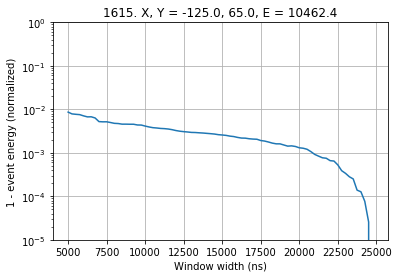

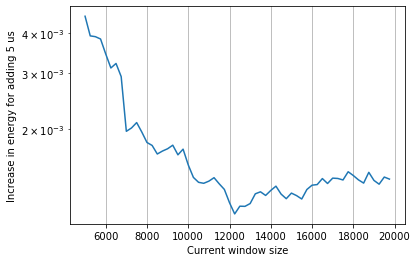

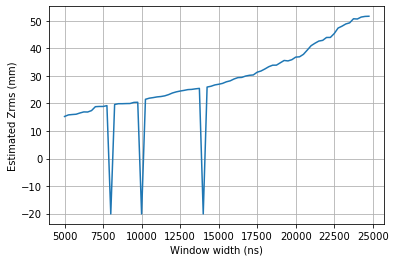

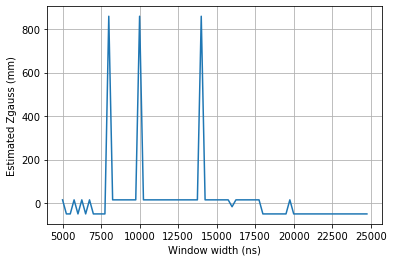

##############
EVENT NUMBER 1793
##############
Window size at which energy is 0.999: 22000
Zrms = 200.36617075177577


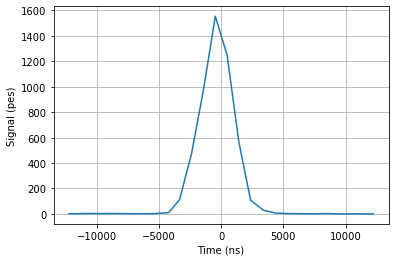

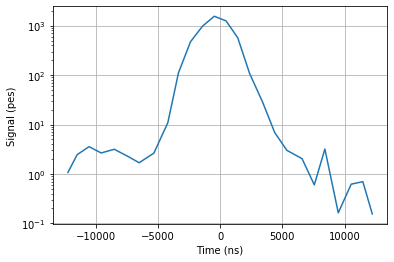

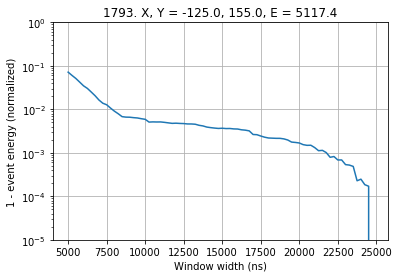

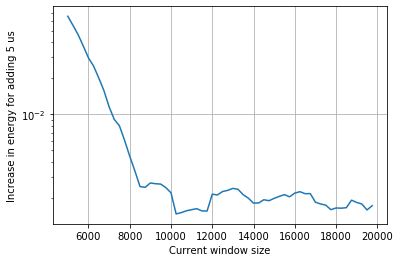

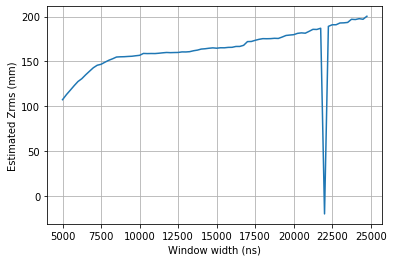

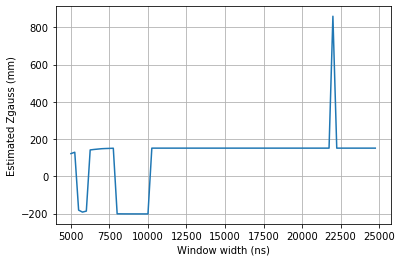

##############
EVENT NUMBER 1887
##############
Window size at which energy is 0.999: 20500
Zrms = 188.090135014293


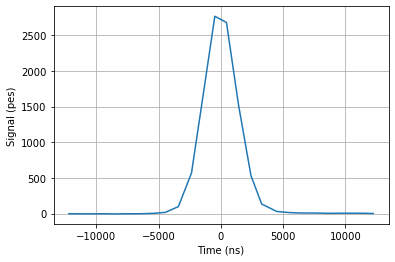

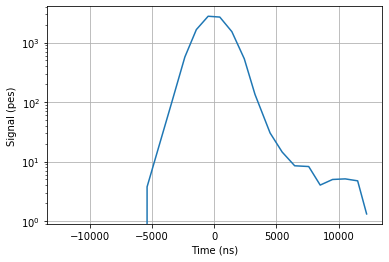

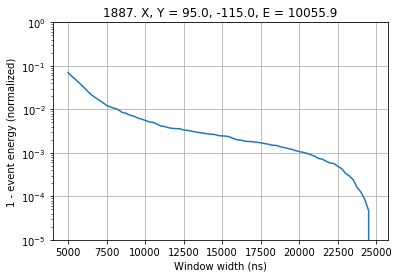

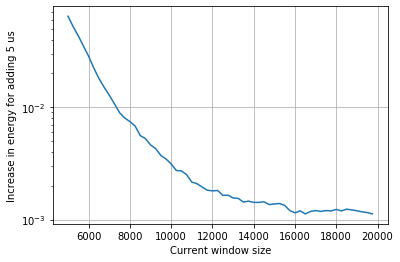

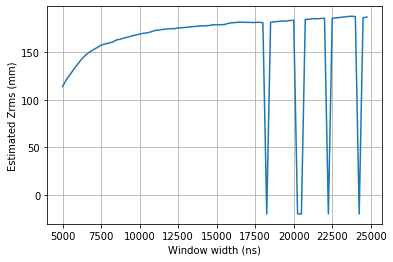

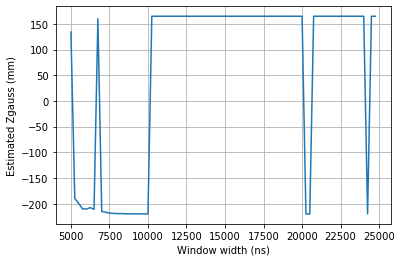

##############
EVENT NUMBER 1894
##############
Window size at which energy is 0.999: 22250
Zrms = 246.2148844988473


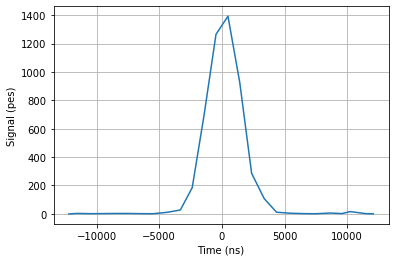

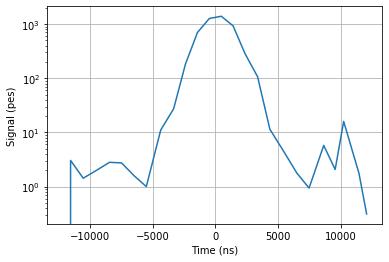

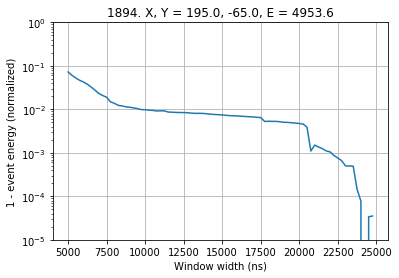

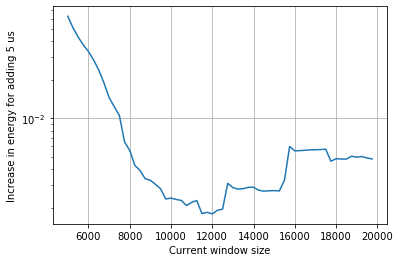

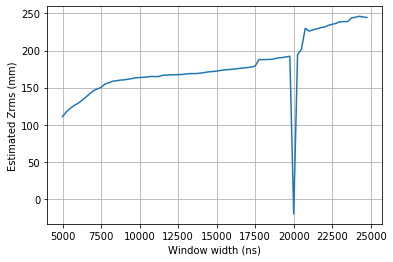

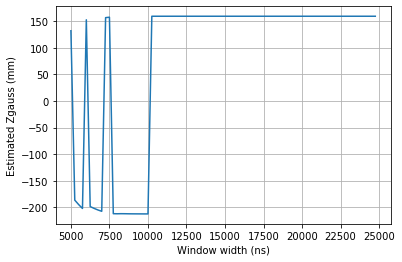

##############
EVENT NUMBER 2050
##############
Window size at which energy is 0.999: 21500
Zrms = 288.56022992457827


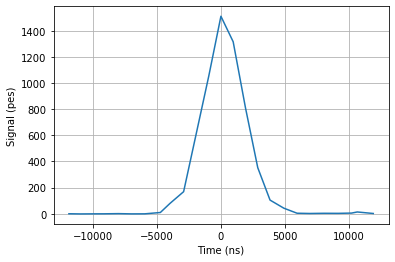

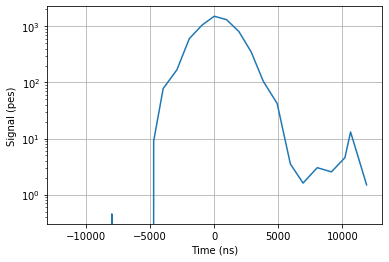

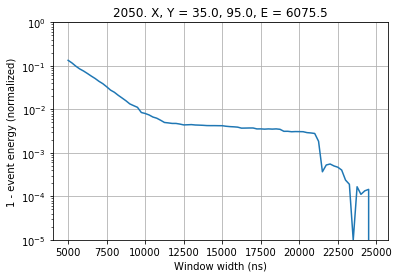

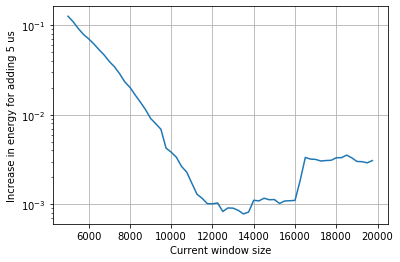

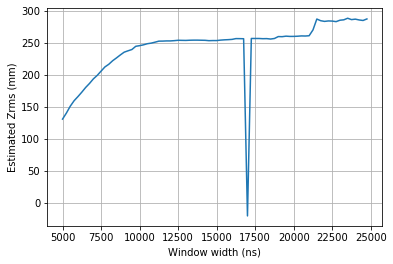

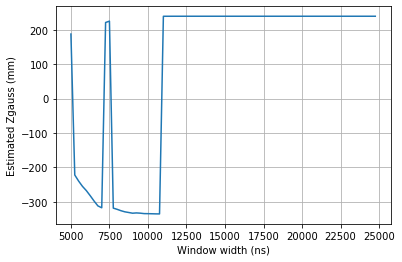

##############
EVENT NUMBER 2162
##############
Window size at which energy is 0.999: 20750
Zrms = 245.14888013849736


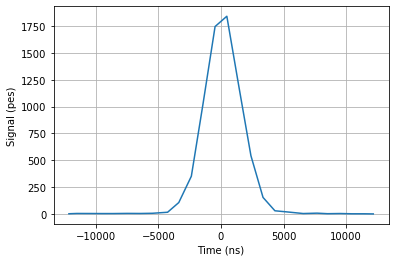

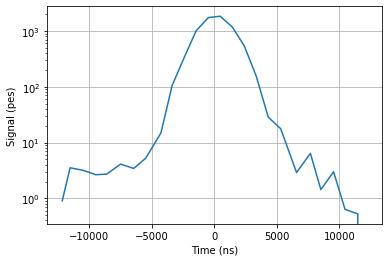

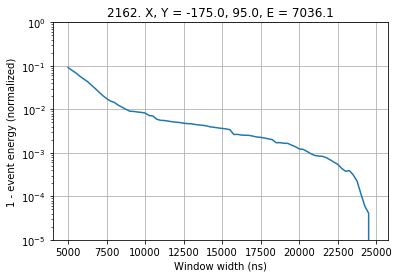

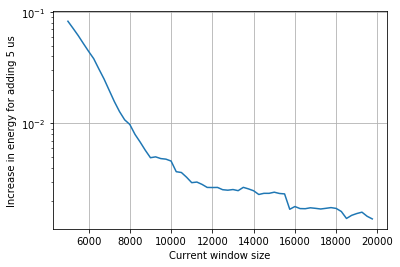

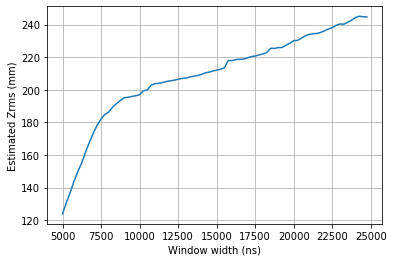

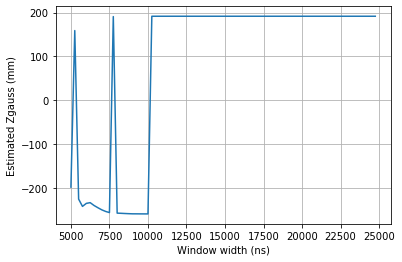

##############
EVENT NUMBER 2206
##############
Window size at which energy is 0.999: 21000
Zrms = 48.03649237400094


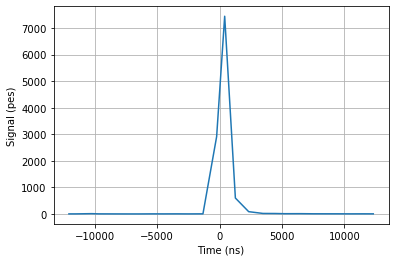

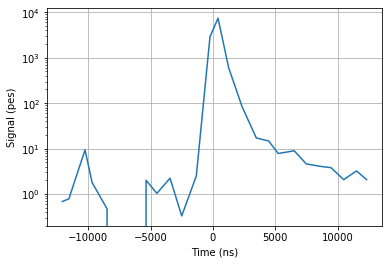

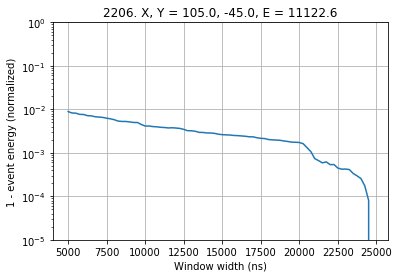

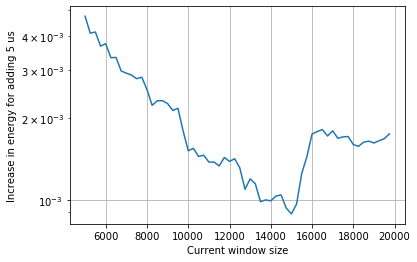

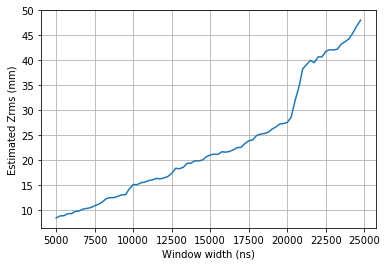

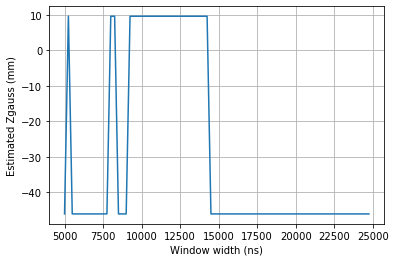

##############
EVENT NUMBER 2239
##############
Window size at which energy is 0.999: 20250
Zrms = 64.28711067654447


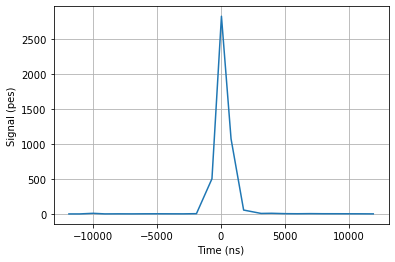

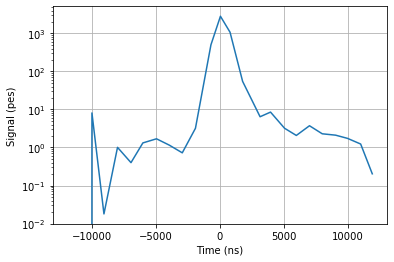

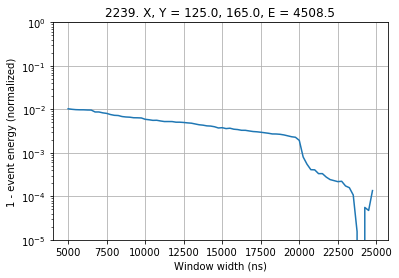

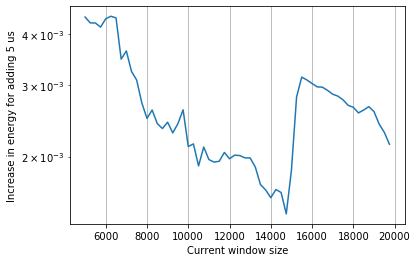

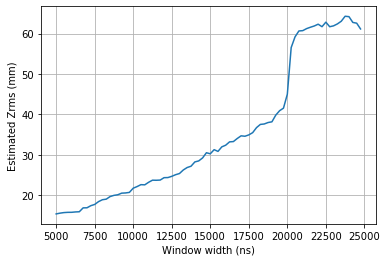

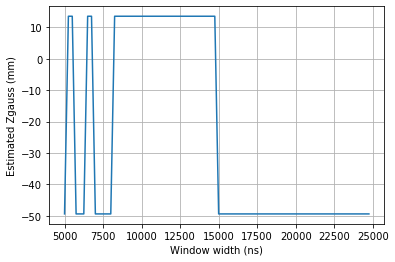

##############
EVENT NUMBER 2264
##############
Window size at which energy is 0.999: 20500
Zrms = 211.92097860546824


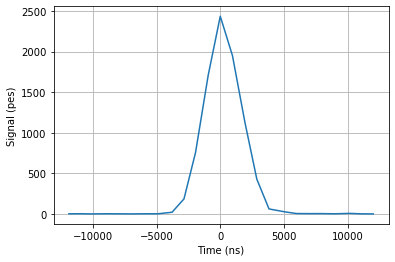

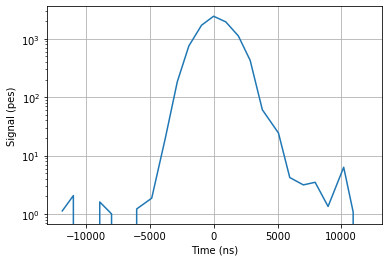

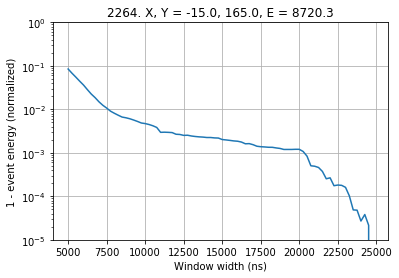

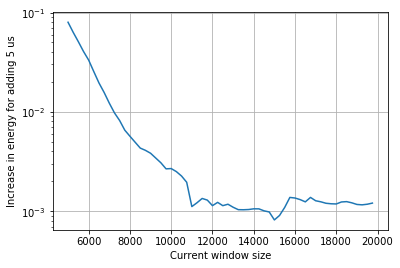

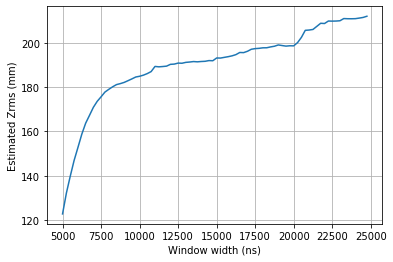

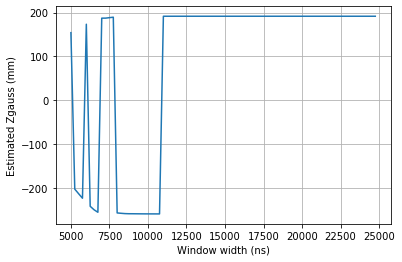

##############
EVENT NUMBER 2271
##############
Window size at which energy is 0.999: 21750
Zrms = 186.79829950099332


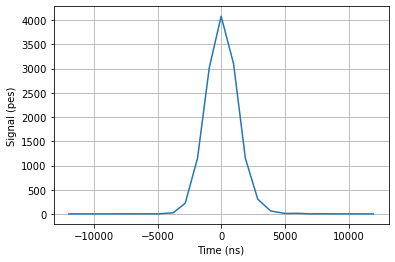

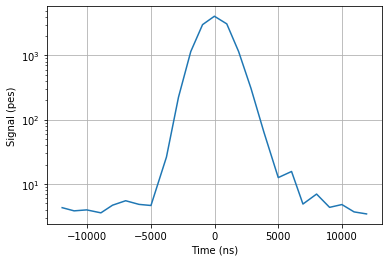

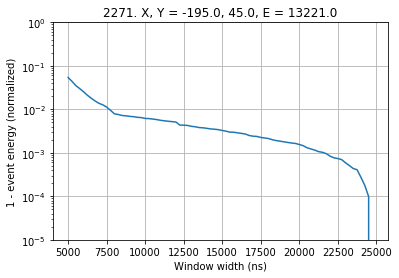

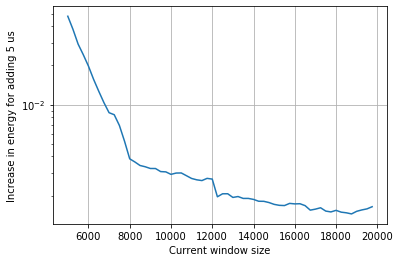

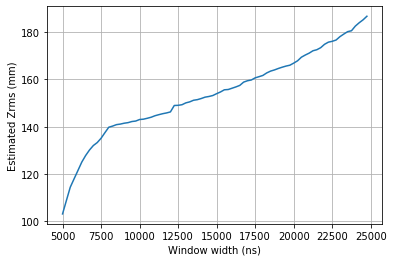

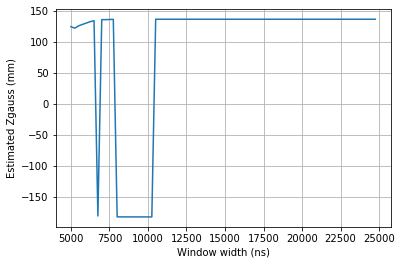

##############
EVENT NUMBER 2336
##############
Window size at which energy is 0.999: 23250
Zrms = 219.09639100809778


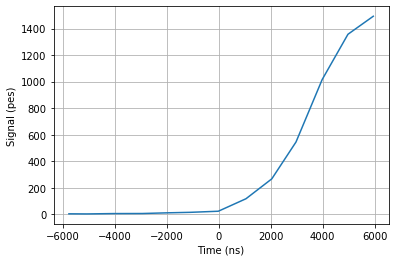

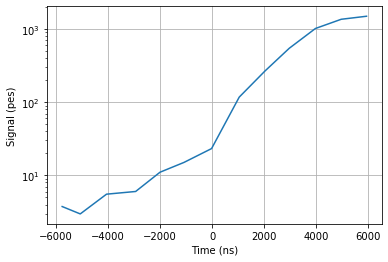

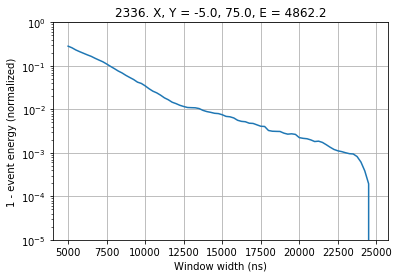

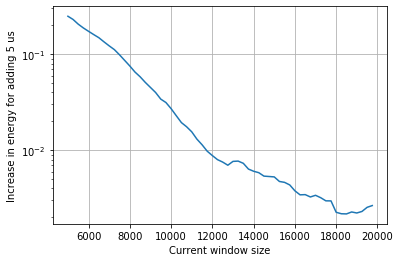

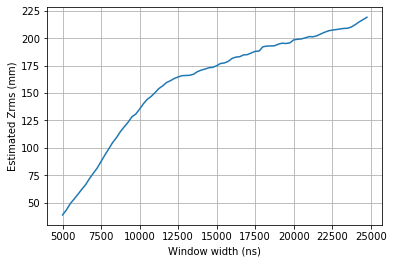

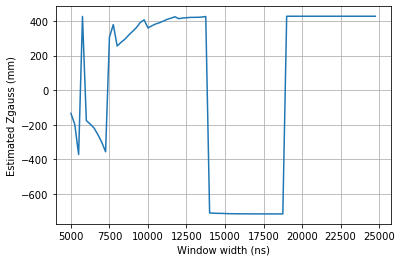

##############
EVENT NUMBER 2445
##############
Window size at which energy is 0.999: 21000
Zrms = 193.92877244767362


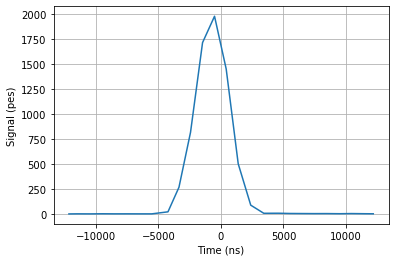

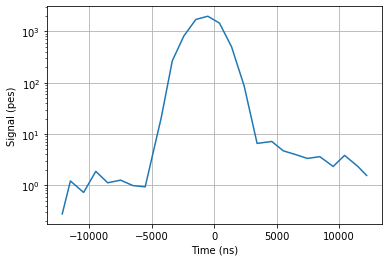

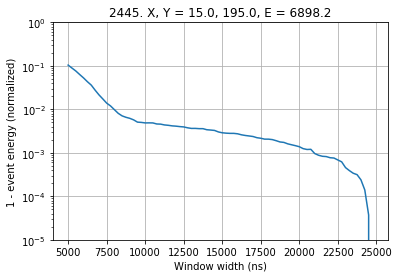

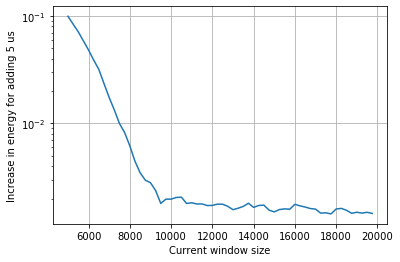

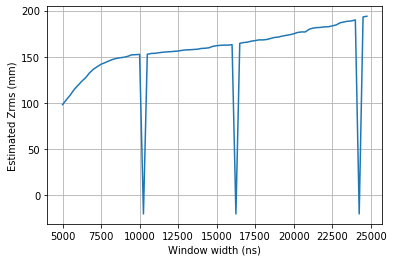

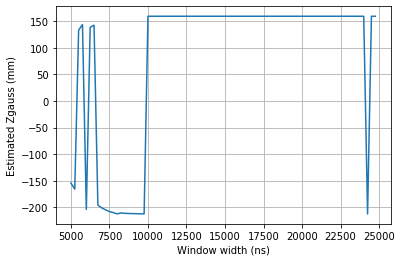

##############
EVENT NUMBER 2488
##############
Window size at which energy is 0.999: 20750
Zrms = 258.84633852842825


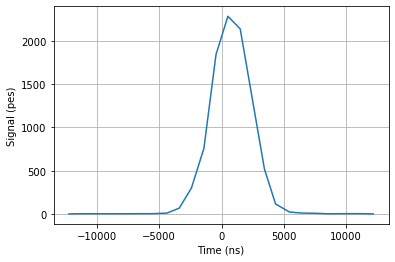

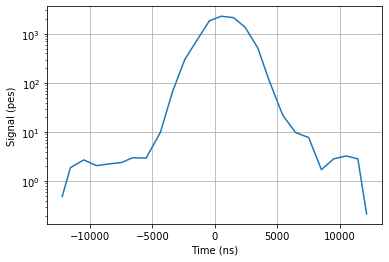

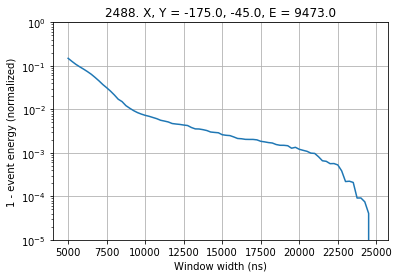

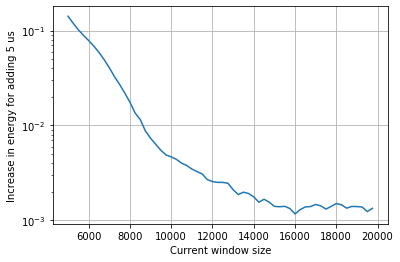

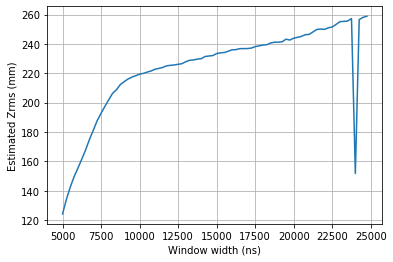

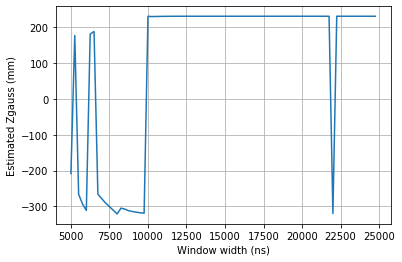

##############
EVENT NUMBER 2525
##############
Window size at which energy is 0.999: 21250
Zrms = 173.14579315911098


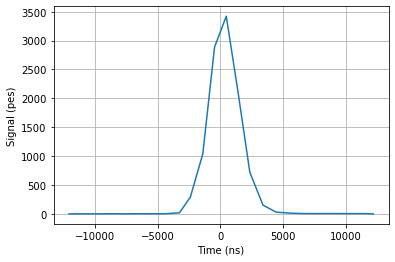

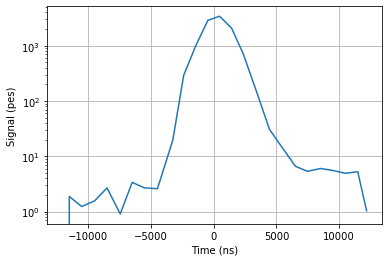

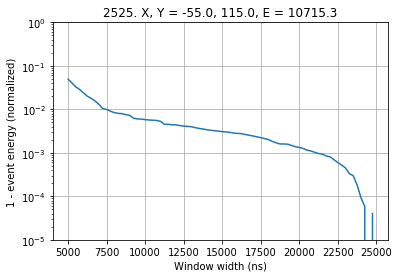

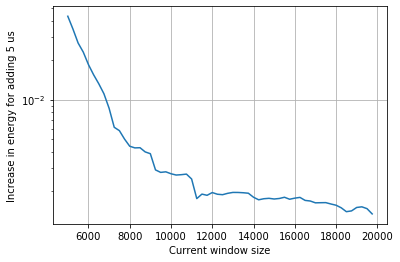

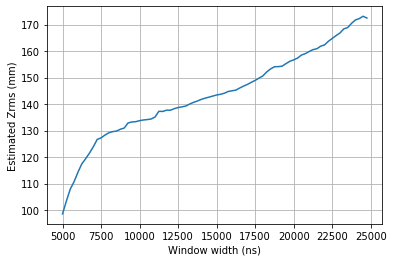

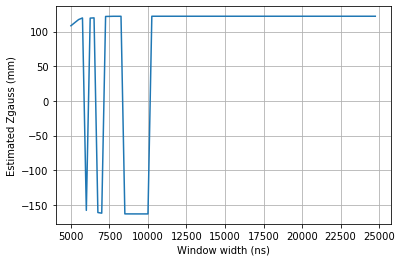

##############
EVENT NUMBER 2725
##############
Window size at which energy is 0.999: 21000
Zrms = 122.35189979865405


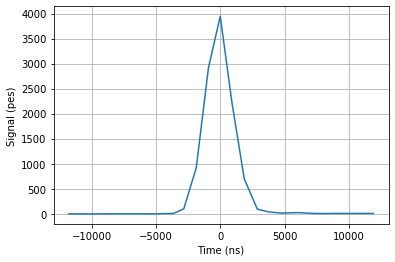

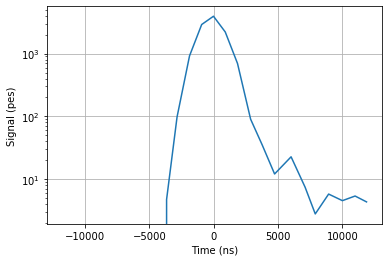

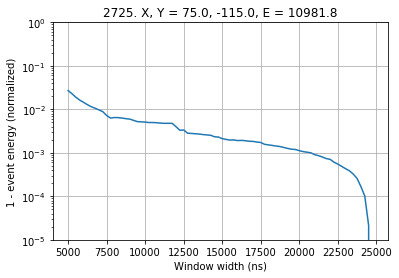

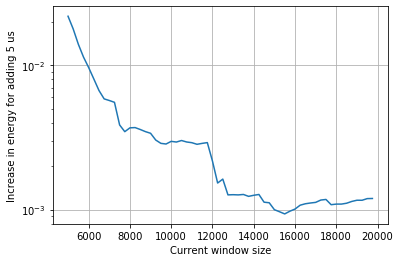

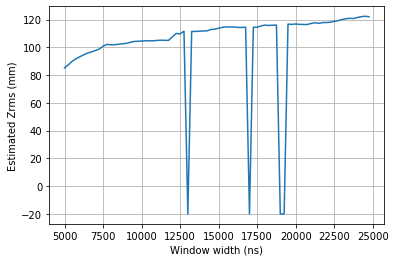

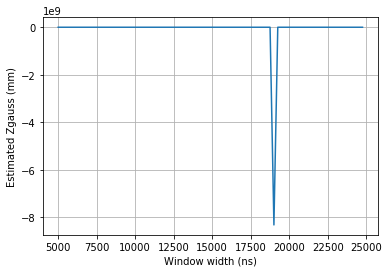

##############
EVENT NUMBER 2786
##############
Window size at which energy is 0.999: 21250
Zrms = 89.04910133186354


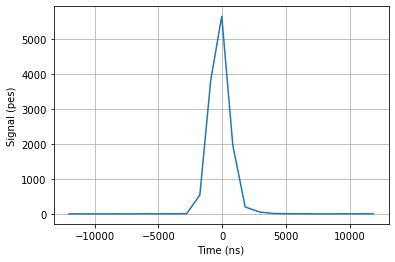

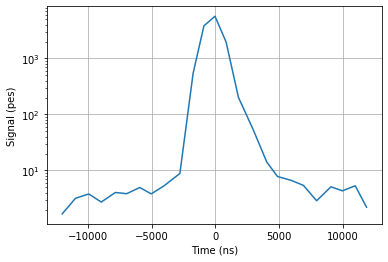

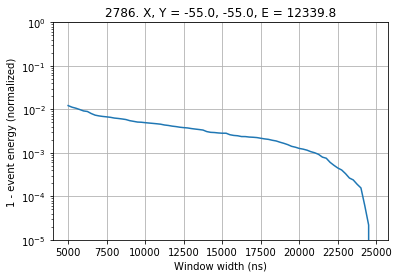

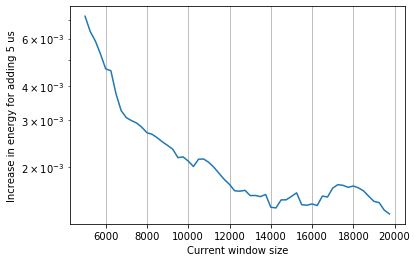

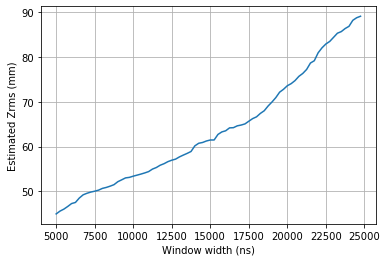

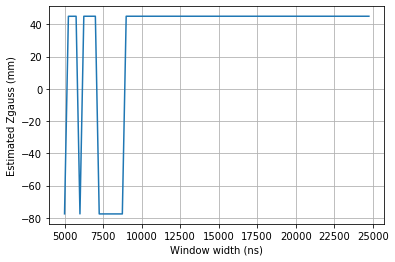

##############
EVENT NUMBER 2897
##############
Window size at which energy is 0.999: 21500
Zrms = 48.72668461313077


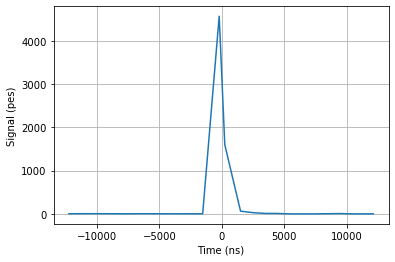

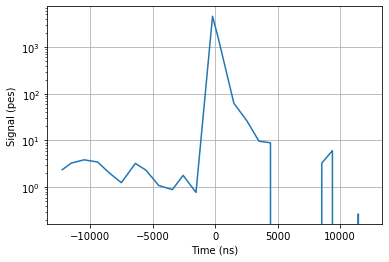

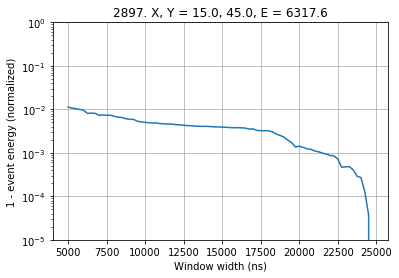

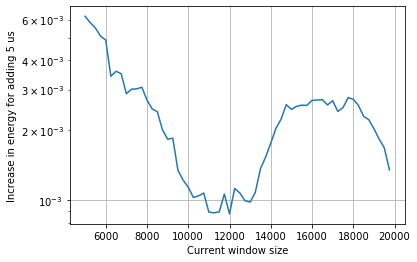

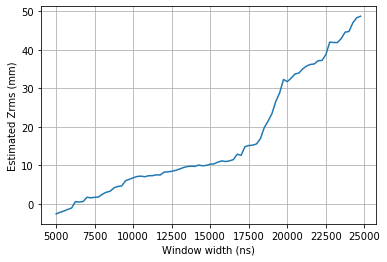

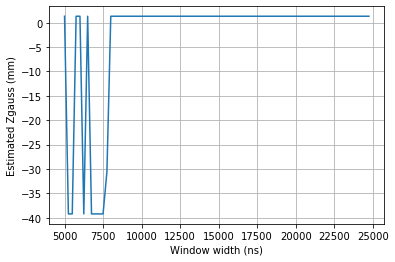

##############
EVENT NUMBER 2963
##############
Window size at which energy is 0.999: 22500
Zrms = 94.73180983354088


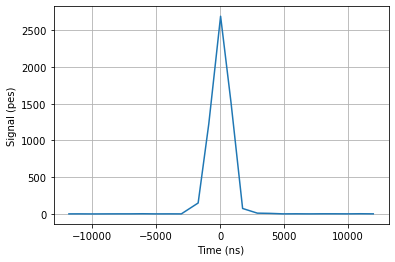

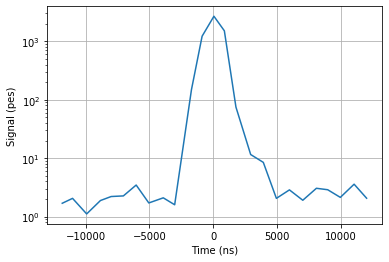

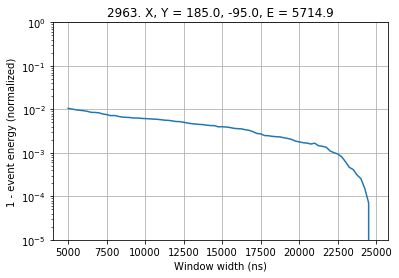

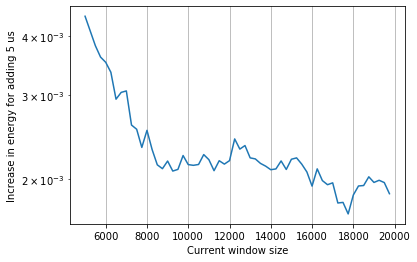

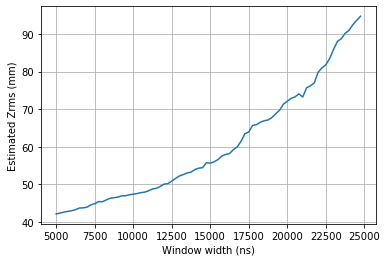

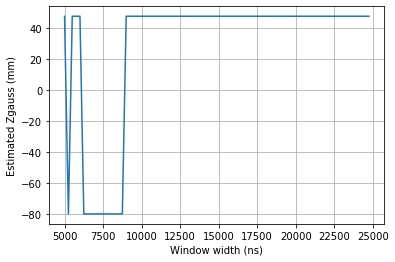

##############
EVENT NUMBER 2994
##############
Window size at which energy is 0.999: 22500
Zrms = 52.06918288570418


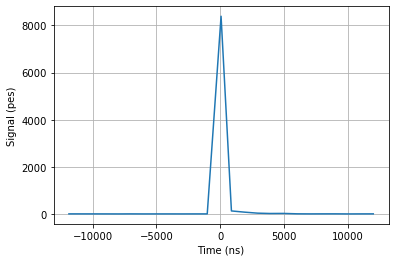

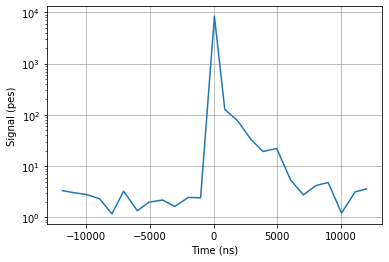

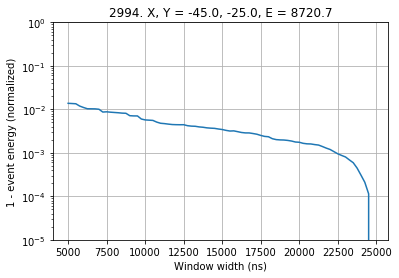

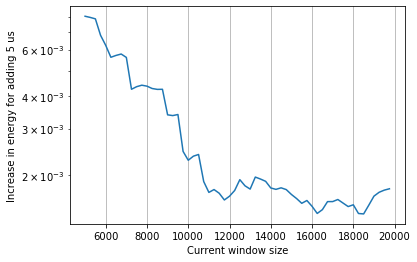

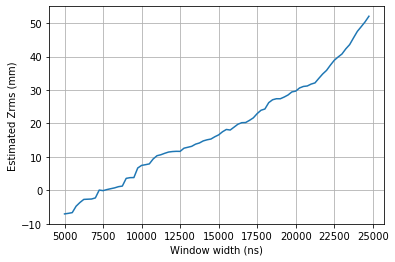

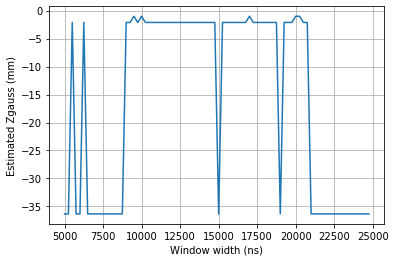

##############
EVENT NUMBER 2999
##############
Window size at which energy is 0.999: 20750
Zrms = 56.50029667724489


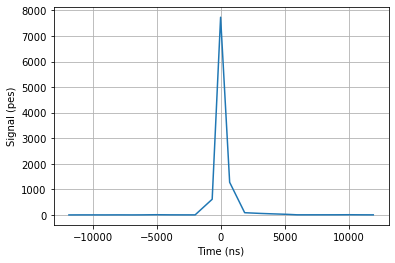

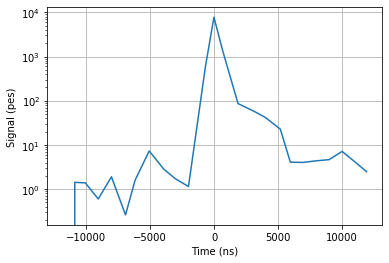

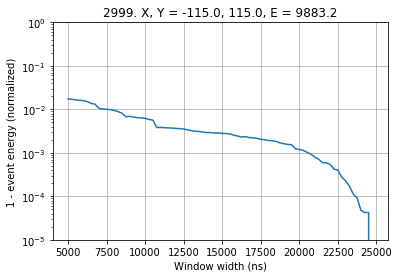

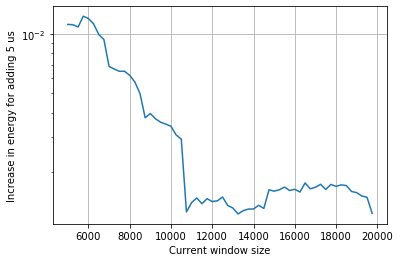

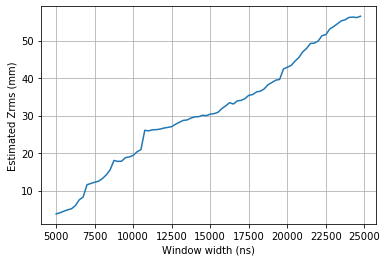

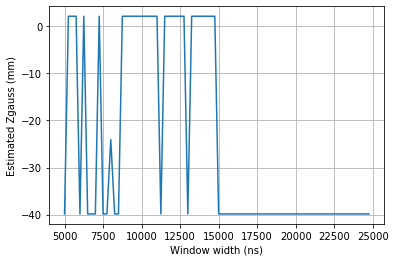

##############
EVENT NUMBER 3169
##############
Window size at which energy is 0.999: 21750
Zrms = 194.18458752635252


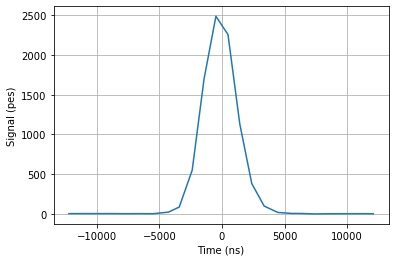

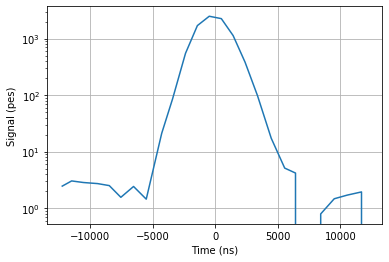

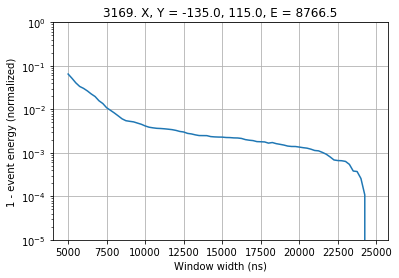

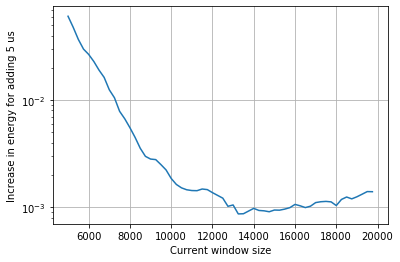

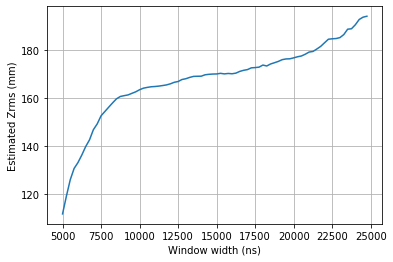

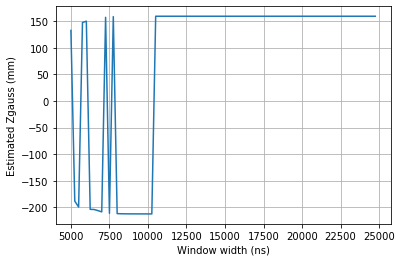

##############
EVENT NUMBER 3200
##############
Window size at which energy is 0.999: 20500
Zrms = 121.50947999935218


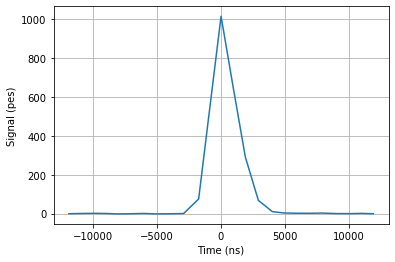

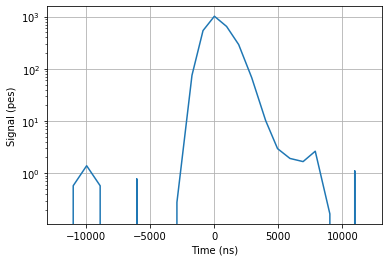

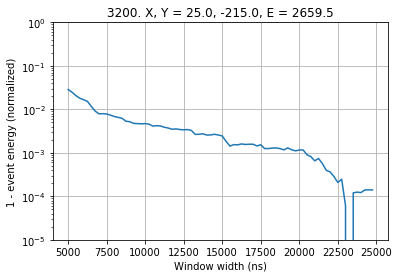

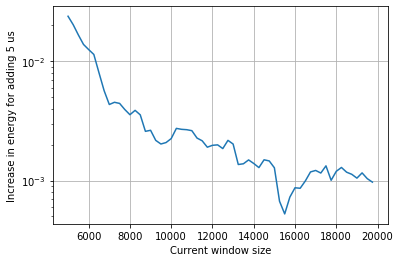

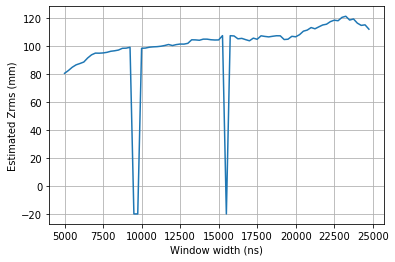

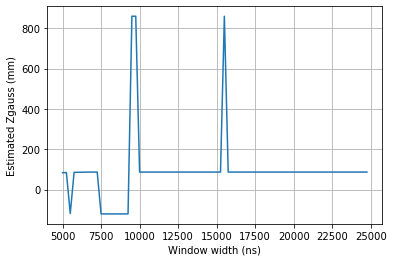

##############
EVENT NUMBER 3245
##############
Window size at which energy is 0.999: 21750
Zrms = 143.72056135900198


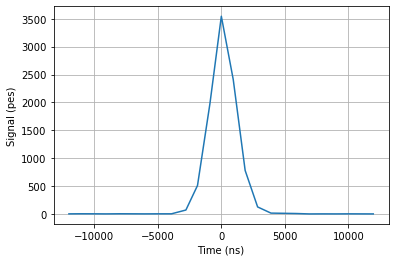

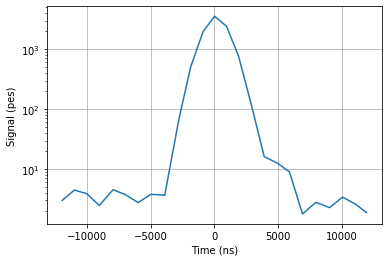

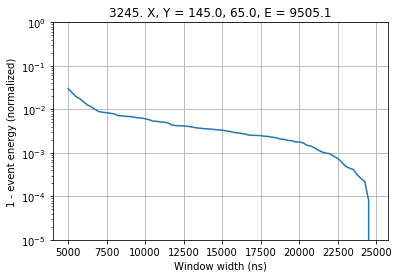

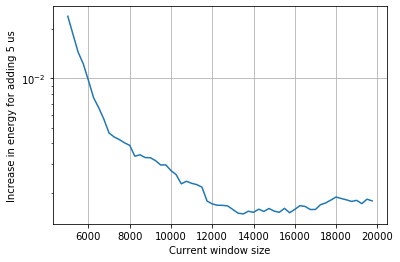

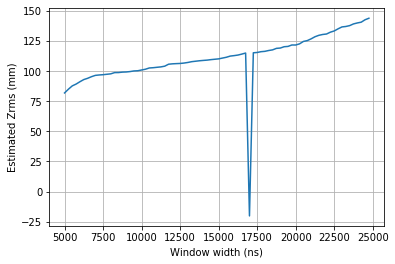

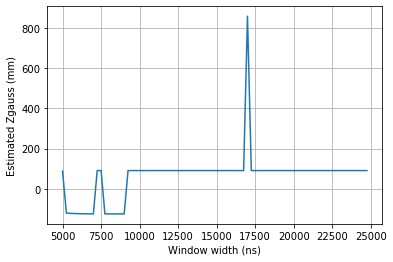

##############
EVENT NUMBER 3265
##############
Window size at which energy is 0.999: 20250
Zrms = 85.82200205082415


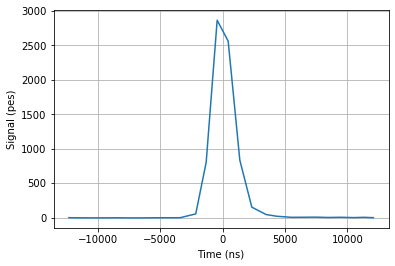

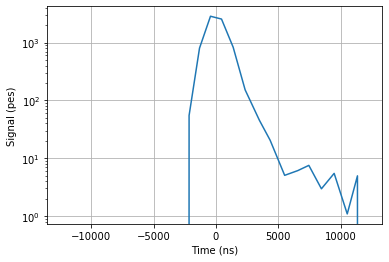

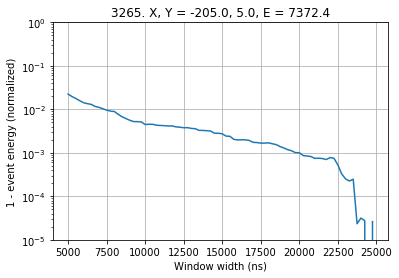

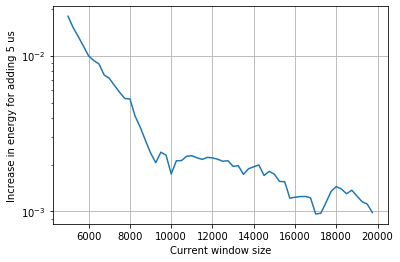

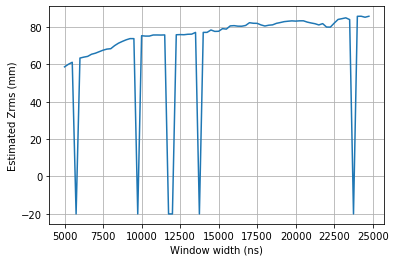

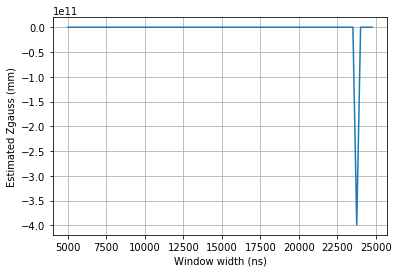

##############
EVENT NUMBER 3292
##############
Window size at which energy is 0.999: 21750
Zrms = 299.9607143997824


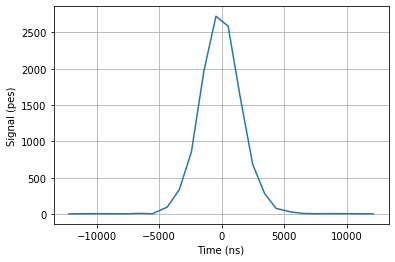

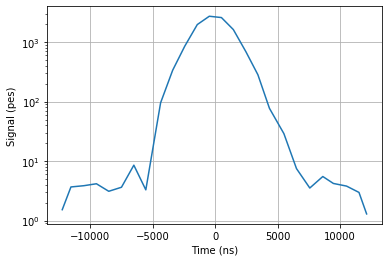

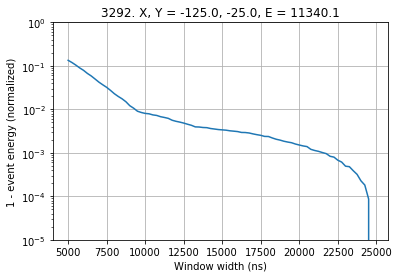

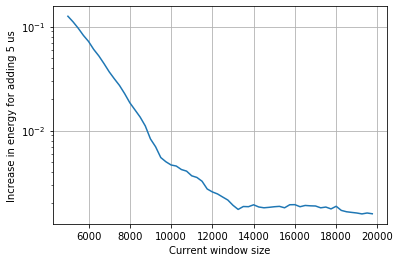

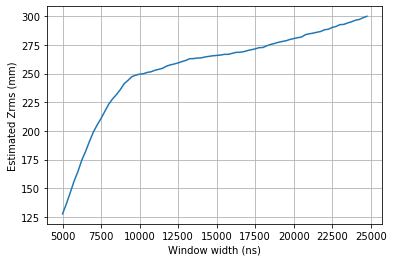

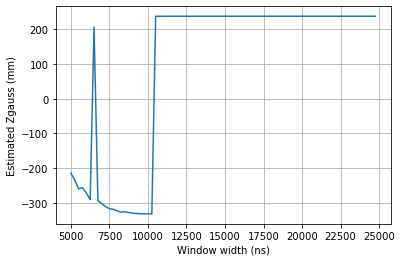

##############
EVENT NUMBER 3344
##############
Window size at which energy is 0.999: 21750
Zrms = 66.01494449950374


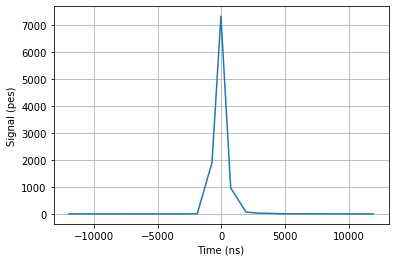

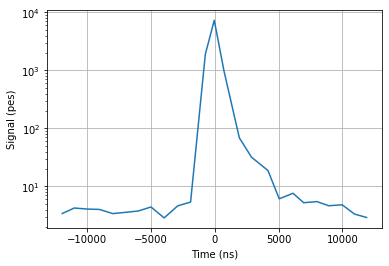

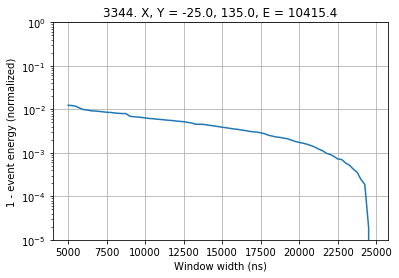

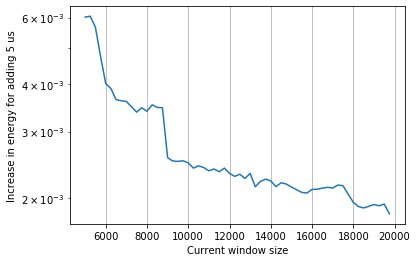

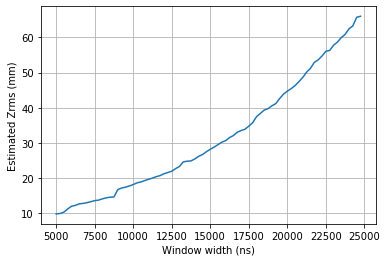

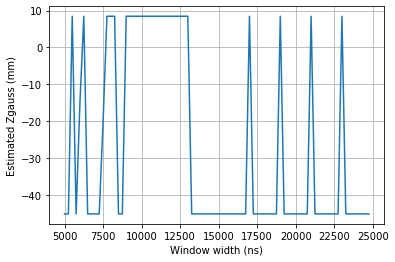

##############
EVENT NUMBER 3346
##############
Window size at which energy is 0.999: 20250
Zrms = 72.54354481138778


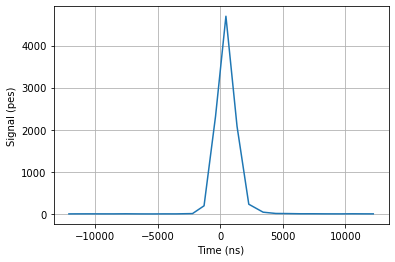

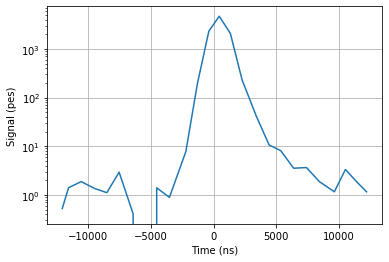

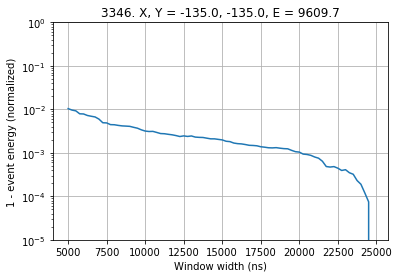

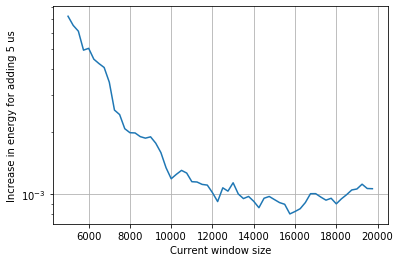

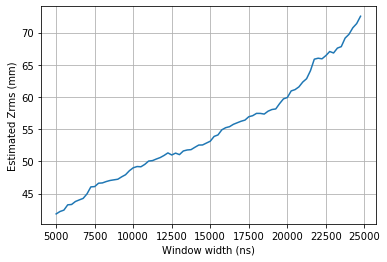

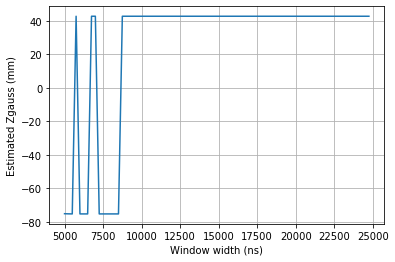

##############
EVENT NUMBER 3368
##############
Window size at which energy is 0.999: 21250
Zrms = 64.83972694164657


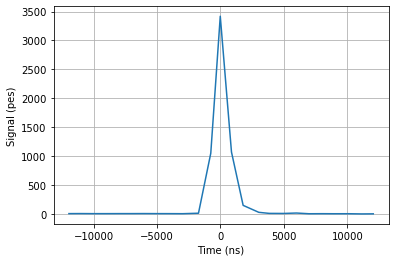

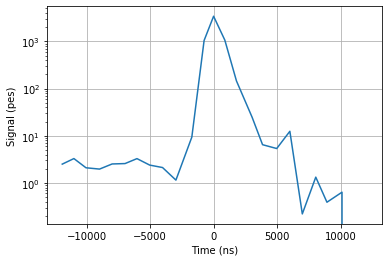

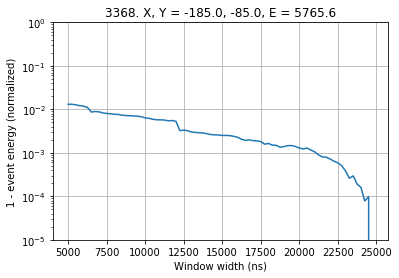

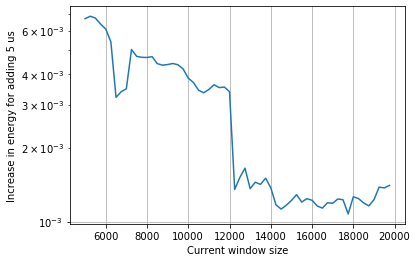

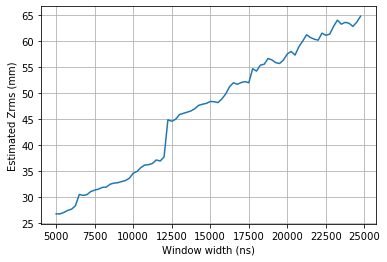

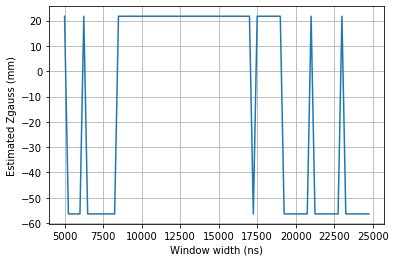

##############
EVENT NUMBER 3380
##############
Window size at which energy is 0.999: 20500
Zrms = 218.83478701576166


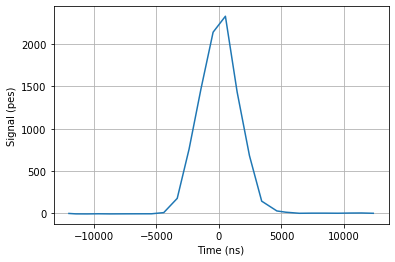

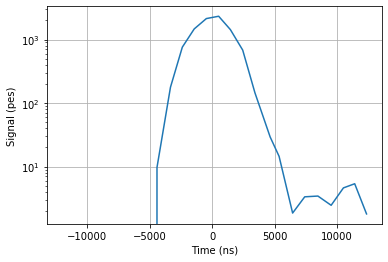

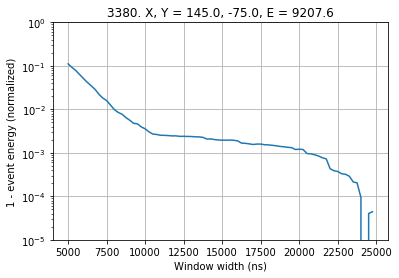

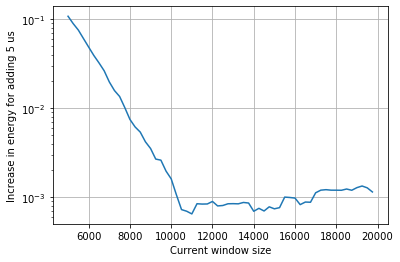

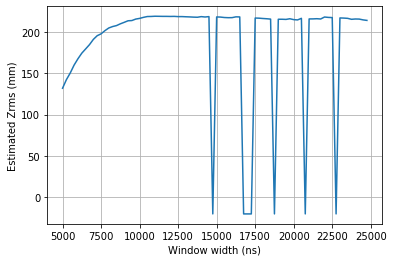

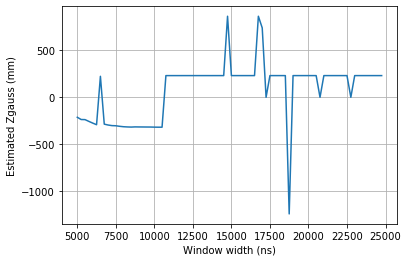

##############
EVENT NUMBER 3422
##############
Window size at which energy is 0.999: 20250
Zrms = 220.24588234223086


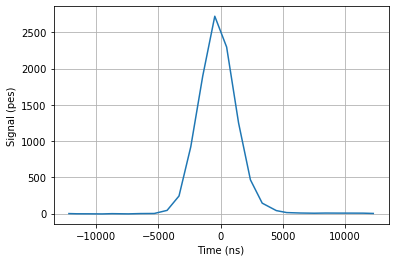

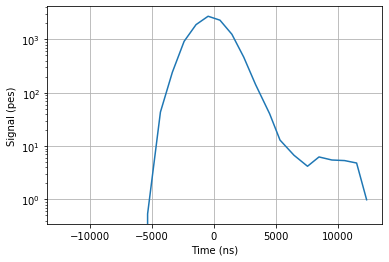

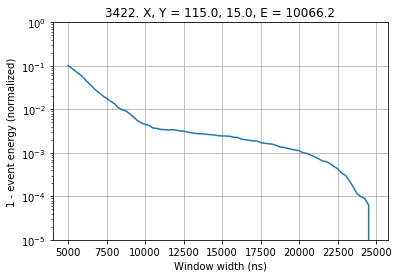

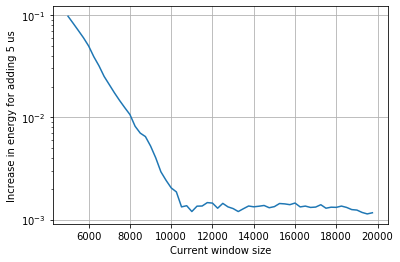

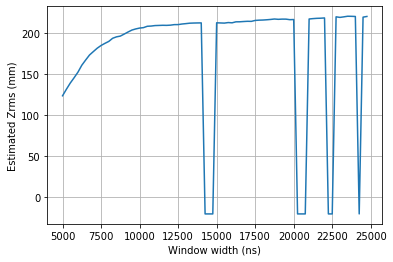

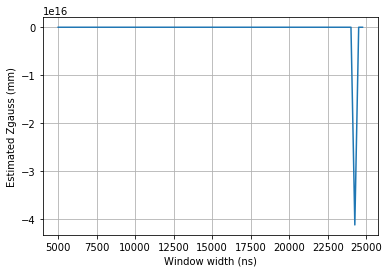

##############
EVENT NUMBER 3468
##############
Window size at which energy is 0.999: 21000
Zrms = 72.16197834426544


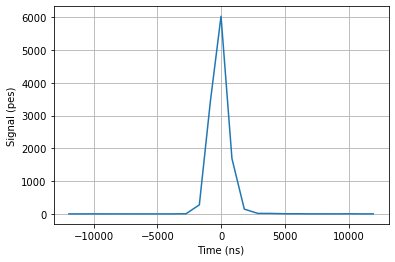

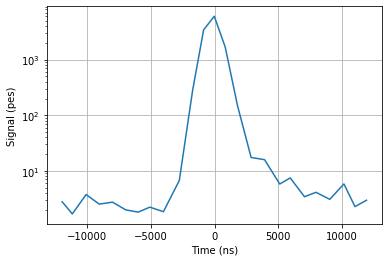

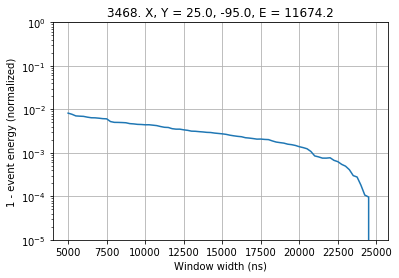

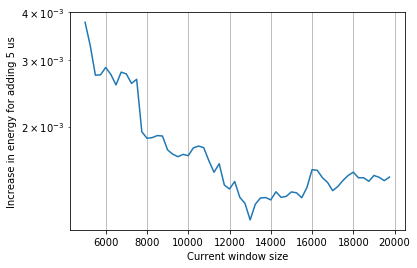

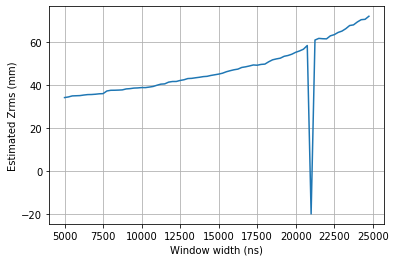

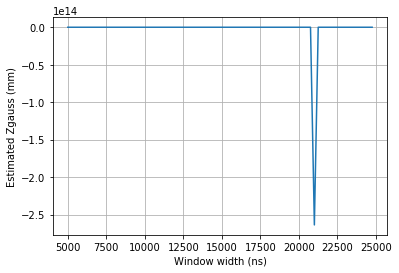

##############
EVENT NUMBER 3509
##############
Window size at which energy is 0.999: 21250
Zrms = 203.4470234682402


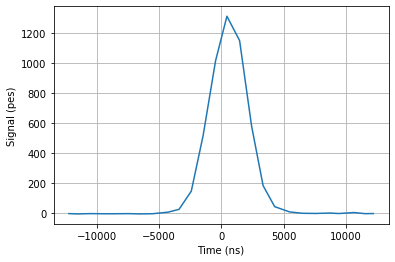

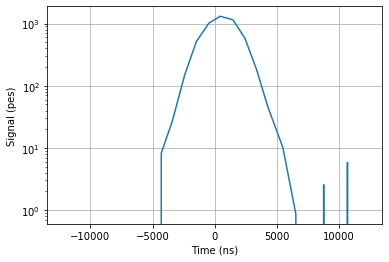

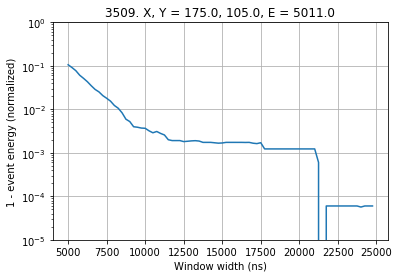

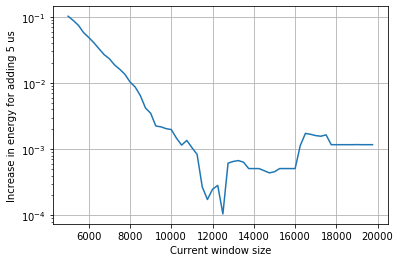

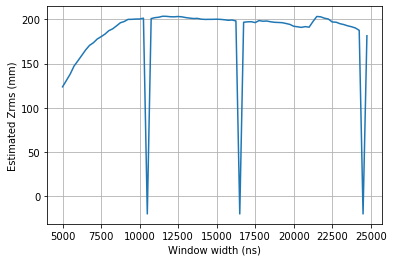

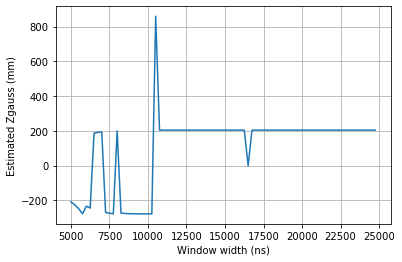

##############
EVENT NUMBER 3634
##############
Window size at which energy is 0.999: 24250
Zrms = 90.33613986732101


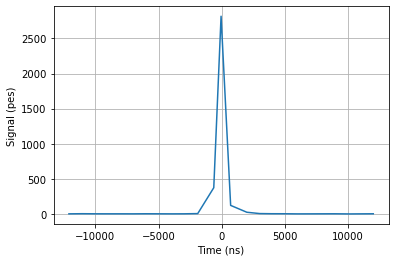

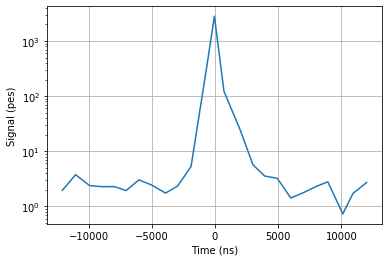

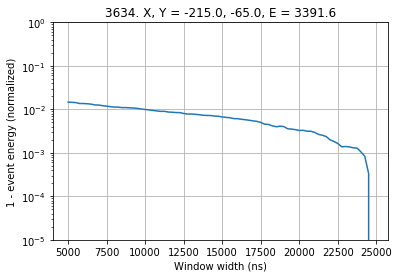

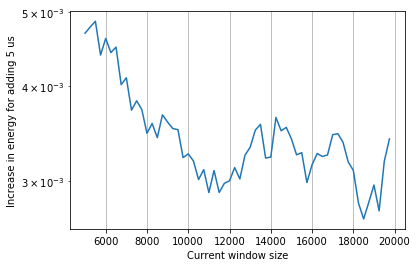

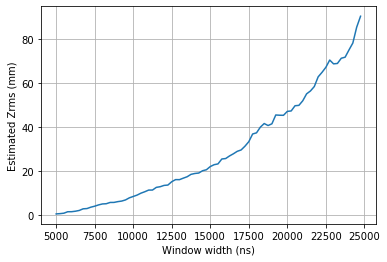

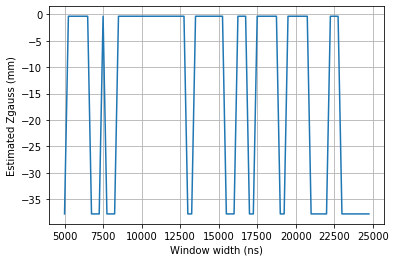

##############
EVENT NUMBER 3733
##############
Window size at which energy is 0.999: 23750
Zrms = 263.33932604760895


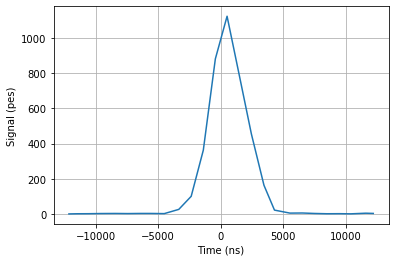

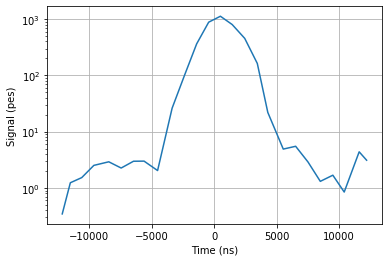

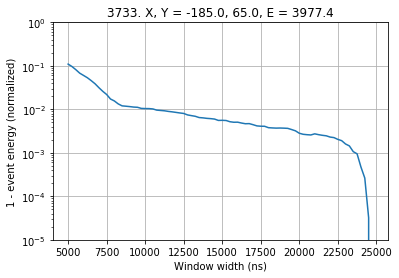

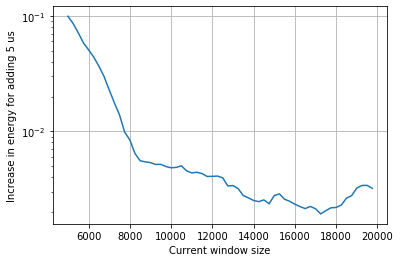

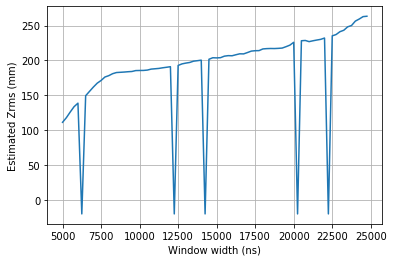

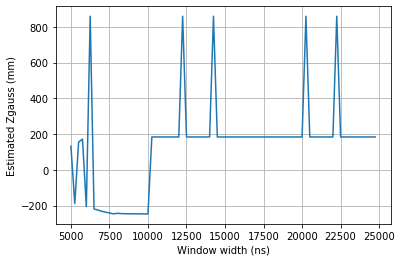

##############
EVENT NUMBER 3787
##############
Window size at which energy is 0.999: 22250
Zrms = 205.92750404579468


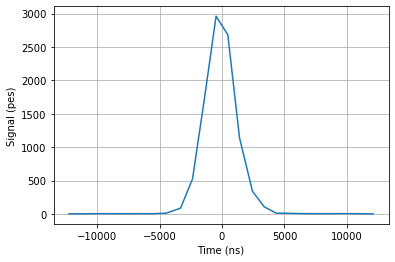

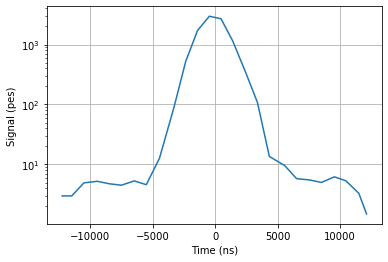

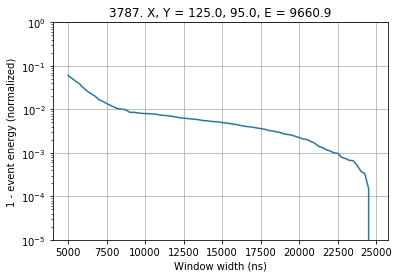

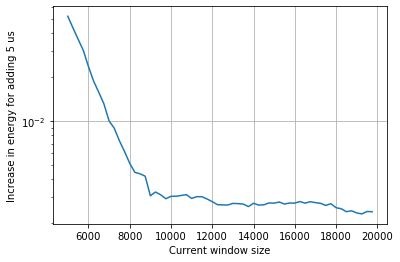

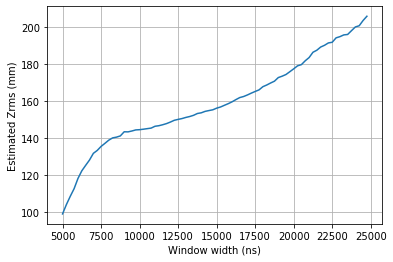

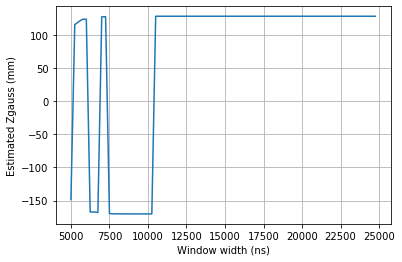

##############
EVENT NUMBER 3791
##############
Window size at which energy is 0.999: 20750
Zrms = 52.4361601442279


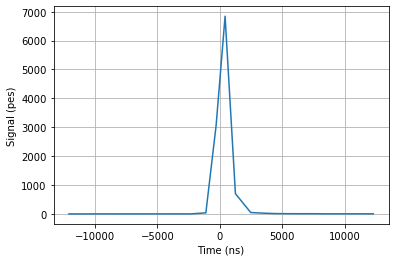

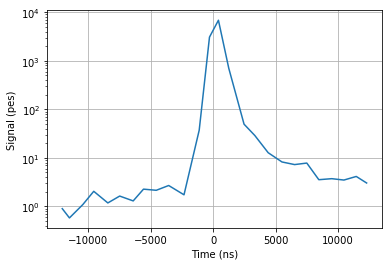

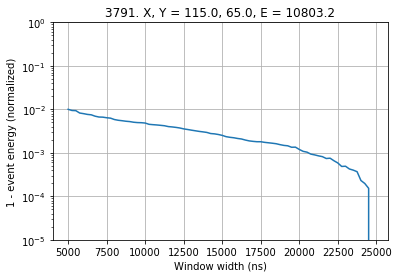

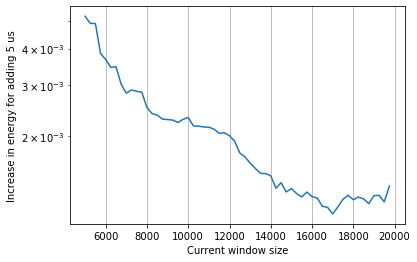

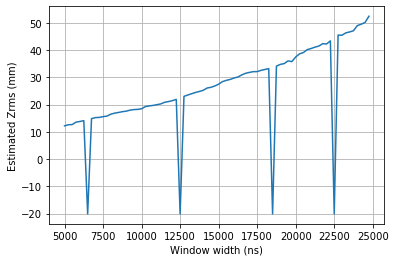

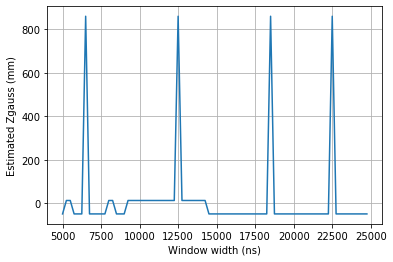

##############
EVENT NUMBER 3856
##############
Window size at which energy is 0.999: 20500
Zrms = 92.95704243284261


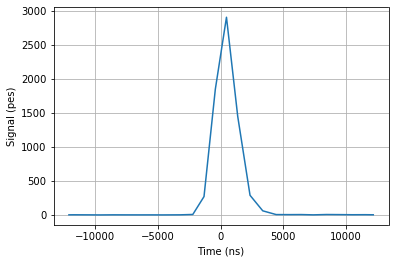

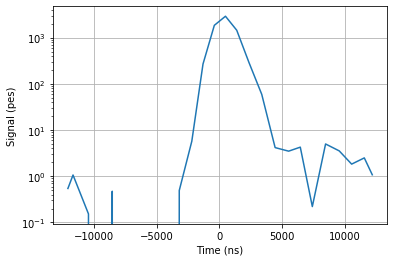

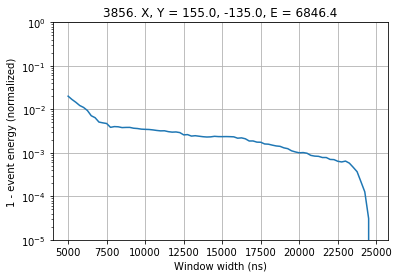

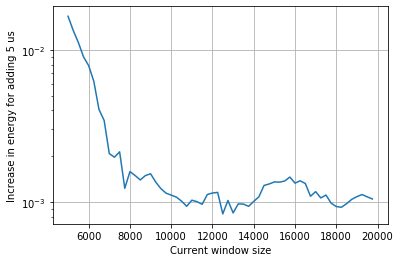

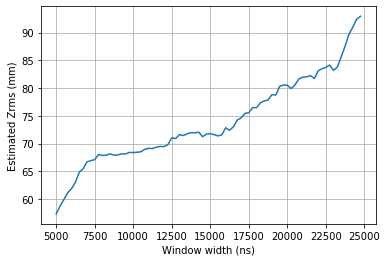

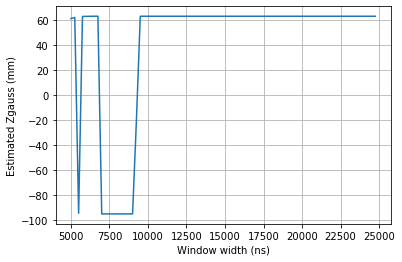

##############
EVENT NUMBER 3935
##############
Window size at which energy is 0.999: 20250
Zrms = 251.9727567413297


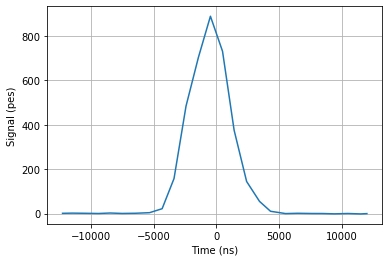

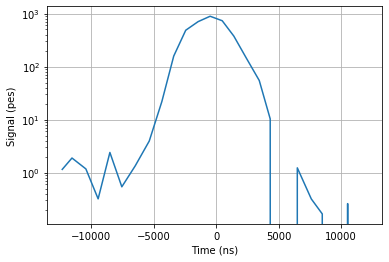

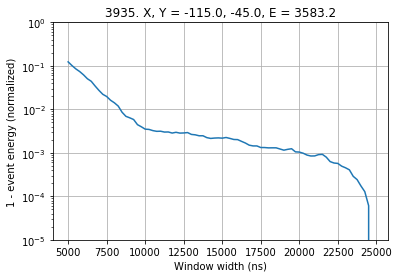

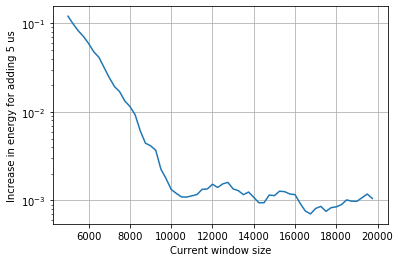

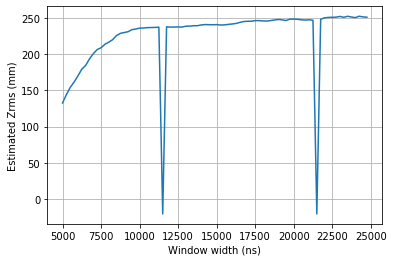

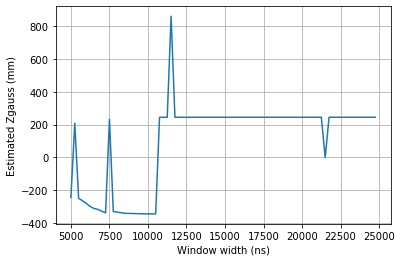

##############
EVENT NUMBER 3936
##############
Window size at which energy is 0.999: 20250
Zrms = 227.01541325487636


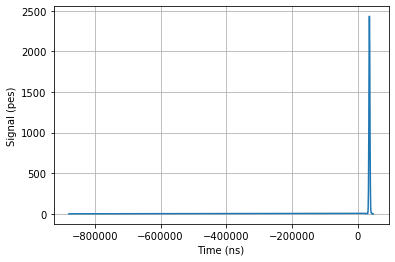

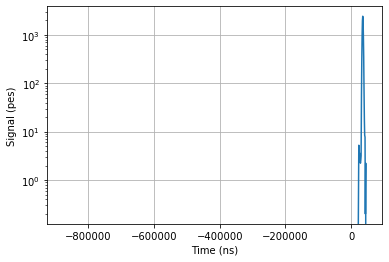

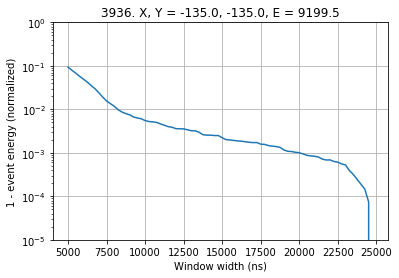

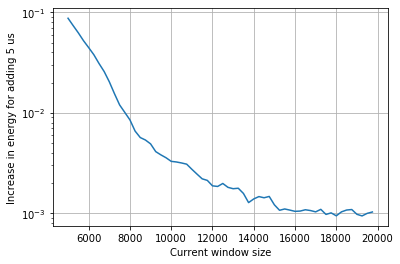

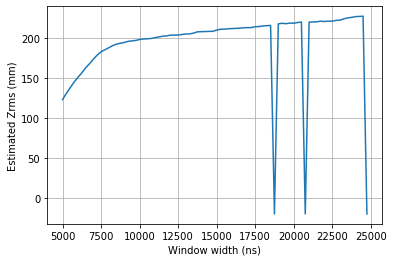

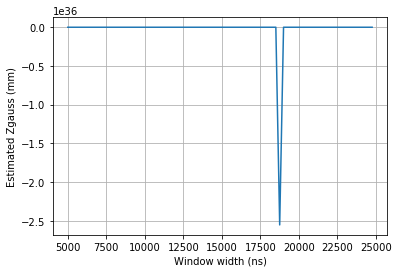

##############
EVENT NUMBER 4029
##############
Window size at which energy is 0.999: 21750
Zrms = 245.30985348394512


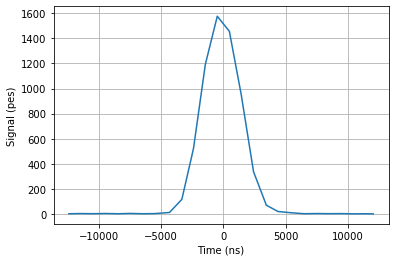

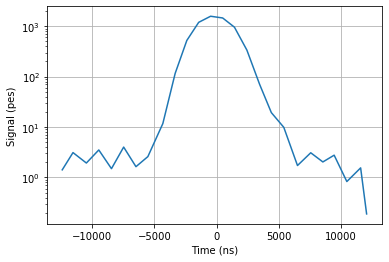

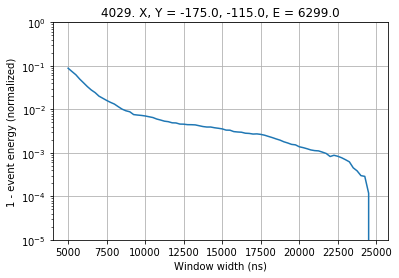

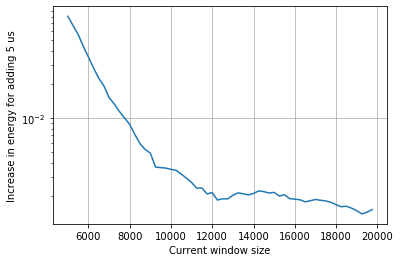

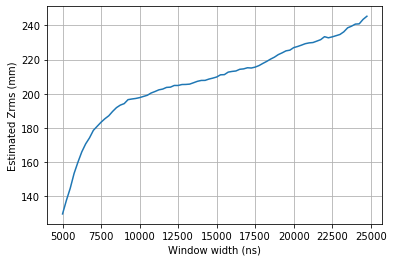

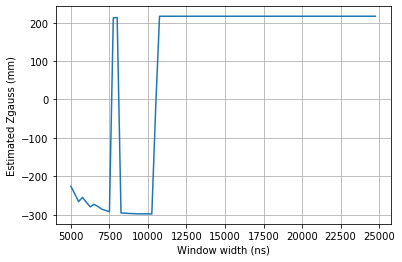

##############
EVENT NUMBER 4078
##############
Window size at which energy is 0.999: 20250
Zrms = 250.3305612555456


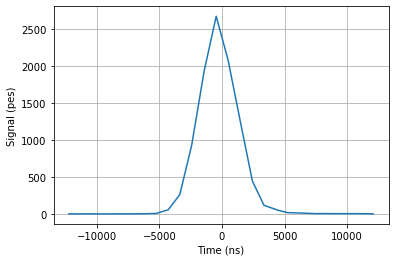

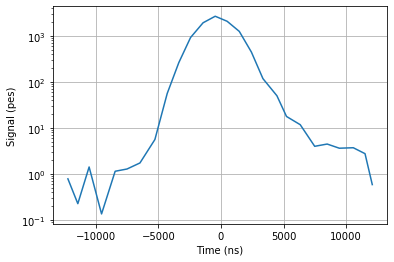

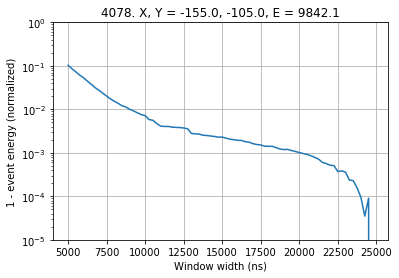

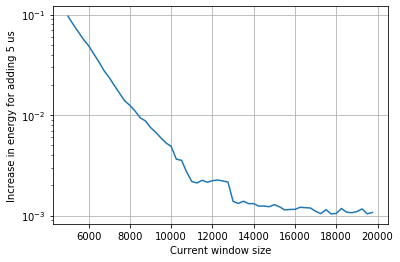

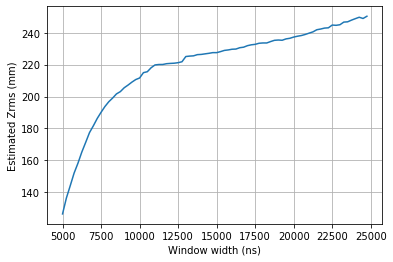

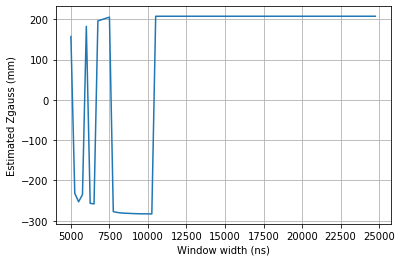

##############
EVENT NUMBER 4146
##############
Window size at which energy is 0.999: 20750
Zrms = 163.58799114461652


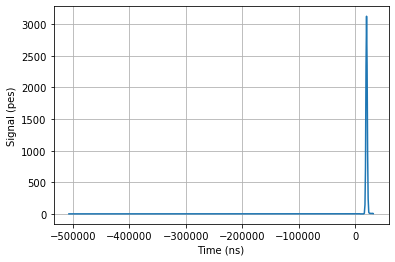

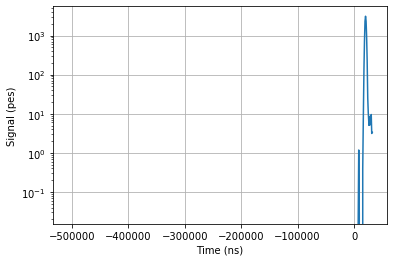

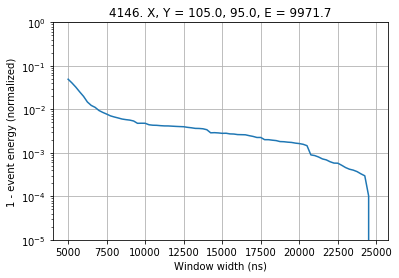

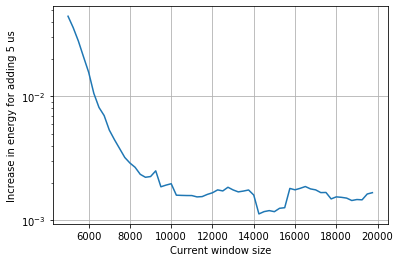

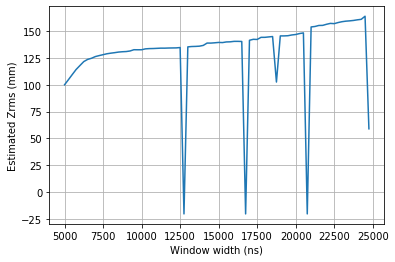

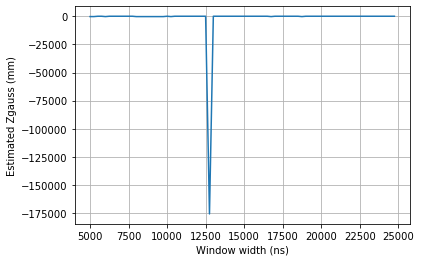

##############
EVENT NUMBER 4226
##############
Window size at which energy is 0.999: 23500
Zrms = 187.88096196127574


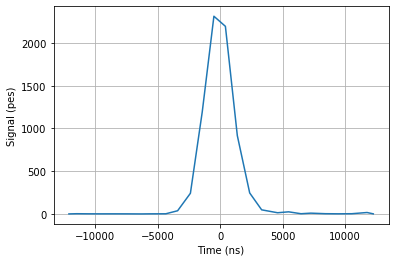

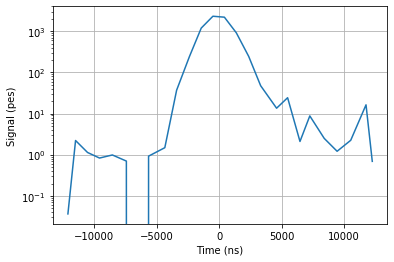

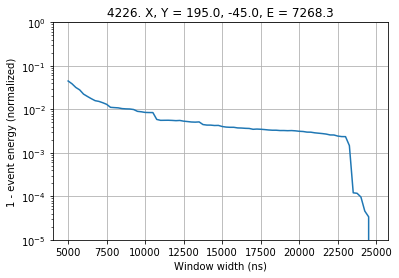

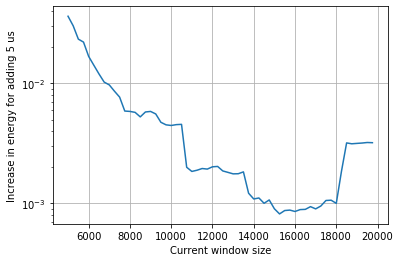

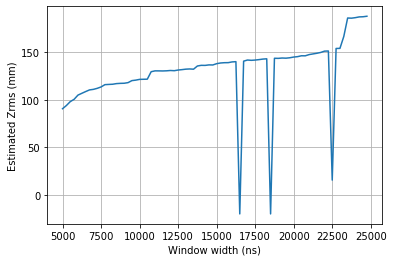

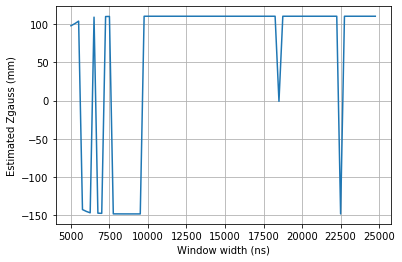

##############
EVENT NUMBER 4292
##############
Window size at which energy is 0.999: 20750
Zrms = 244.52437726957447


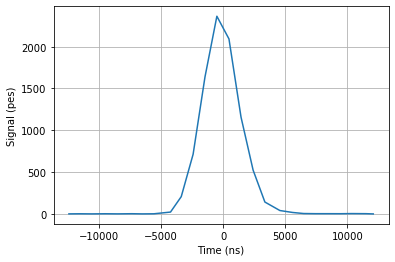

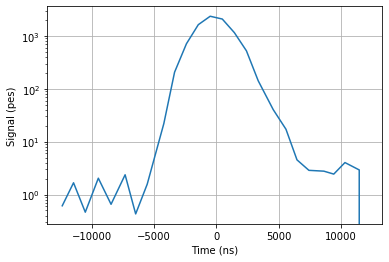

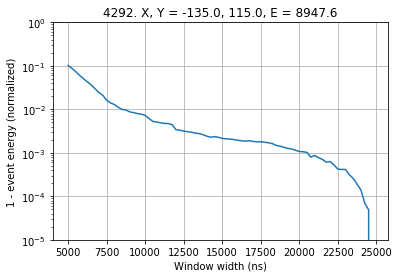

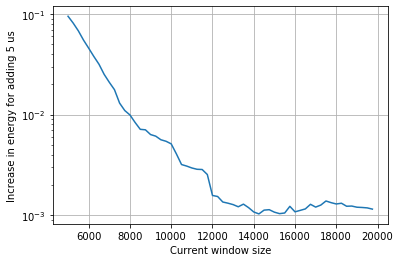

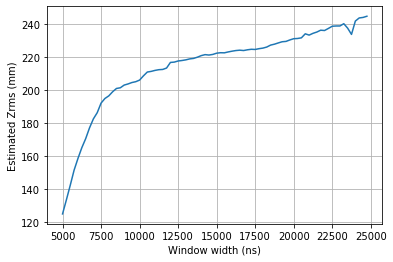

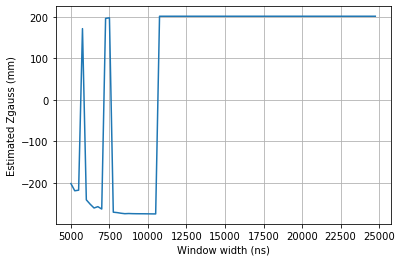

##############
EVENT NUMBER 4363
##############
Window size at which energy is 0.999: 20750
Zrms = 139.2734168838188


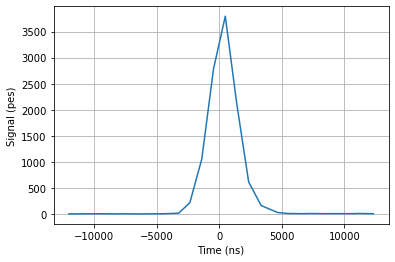

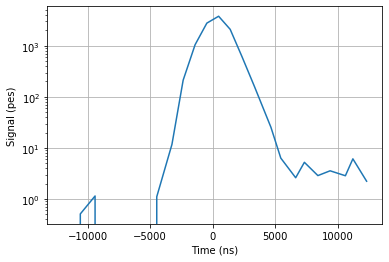

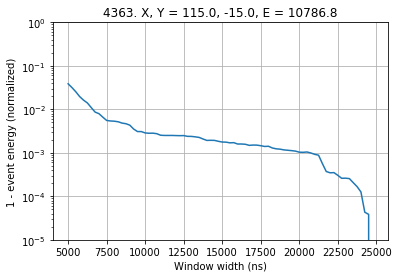

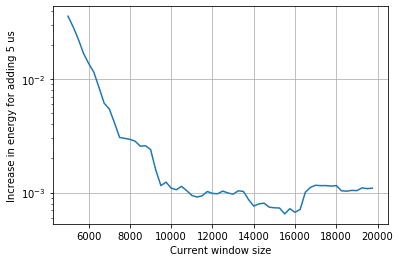

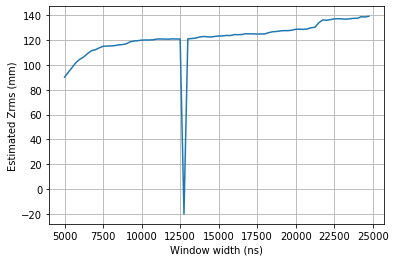

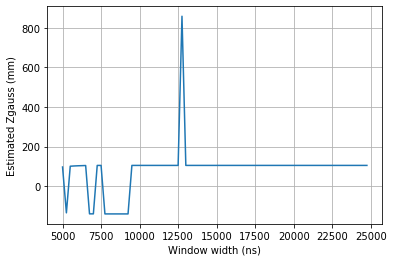

##############
EVENT NUMBER 4376
##############
Window size at which energy is 0.999: 22250
Zrms = 206.58109536263265


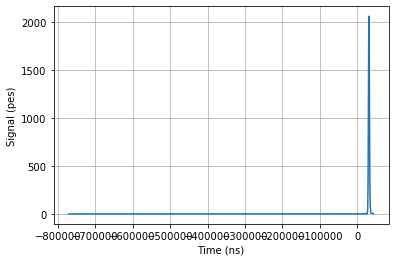

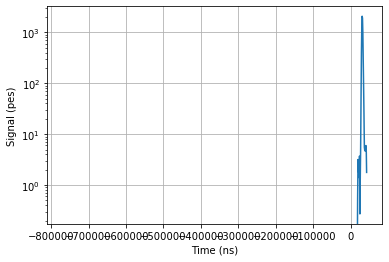

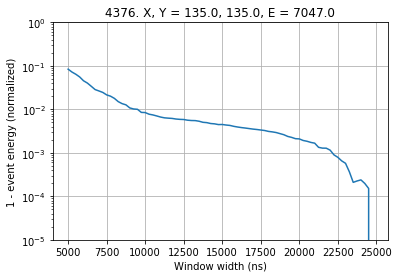

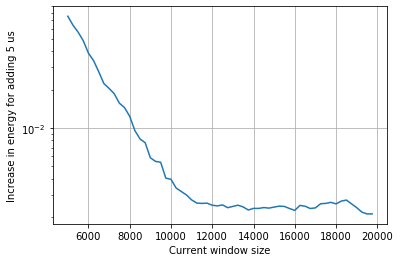

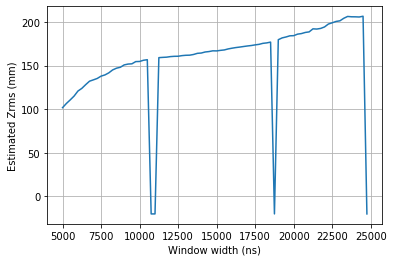

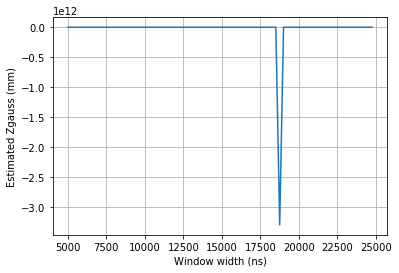

##############
EVENT NUMBER 4407
##############
Window size at which energy is 0.999: 21250
Zrms = 148.10362573880673


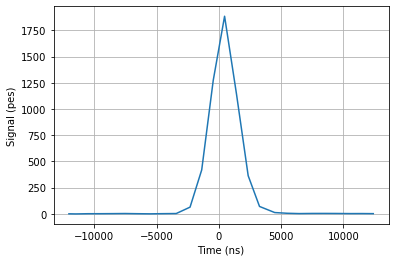

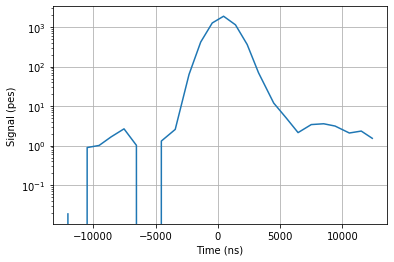

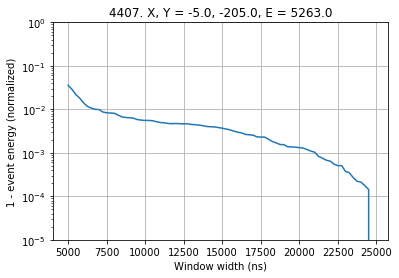

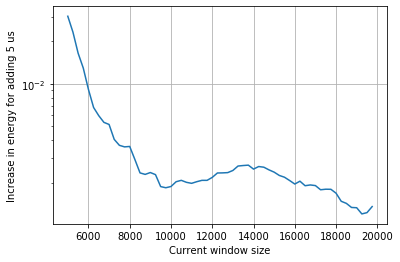

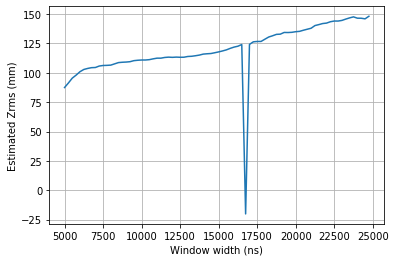

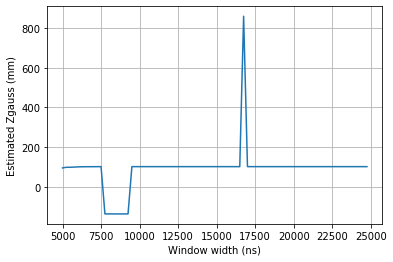

##############
EVENT NUMBER 4424
##############
Window size at which energy is 0.999: 20500
Zrms = 290.25059974983515


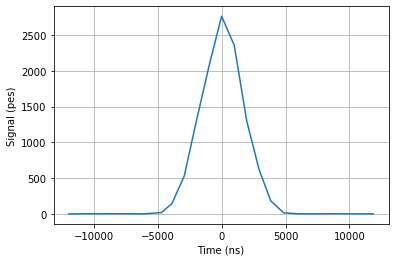

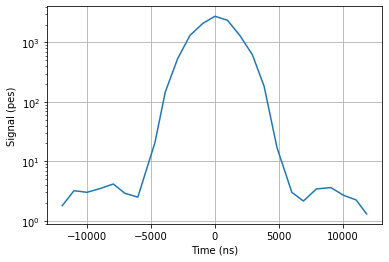

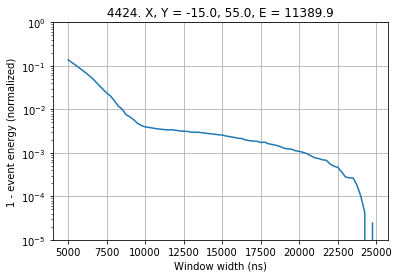

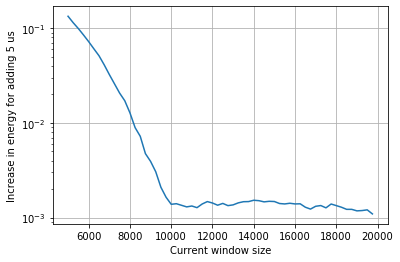

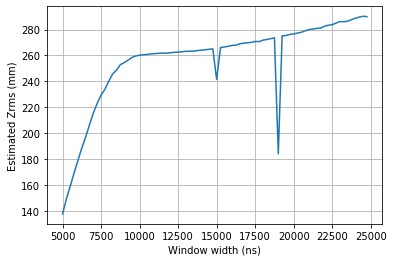

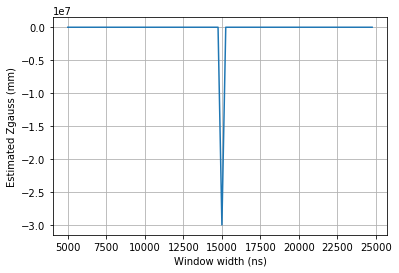

##############
EVENT NUMBER 4489
##############
Window size at which energy is 0.999: 21500
Zrms = 286.77541939806696


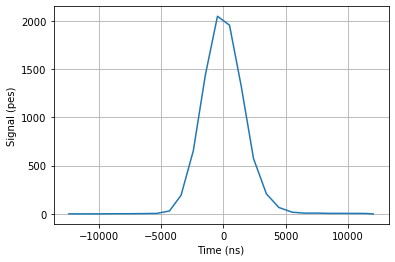

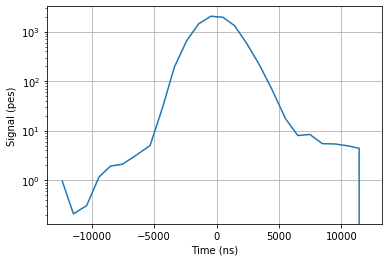

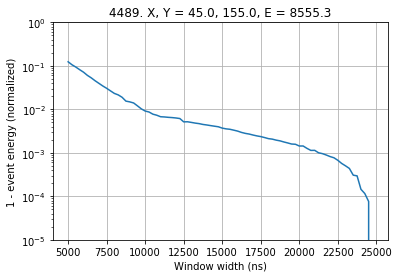

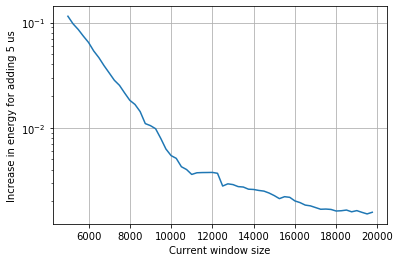

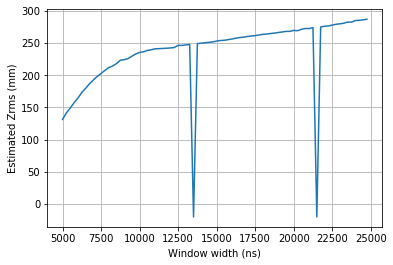

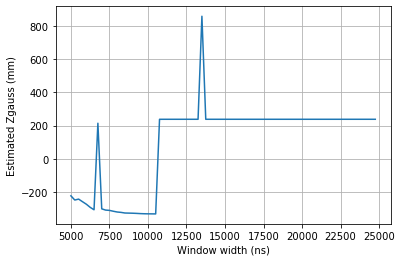

##############
EVENT NUMBER 4512
##############
Window size at which energy is 0.999: 20250
Zrms = 127.64339961681301


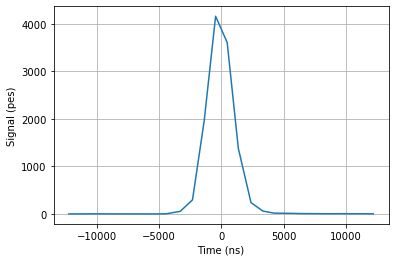

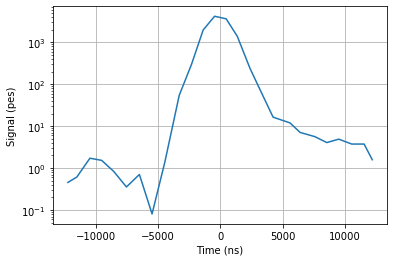

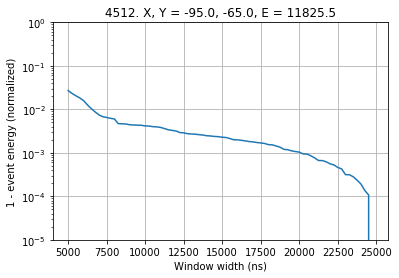

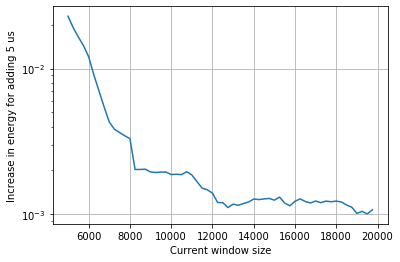

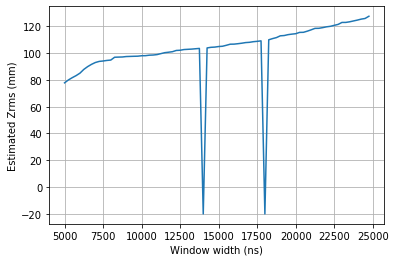

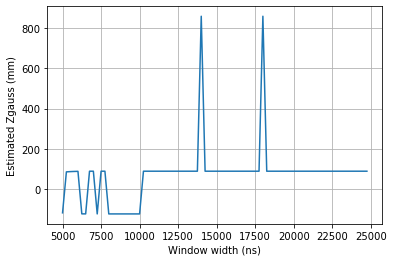

##############
EVENT NUMBER 4593
##############
Window size at which energy is 0.999: 22500
Zrms = 131.72240674080166


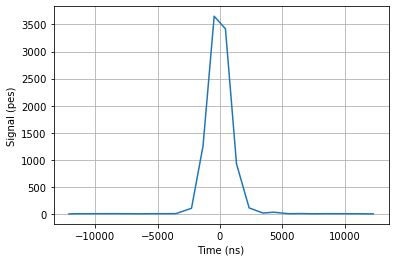

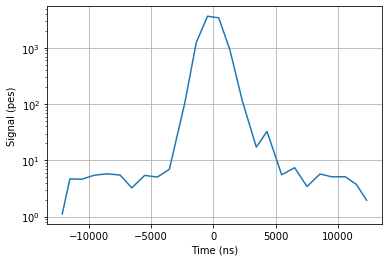

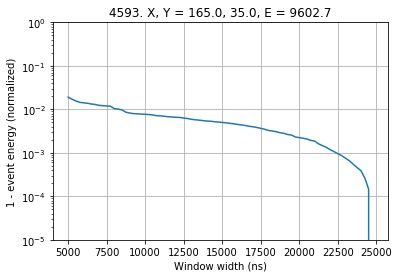

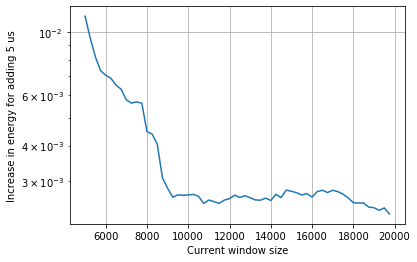

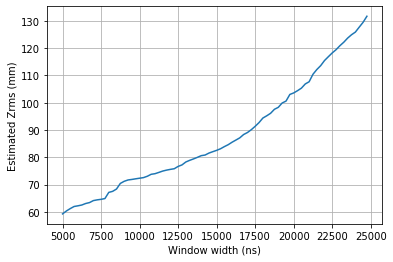

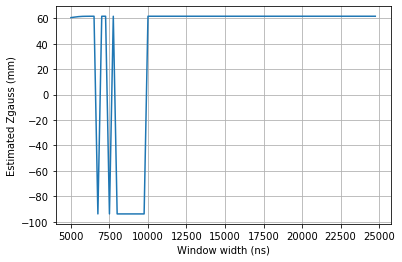

##############
EVENT NUMBER 4674
##############
Window size at which energy is 0.999: 20750
Zrms = 97.0483245036236


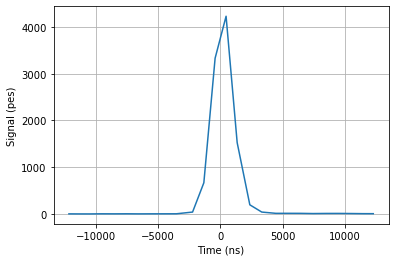

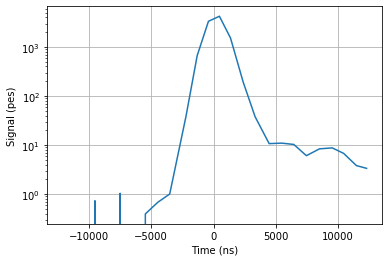

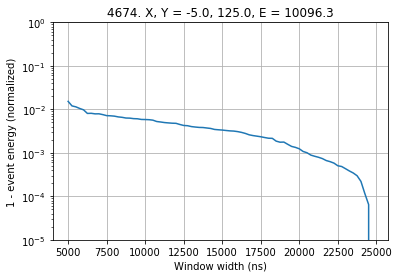

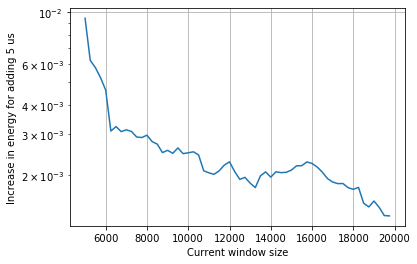

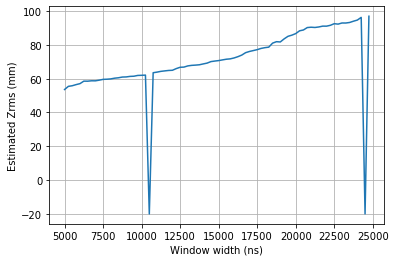

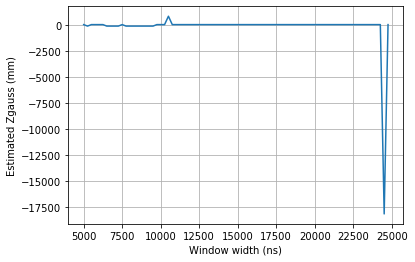

##############
EVENT NUMBER 4721
##############
Window size at which energy is 0.999: 20500
Zrms = 58.05418309355255


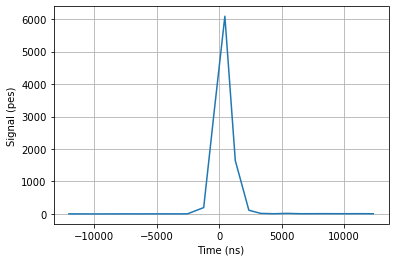

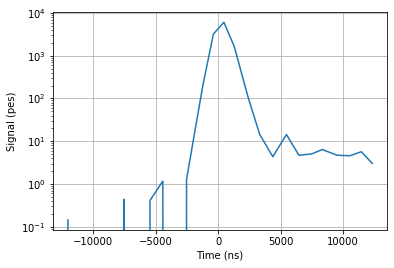

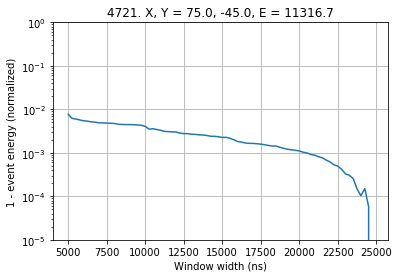

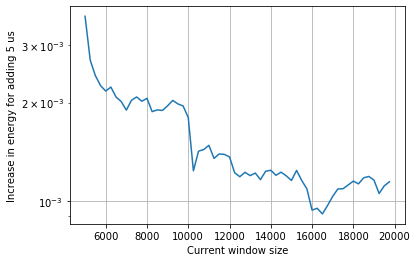

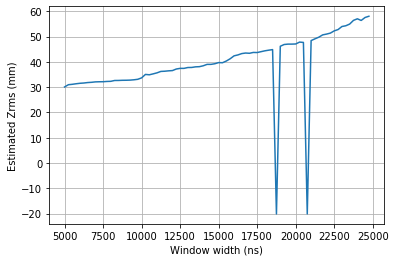

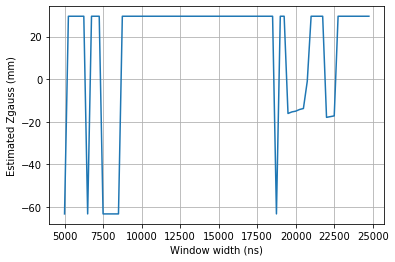

##############
EVENT NUMBER 4779
##############
Window size at which energy is 0.999: 22250
Zrms = 262.59623051701914


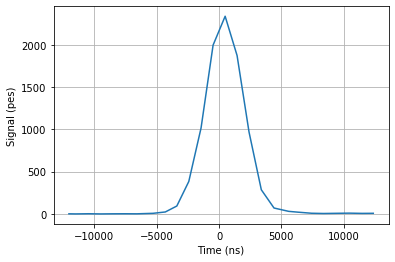

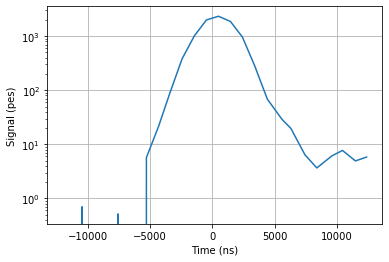

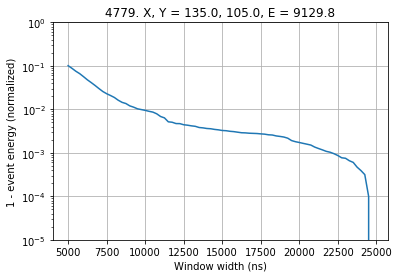

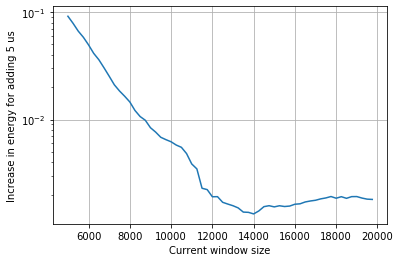

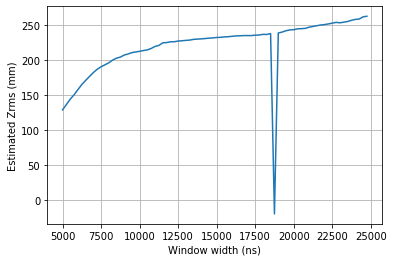

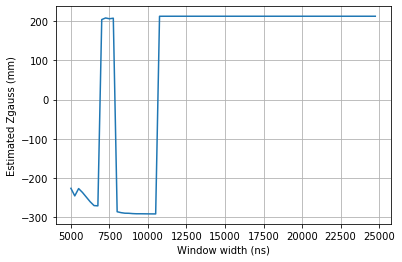

##############
EVENT NUMBER 4807
##############
Window size at which energy is 0.999: 21250
Zrms = 153.38722504524156


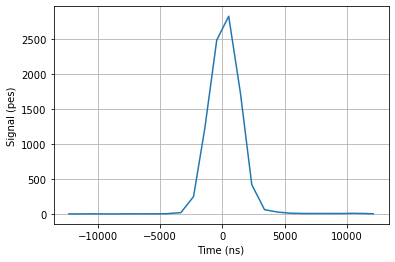

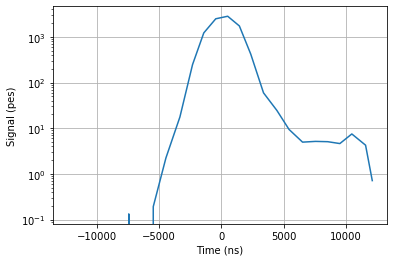

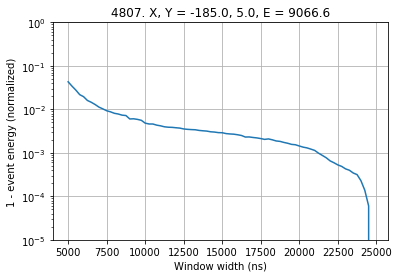

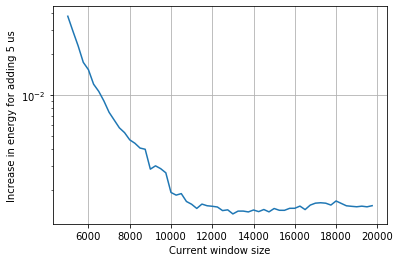

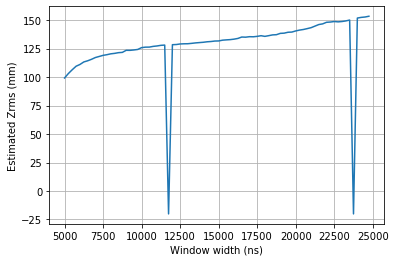

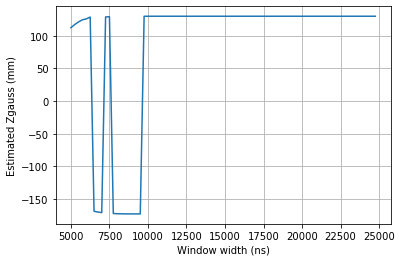

##############
EVENT NUMBER 4918
##############
Window size at which energy is 0.999: 20500
Zrms = 146.4929513438293


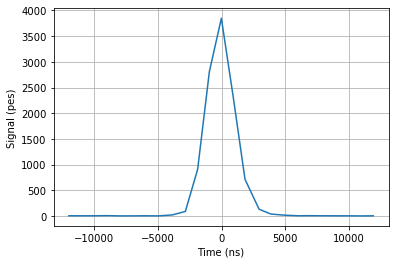

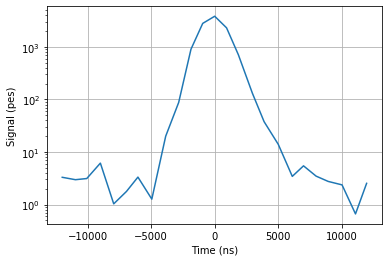

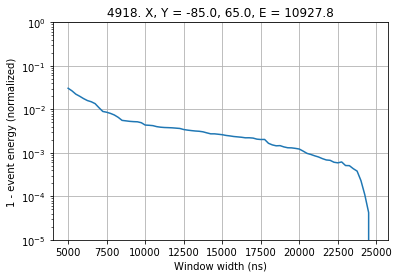

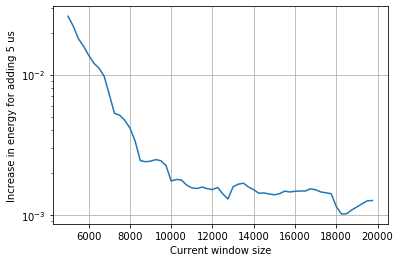

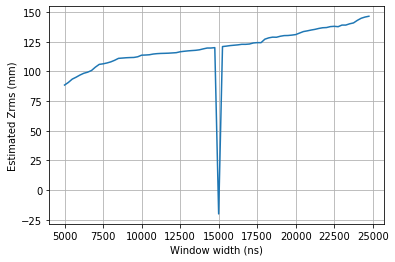

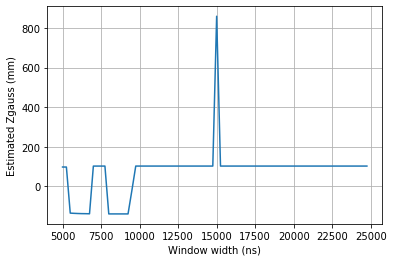

##############
EVENT NUMBER 4925
##############
Window size at which energy is 0.999: 20750
Zrms = 265.57347670314294


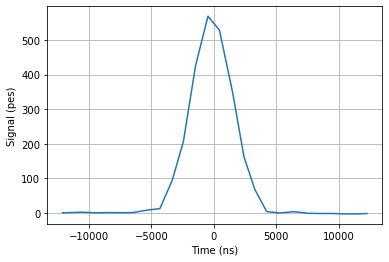

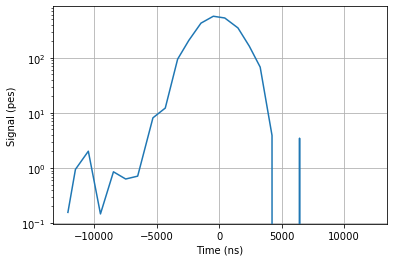

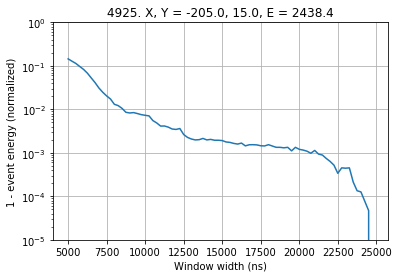

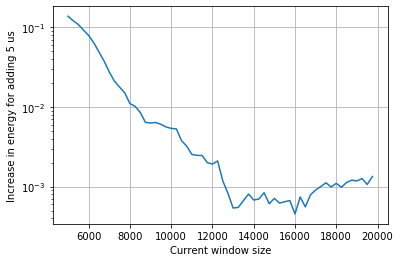

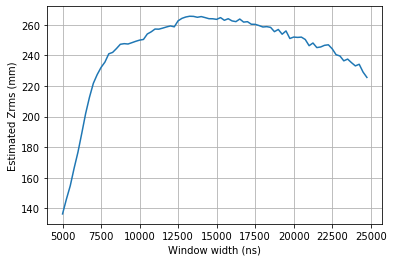

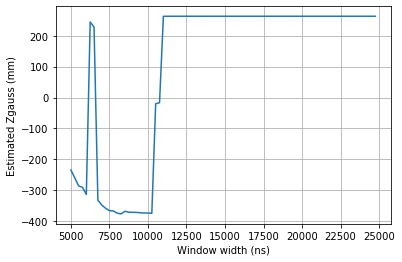

##############
EVENT NUMBER 4936
##############
Window size at which energy is 0.999: 23250
Zrms = 168.95914950760618


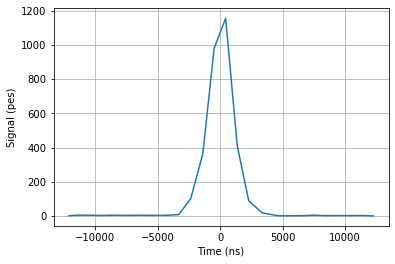

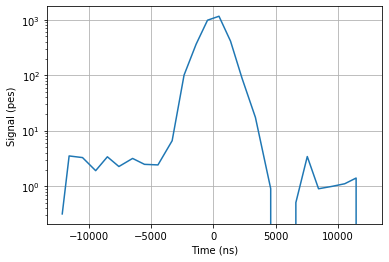

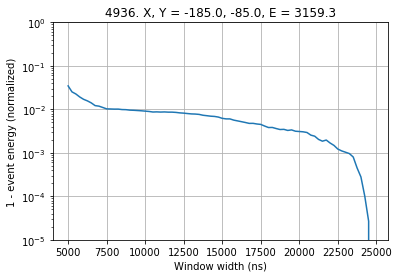

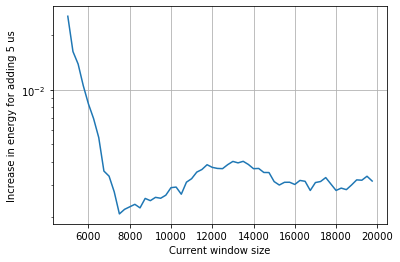

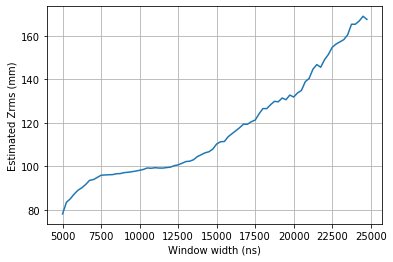

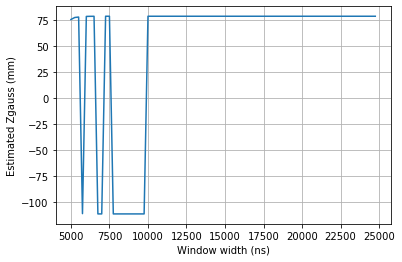

##############
EVENT NUMBER 4964
##############
Window size at which energy is 0.999: 20500
Zrms = 35.20334664978621


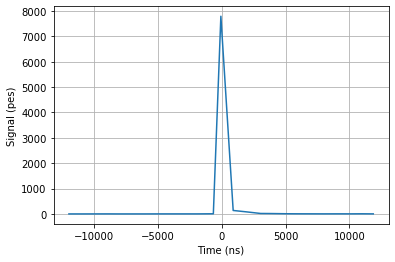

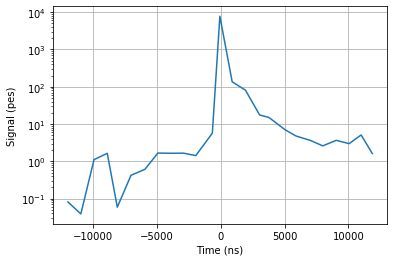

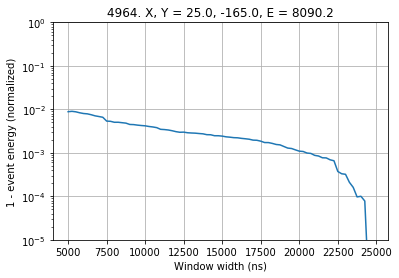

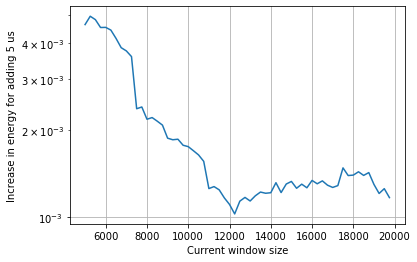

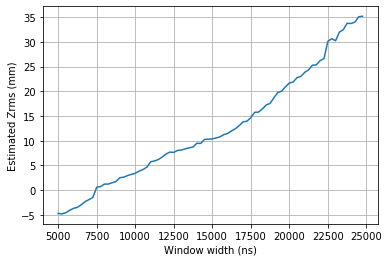

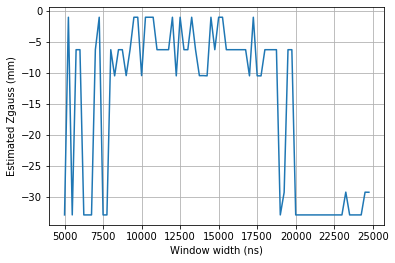

##############
EVENT NUMBER 5068
##############
Window size at which energy is 0.999: 21250
Zrms = 152.87179579262715


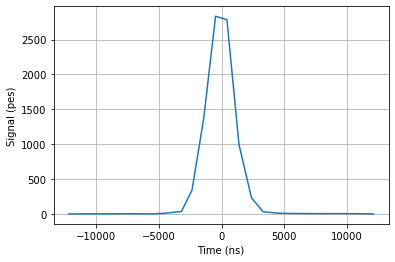

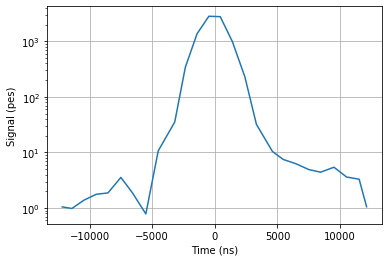

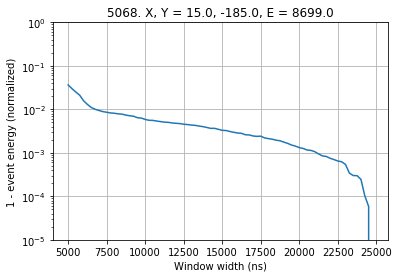

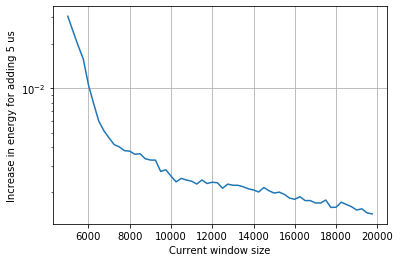

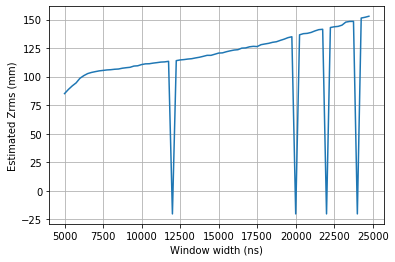

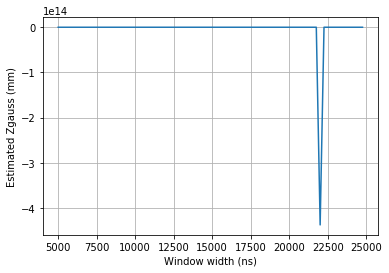

##############
EVENT NUMBER 5104
##############
Window size at which energy is 0.999: 21750
Zrms = 43.34497510565663


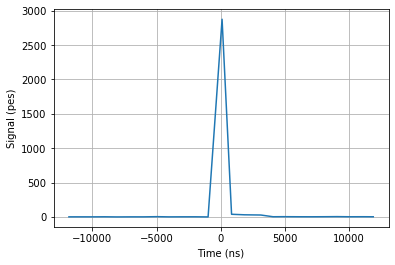

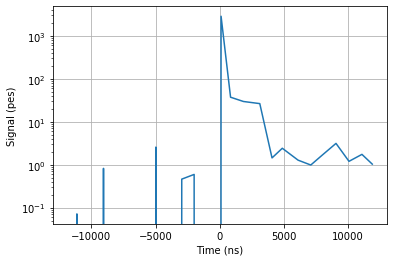

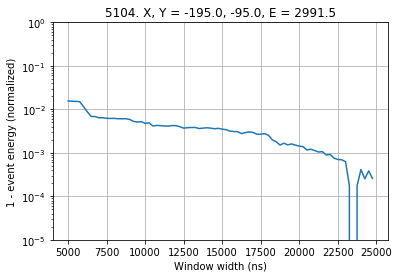

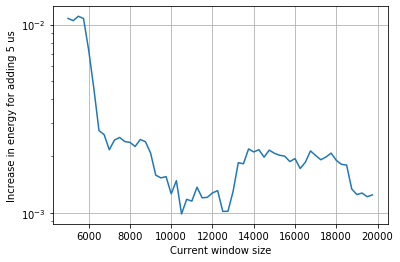

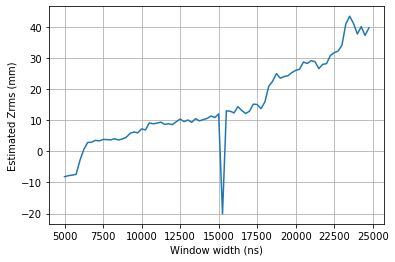

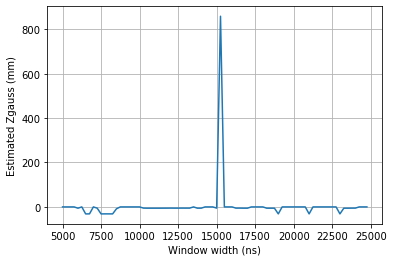

##############
EVENT NUMBER 5112
##############
Window size at which energy is 0.999: 21000
Zrms = 176.21312591881718


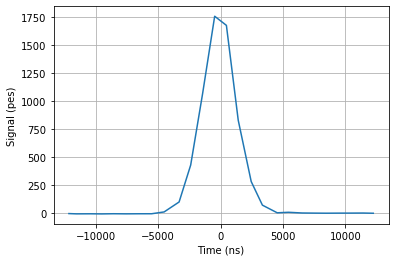

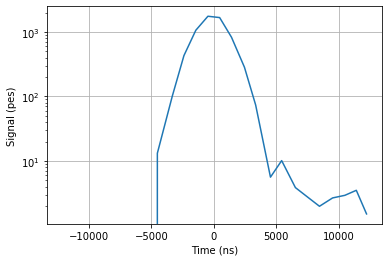

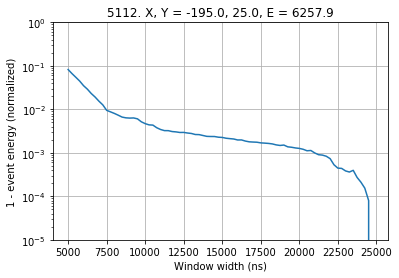

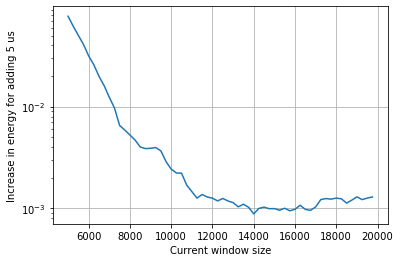

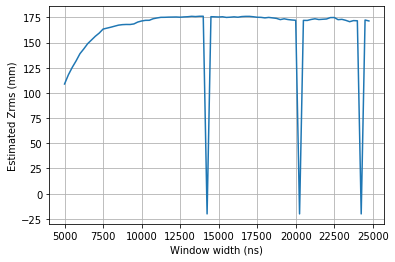

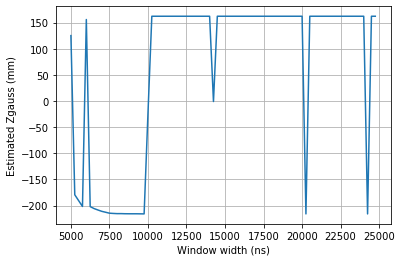

##############
EVENT NUMBER 5136
##############
Window size at which energy is 0.999: 20250
Zrms = 172.31504596337538


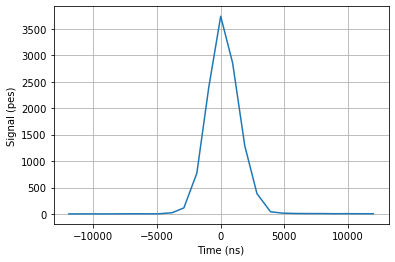

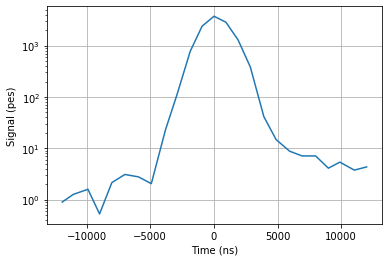

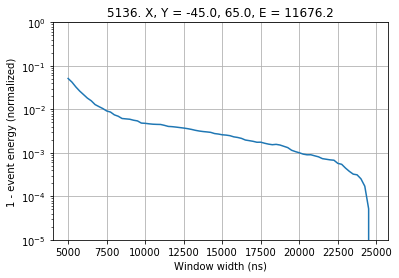

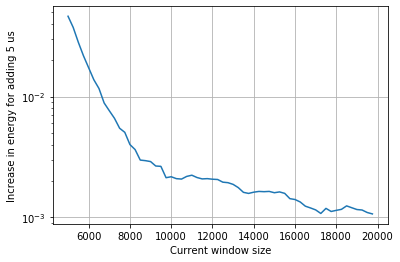

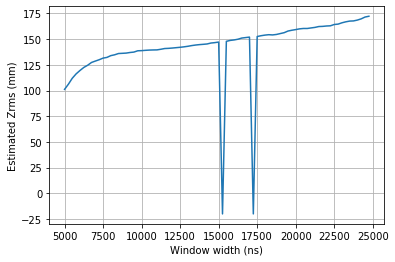

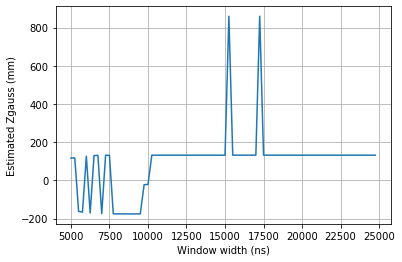

##############
EVENT NUMBER 5220
##############
Window size at which energy is 0.999: 21500
Zrms = 234.9692384755163


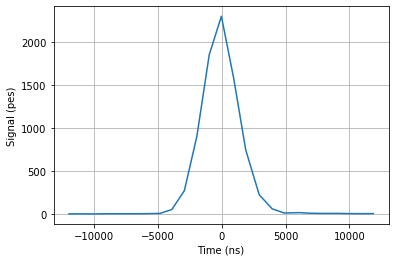

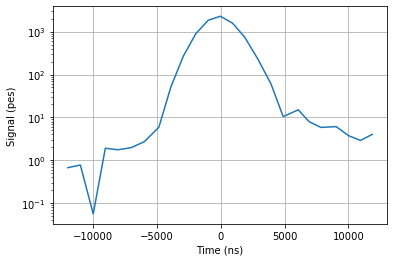

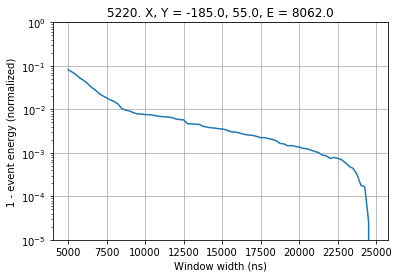

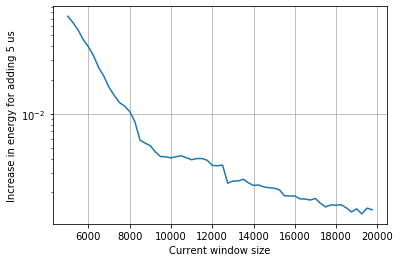

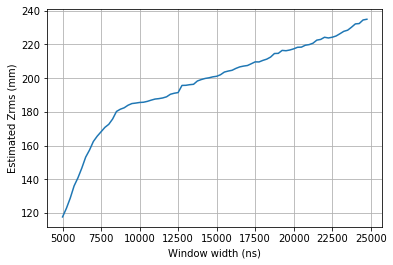

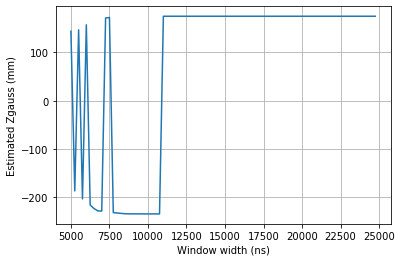

##############
EVENT NUMBER 5310
##############
Window size at which energy is 0.999: 24000
Zrms = 123.87538095510871


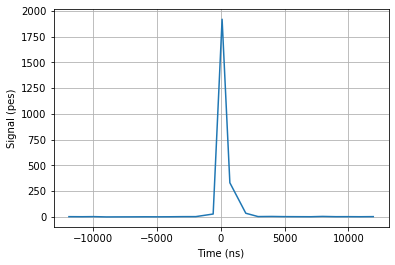

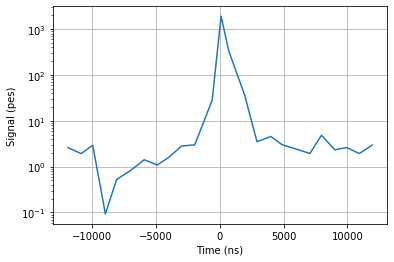

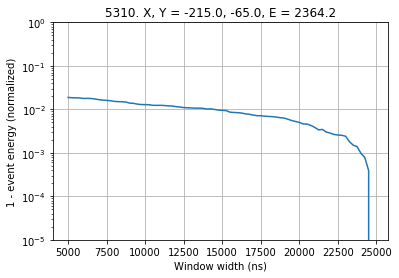

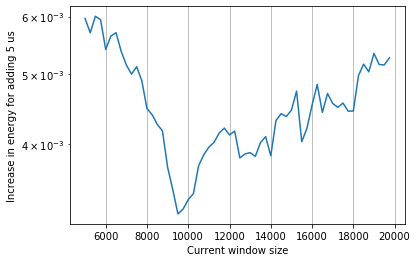

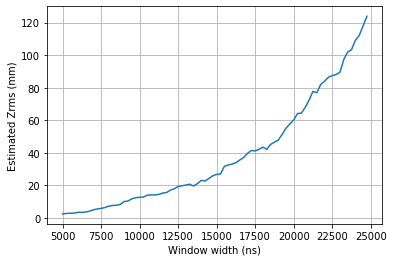

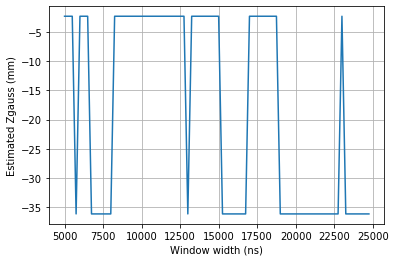

##############
EVENT NUMBER 5342
##############
Window size at which energy is 0.999: 21250
Zrms = 164.06699284973763


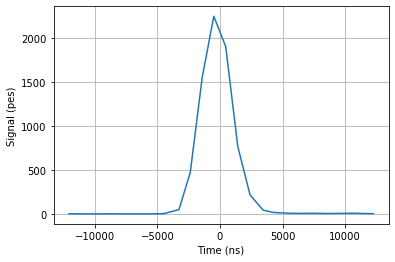

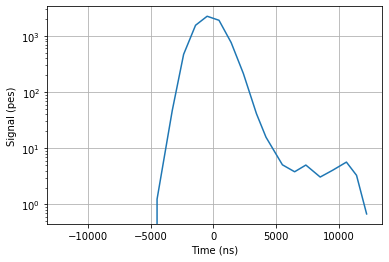

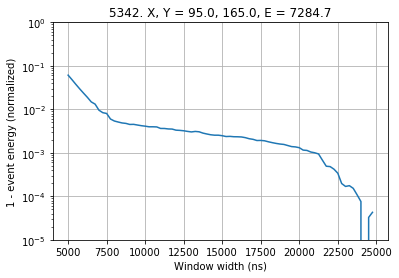

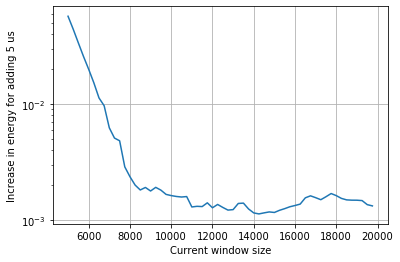

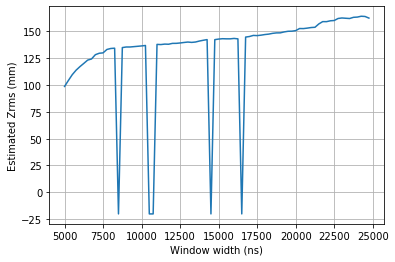

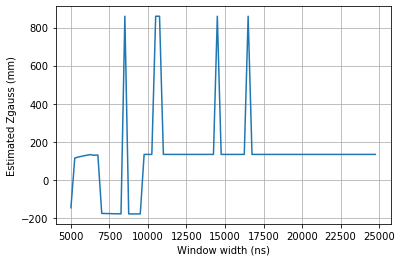

##############
EVENT NUMBER 5346
##############
Window size at which energy is 0.999: 20750
Zrms = 188.7954336340129


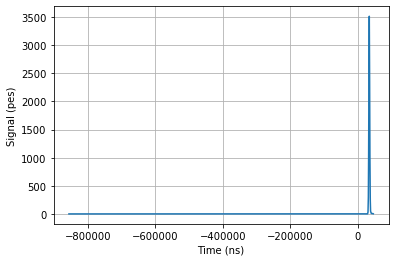

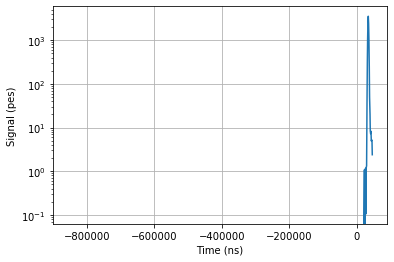

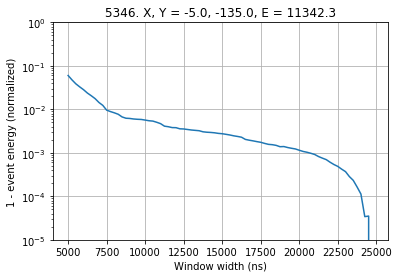

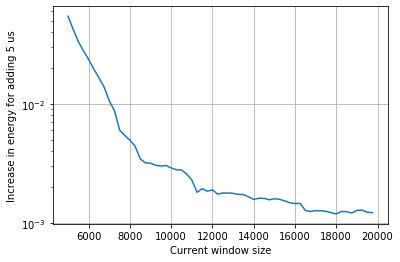

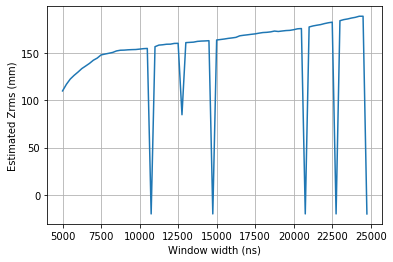

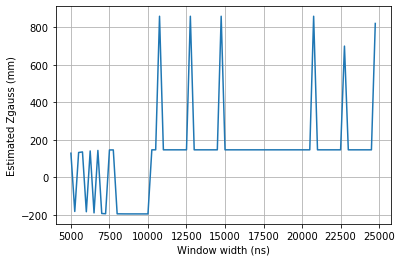

##############
EVENT NUMBER 5395
##############
Window size at which energy is 0.999: 22000
Zrms = 254.76714299719117


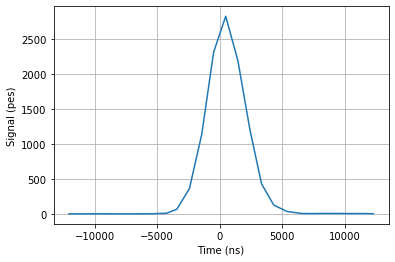

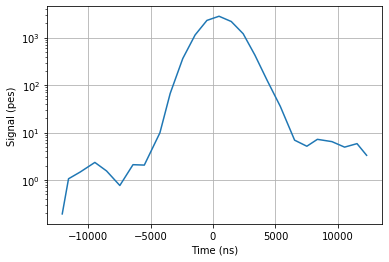

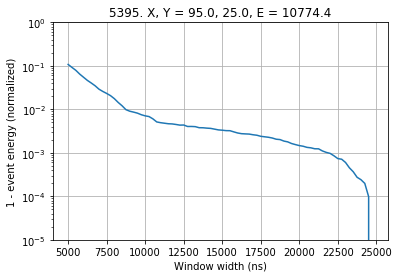

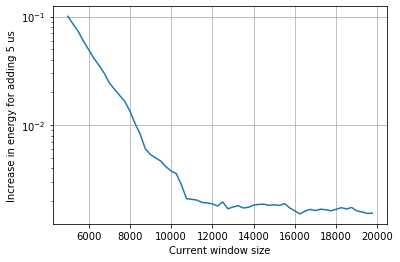

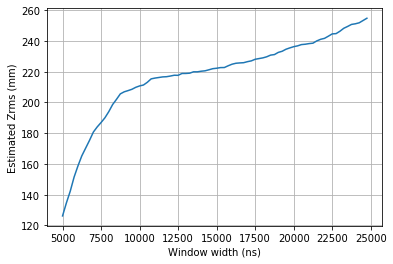

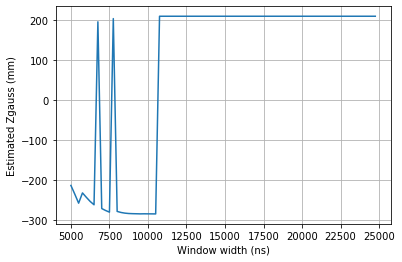

##############
EVENT NUMBER 5487
##############
Window size at which energy is 0.999: 20500
Zrms = 215.35347898010355


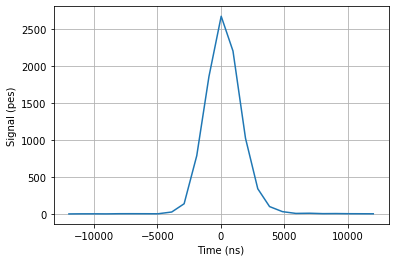

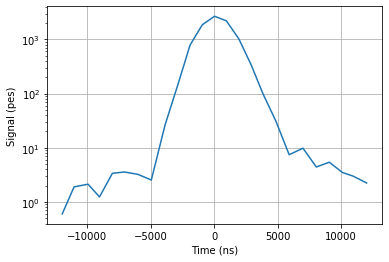

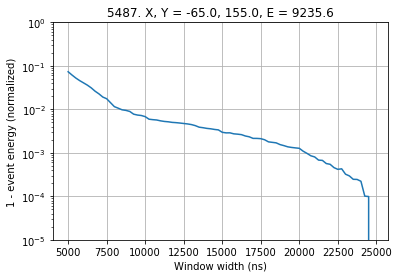

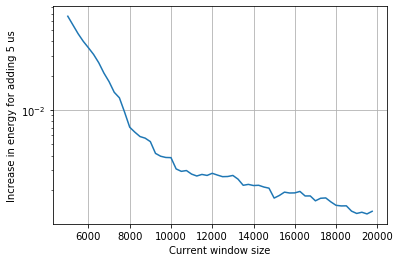

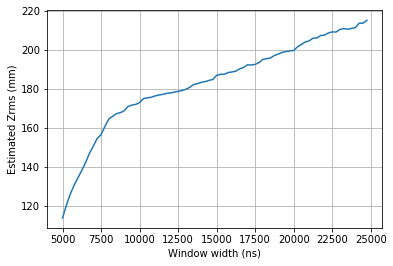

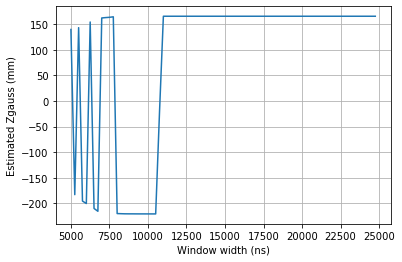

##############
EVENT NUMBER 5540
##############
Window size at which energy is 0.999: 21000
Zrms = 113.6107418496012


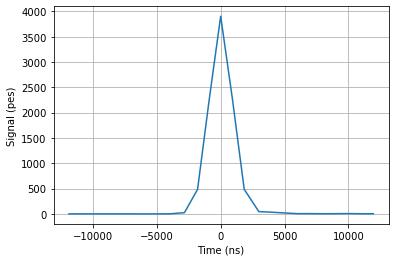

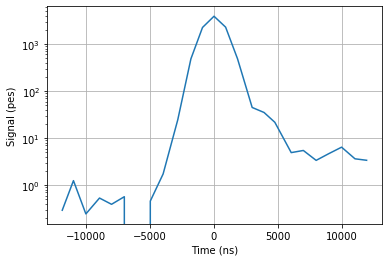

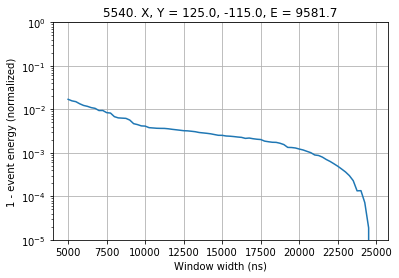

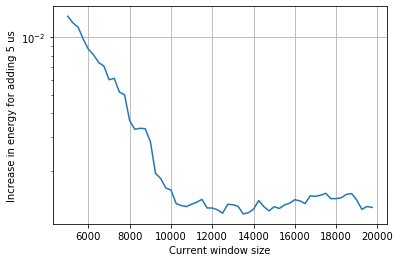

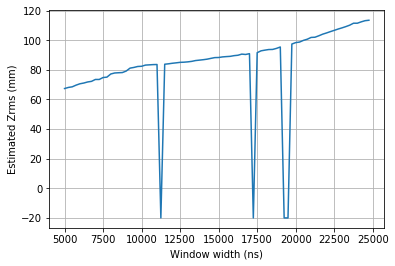

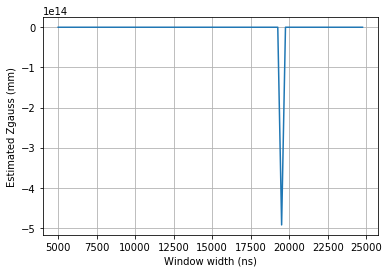

##############
EVENT NUMBER 5621
##############
Window size at which energy is 0.999: 20750
Zrms = 246.66475782325426


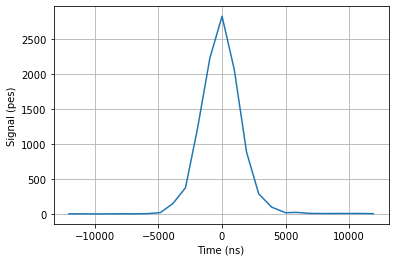

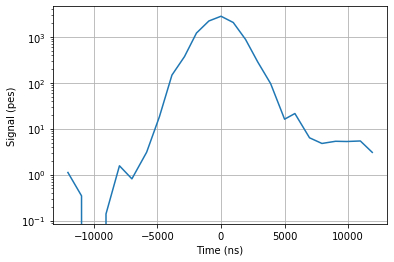

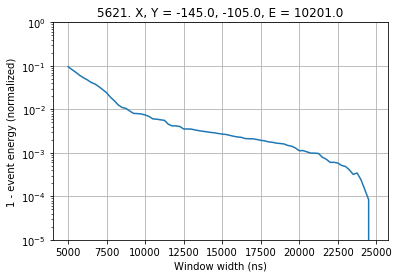

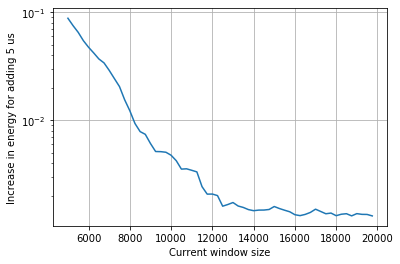

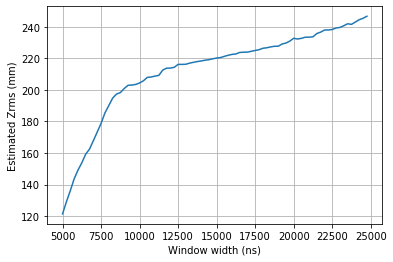

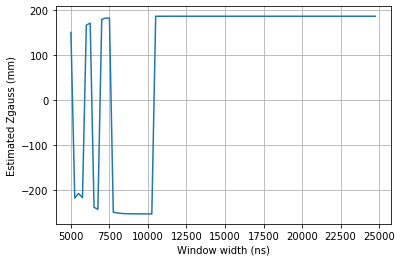

##############
EVENT NUMBER 5899
##############
Window size at which energy is 0.999: 20750
Zrms = 276.3927091796595


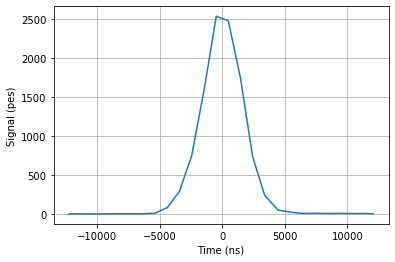

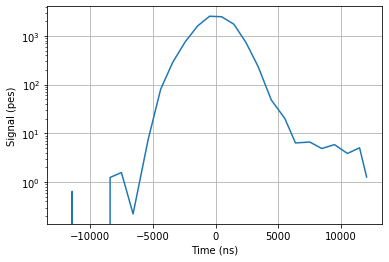

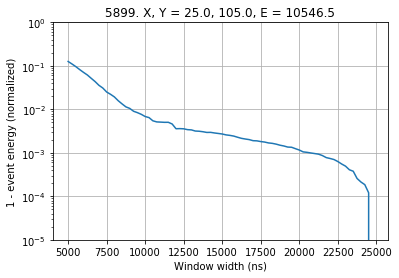

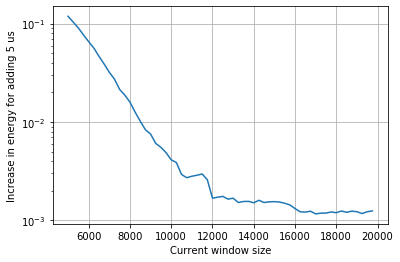

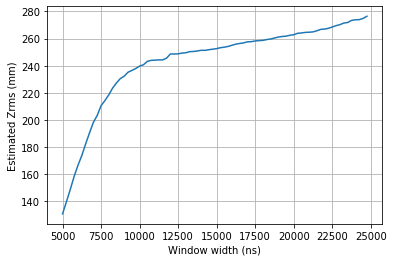

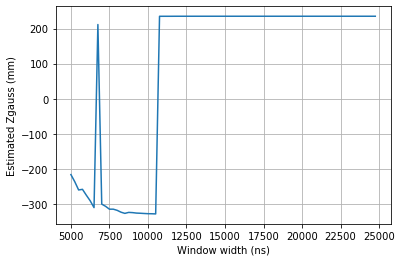

##############
EVENT NUMBER 5998
##############
Window size at which energy is 0.999: 21000
Zrms = 38.69012718966938


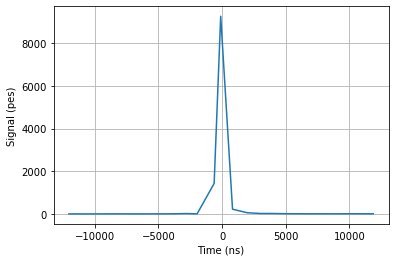

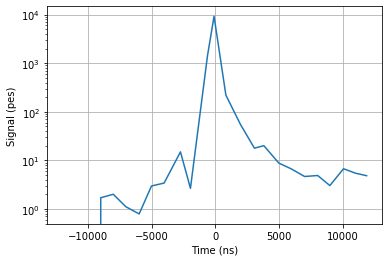

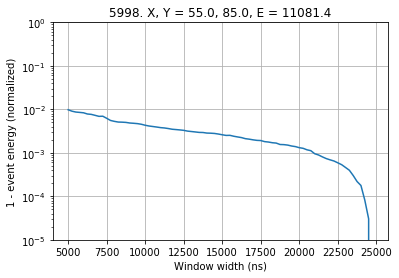

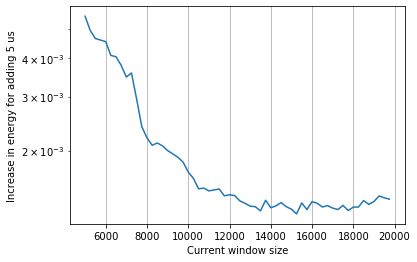

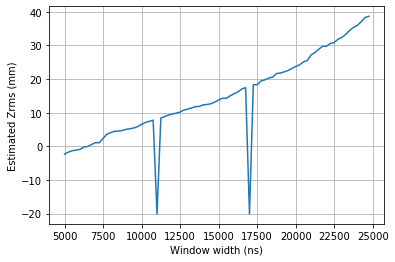

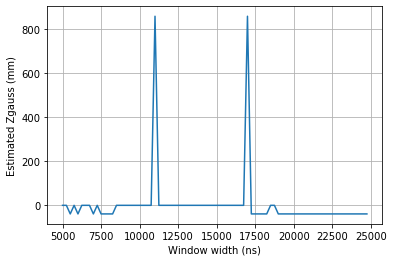

##############
EVENT NUMBER 6044
##############
Window size at which energy is 0.999: 20750
Zrms = 81.63657468005927


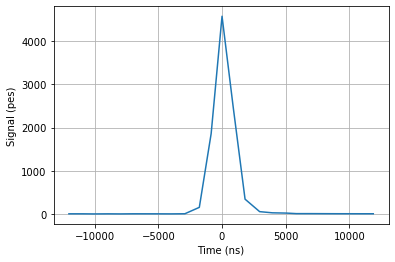

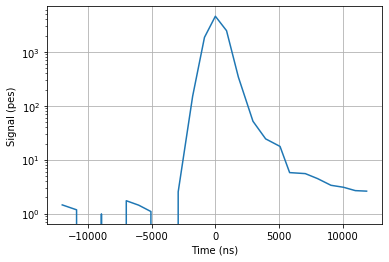

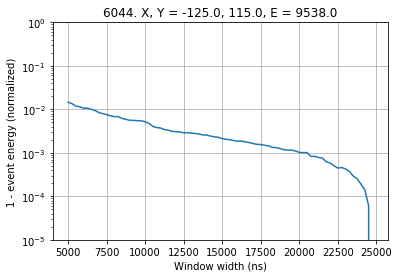

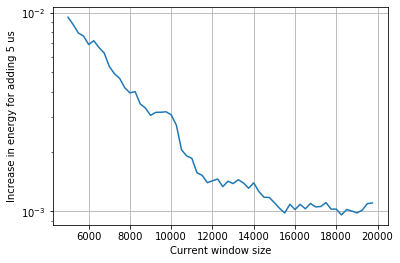

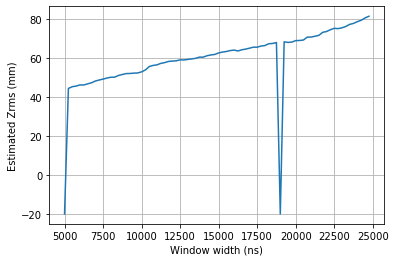

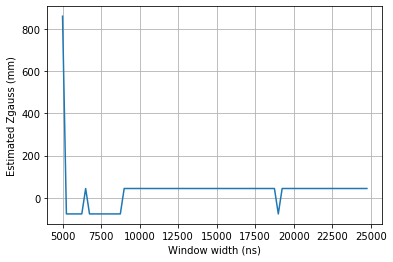

##############
EVENT NUMBER 6079
##############
Window size at which energy is 0.999: 20250
Zrms = 41.2340450483467


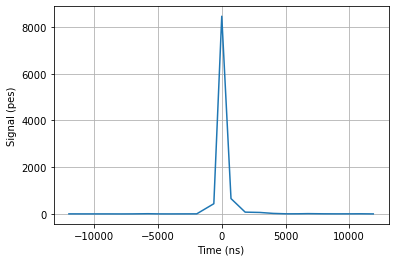

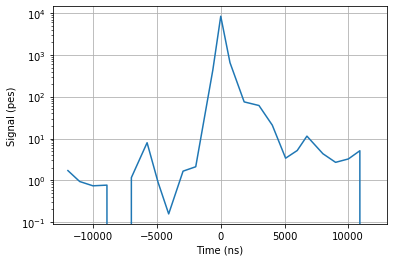

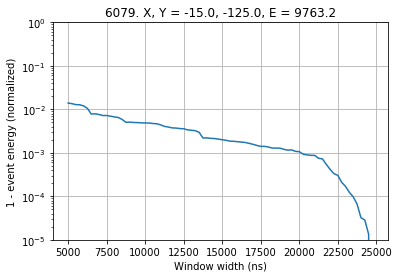

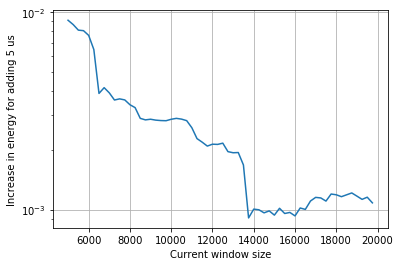

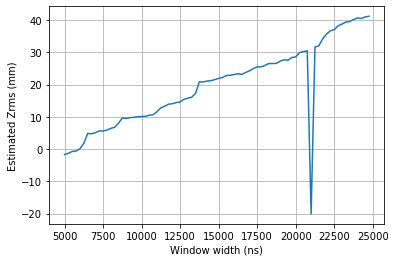

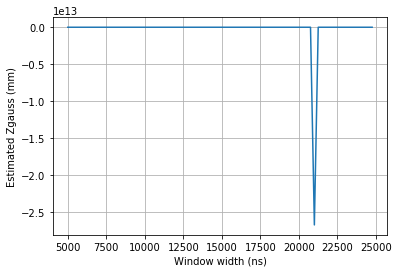

##############
EVENT NUMBER 6088
##############
Window size at which energy is 0.999: 21000
Zrms = 194.56793204021542


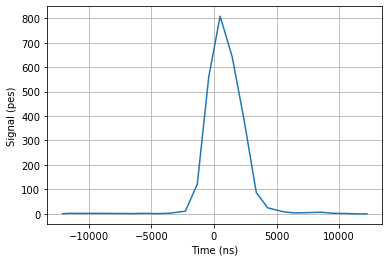

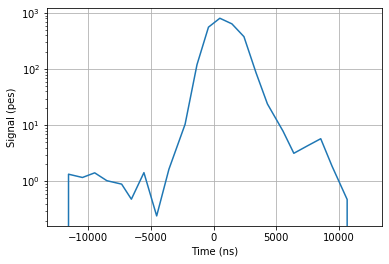

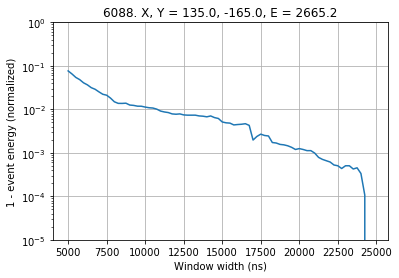

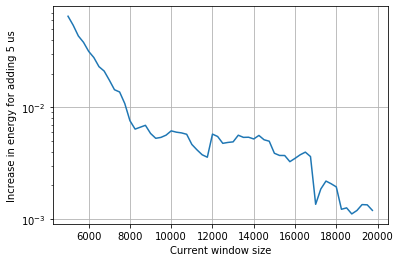

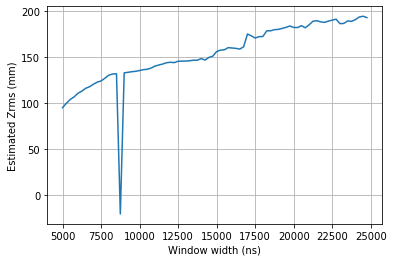

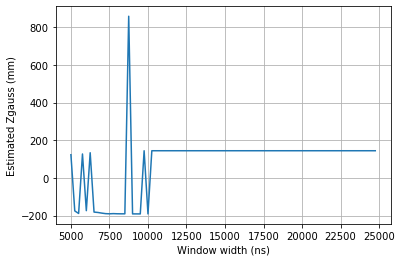

##############
EVENT NUMBER 6141
##############
Window size at which energy is 0.999: 20750
Zrms = 100.78921173706217


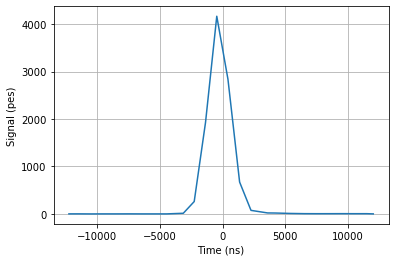

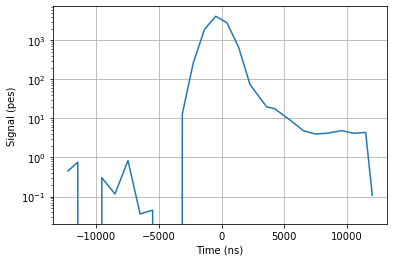

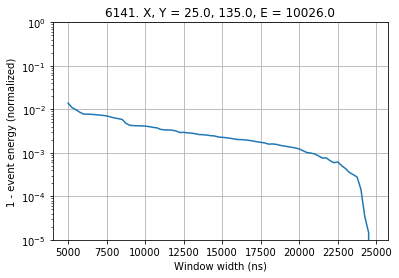

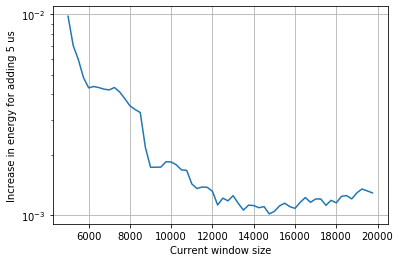

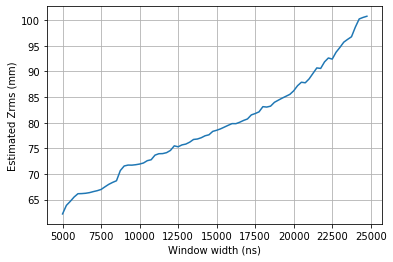

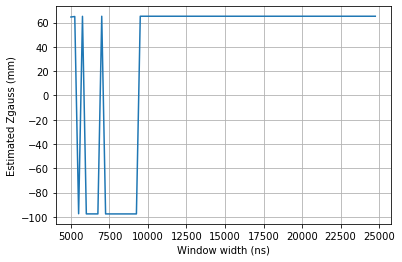

##############
EVENT NUMBER 6315
##############
Window size at which energy is 0.999: 22750
Zrms = 168.68729760815643


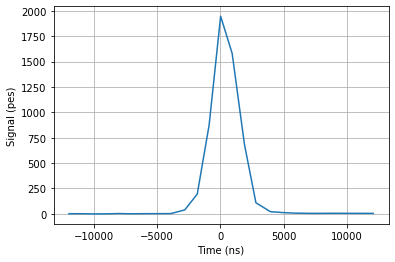

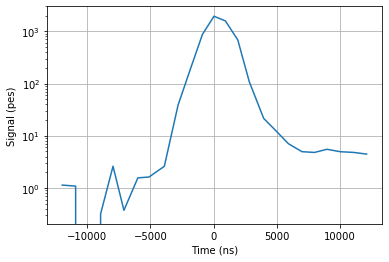

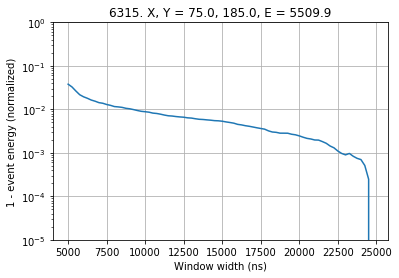

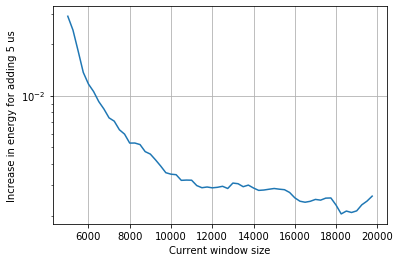

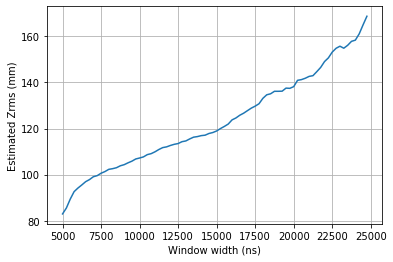

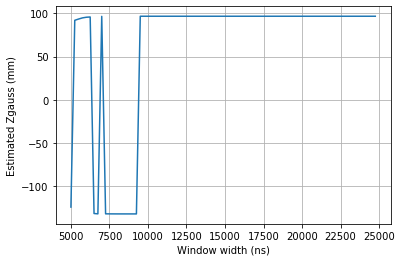

##############
EVENT NUMBER 6330
##############
Window size at which energy is 0.999: 21750
Zrms = 103.90261145400534


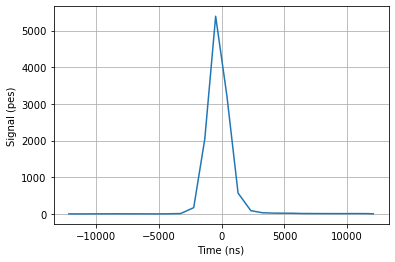

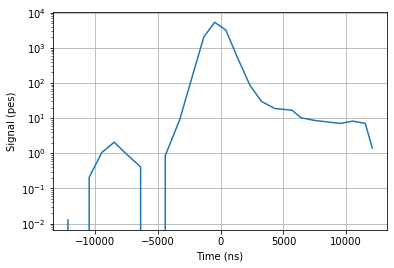

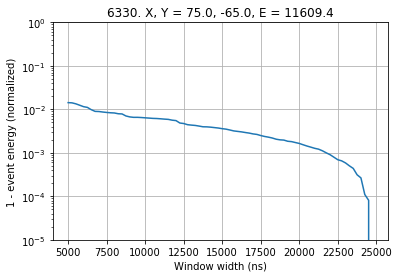

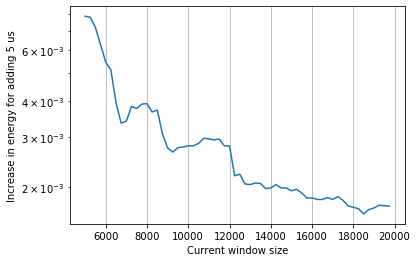

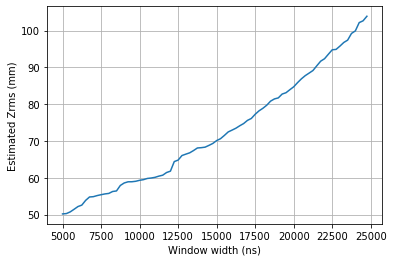

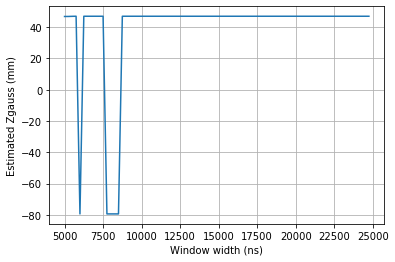

##############
EVENT NUMBER 6391
##############
Window size at which energy is 0.999: 22500
Zrms = 49.514041833618194


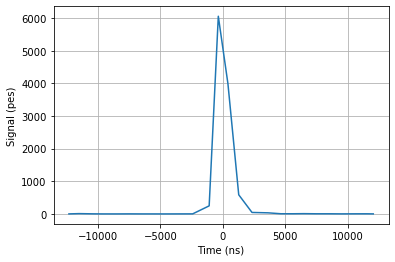

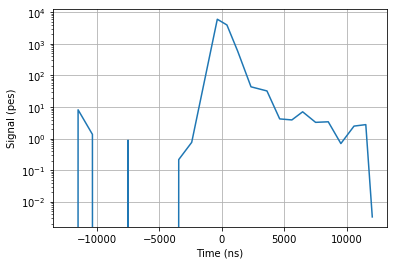

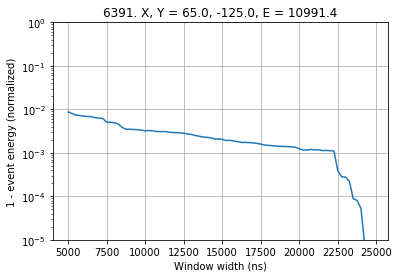

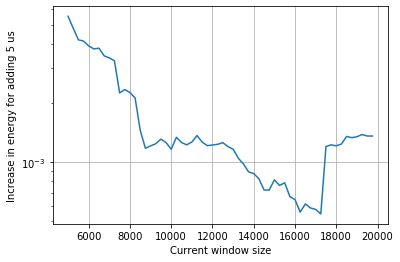

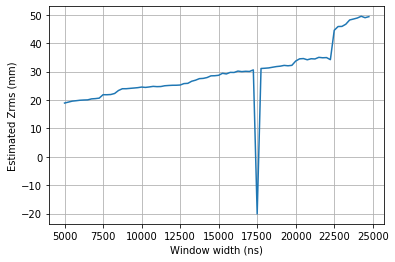

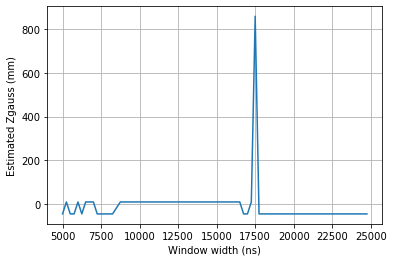

##############
EVENT NUMBER 6402
##############
Window size at which energy is 0.999: 21500
Zrms = 227.87703022838667


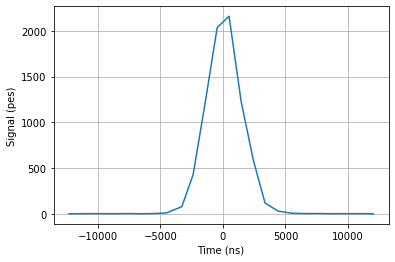

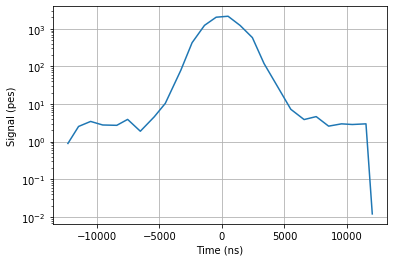

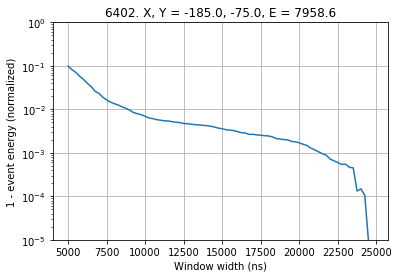

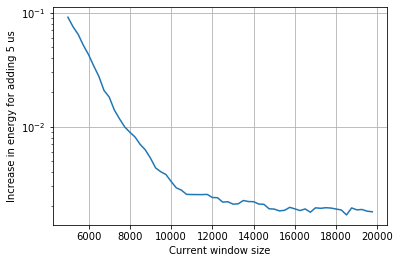

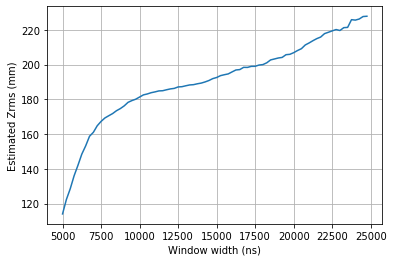

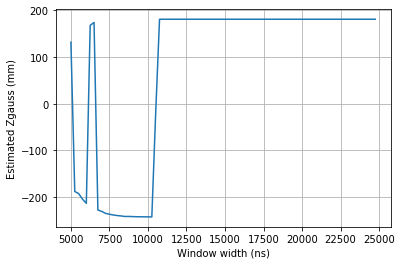

##############
EVENT NUMBER 6485
##############
Window size at which energy is 0.999: 20250
Zrms = 34.85301376052179


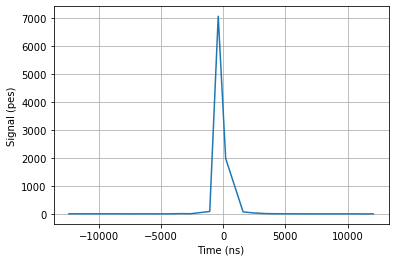

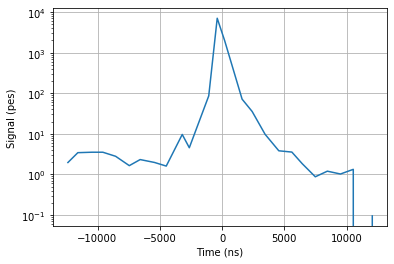

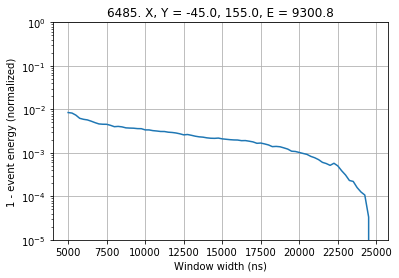

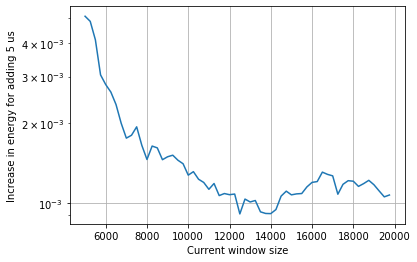

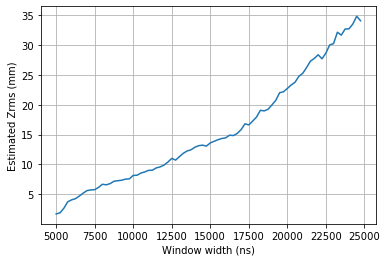

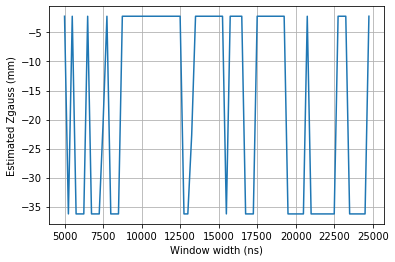

In [17]:
all_energy_cutoffs_999 = []
all_energy_cutoffs_99 = []
all_Zrms = []
all_Zgauss = []

maxshow = 100
shown = 0
for i_evt in range(len(events_window_energy_norm)):
    X = events_window_maxX[i_evt][-1]
    Y = events_window_maxY[i_evt][-1]
    E = round(max(events_window_energy[i_evt]), 1)
    Zrms = np.max(events_window_Zrms[i_evt])
    Zgauss = np.max(events_window_Zgauss[i_evt])
    if E > Ecut[0] and E < Ecut[1]:
        
        energy_cutoff_999 = 2 * (window_min + dwindow * np.argmax(np.array(events_window_energy_norm[i_evt]) > 0.999)) * ns_per_sample
        all_energy_cutoffs_999.append(energy_cutoff_999)

        energy_cutoff_99 = 2 * (window_min + dwindow * np.argmax(np.array(events_window_energy_norm[i_evt]) > 0.99)) * ns_per_sample
        all_energy_cutoffs_99.append(energy_cutoff_99)

        all_Zrms.append(Zrms)
        all_Zgauss.append(Zgauss)
        
        if shown < maxshow and energy_cutoff_999 > 20000 and Zrms < 300:

            shown += 1

            print('##############')
            print('EVENT NUMBER', i_evt)
            print('##############')

            print('Window size at which energy is 0.999:', energy_cutoff_999)
            print('Zrms =', Zrms)

            # Plot the waveform
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            plt.plot(events_times[i_evt] - np.mean(events_times[i_evt]), events_sumwf[i_evt])
            plt.grid(True)
            plt.show()

            # Plot the waveform, log scale
            plt.xlabel('Time (ns)')
            plt.ylabel('Signal (pes)')
            plt.yscale('log')
            plt.plot(events_times[i_evt] - np.mean(events_times[i_evt]), events_sumwf[i_evt])
            plt.grid(True)
            plt.show()

            # Plot the energy vs window width
            normed = np.array(events_window_energy_norm[i_evt])
            normed = 1 - normed
            plt.ylim(10**-5,10**0)
            plt.yscale('log')
            plt.title(str(i_evt)+'. X, Y = '+str(X)+', '+str(Y)+', E = '+str(E))
            plt.xlabel('Window width (ns)')
            plt.ylabel('1 - event energy (normalized)')
            plt.grid(True)
            plt.plot(events_window_cut, normed)
            plt.show()

            # Plot the increase for including 5 more us
            windows_in_5_us = int((5000 / ns_per_sample) / (2 * dwindow))
            change_next_five_us = np.array(events_window_energy_norm[i_evt][windows_in_5_us:]) - np.array(events_window_energy_norm[i_evt][:-windows_in_5_us])    
            plt.xlabel('Current window size')
            plt.ylabel('Increase in energy for adding 5 us')
            plt.yscale('log')
            plt.plot(events_window_cut[:-windows_in_5_us], change_next_five_us)
            plt.grid(True)
            plt.show()

            # Plot the Zrms estimate vs window width
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Zrms (mm)')
            plt.plot(events_window_cut, events_window_Zrms[i_evt])
            plt.grid(True)
            plt.show()
            
            # Plot the Zgauss estimate vs window width
            plt.xlabel('Window width (ns)')
            plt.ylabel('Estimated Zgauss (mm)')
            plt.plot(events_window_cut, events_window_Zgauss[i_evt])
            plt.grid(True)
            plt.show()

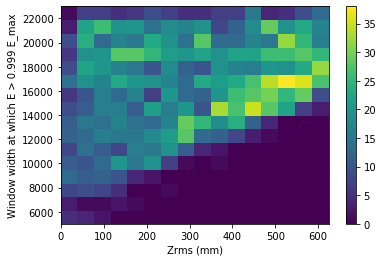

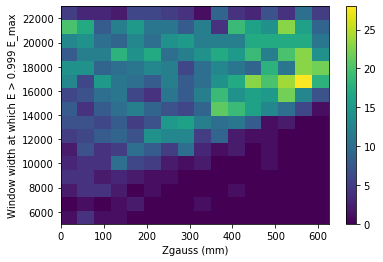

In [18]:
window_range = (5000, 23000)
bins = (16, 16)
zrange = (0, 625)

hrms = plt.hist2d(all_Zrms, all_energy_cutoffs_999, bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.999 E_max')
plt.colorbar(hrms[3])
plt.show()

hgauss = plt.hist2d(all_Zgauss, all_energy_cutoffs_999, bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.999 E_max')
plt.colorbar(hgauss[3])
plt.show()

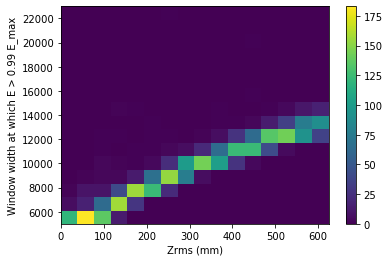

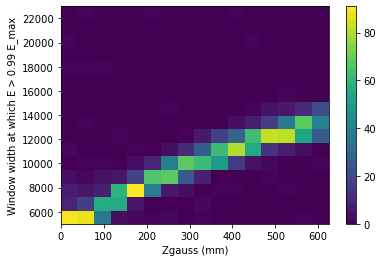

In [19]:
hrms = plt.hist2d(all_Zrms, all_energy_cutoffs_99, bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.colorbar(hrms[3])
plt.show()

hgauss = plt.hist2d(all_Zgauss, all_energy_cutoffs_99, bins = bins, range = (zrange, window_range))
plt.xlim(zrange)
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.colorbar(hgauss[3])
plt.show()

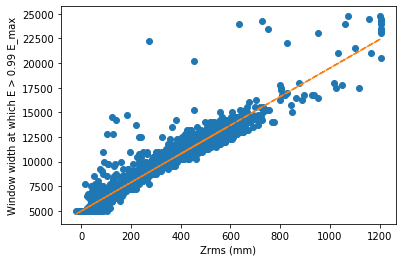

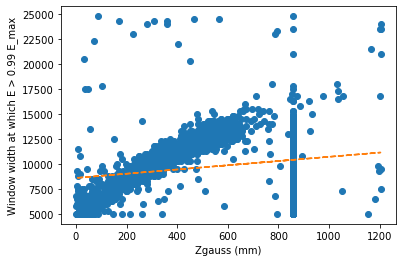

In [20]:
all_Zrms = np.array(all_Zrms)
all_Zgauss = np.array(all_Zgauss)
all_energy_cutoffs_99 = np.array(all_energy_cutoffs_99)
all_energy_cutoffs_999 = np.array(all_energy_cutoffs_999)

p = np.polyfit(all_Zrms, all_energy_cutoffs_99, 1)
line = np.array(all_Zrms)*p[0] + p[1]
plt.xlabel('Zrms (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.plot(all_Zrms, all_energy_cutoffs_99, 'o')
plt.plot(all_Zrms, line, '--')
plt.show()

good_gauss = all_Zgauss > 0
p = np.polyfit(all_Zgauss[good_gauss], all_energy_cutoffs_99[good_gauss], 1)
line = np.array(all_Zgauss[good_gauss])*p[0] + p[1]
plt.xlabel('Zgauss (mm)')
plt.ylabel('Window width at which E > 0.99 E_max')
plt.plot(all_Zgauss[good_gauss], all_energy_cutoffs_99[good_gauss], 'o')
plt.plot(all_Zgauss[good_gauss], line, '--')
plt.show()

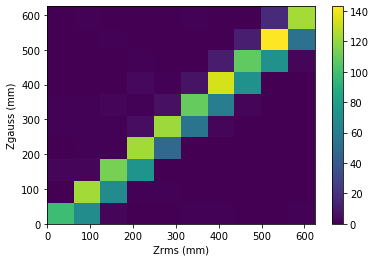

In [21]:
hZ = plt.hist2d(all_Zrms, all_Zgauss, range = (zrange, zrange))
plt.xlabel('Zrms (mm)')
plt.ylabel('Zgauss (mm)')
plt.colorbar(hZ[3])
plt.show()

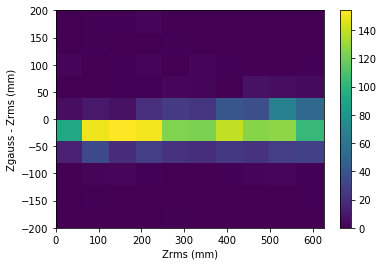

In [22]:
all_dZ = np.array(all_Zgauss) - np.array(all_Zrms)
dzrange = (-200, 200)
hdZ = plt.hist2d(all_Zrms, all_dZ, range = (zrange, dzrange))
plt.xlabel('Zrms (mm)')
plt.ylabel('Zgauss - Zrms (mm)')
plt.colorbar(hdZ[3])
plt.show()

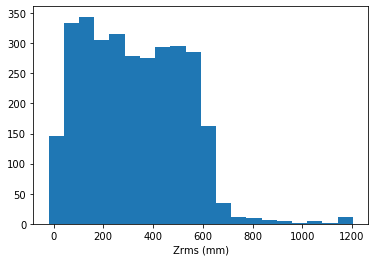

In [23]:
plt.hist(all_Zrms, bins = 20)
plt.xlabel('Zrms (mm)')
plt.show()

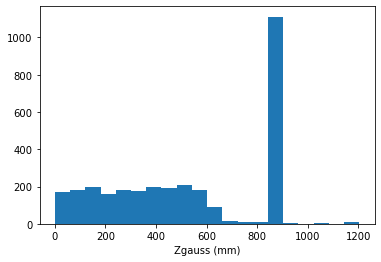

In [26]:
plt.hist(all_Zgauss[good_gauss], bins = 20)
plt.xlabel('Zgauss (mm)')
plt.show()

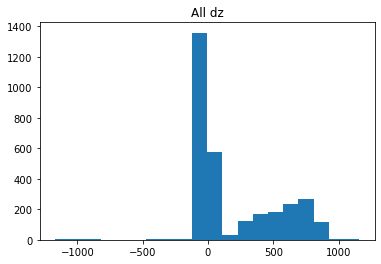

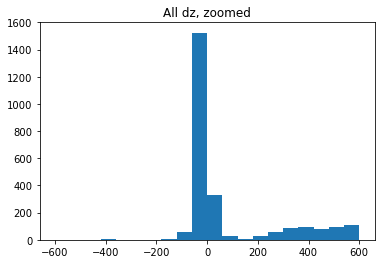

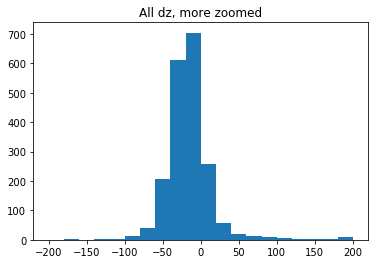

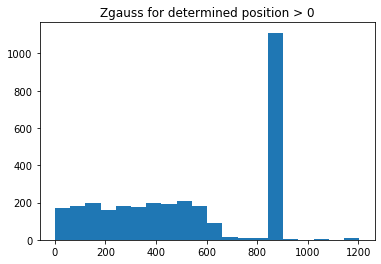

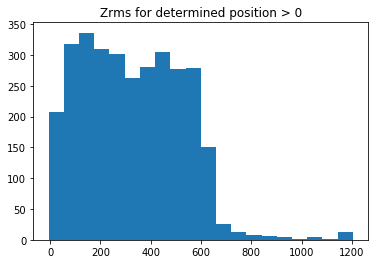

In [25]:
mask = all_Zgauss > 0
dZ = all_Zgauss[mask] - all_Zrms[mask]

plt.hist(dZ, bins = 20)
plt.title('All dz')
plt.show()

plt.hist(dZ, bins = 20, range = (-600, 600))
plt.title('All dz, zoomed')
plt.show()

plt.hist(dZ, bins = 20, range = (-200, 200))
plt.title('All dz, more zoomed')
plt.show()

plt.hist(all_Zgauss[mask], bins = 20)
plt.title('Zgauss for determined position > 0')
plt.show()

plt.hist(all_Zrms[mask], bins = 20)
plt.title('Zrms for determined position > 0')
plt.show()